# Import Library

In [ ]:
# Import library
import pandas as pd
import numpy as np

# Preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Models
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import StackingClassifier

# Resampling Method
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import ADASYN
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.under_sampling import TomekLinks
from imblearn.under_sampling import EditedNearestNeighbours
from imblearn.combine import SMOTEENN
from imblearn.combine import SMOTETomek

# Evaluation
from sklearn.metrics import classification_report, confusion_matrix, recall_score, precision_score, f1_score, accuracy_score, ConfusionMatrixDisplay

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import classification_report, recall_score, precision_score, f1_score
from scipy.stats import randint, uniform

# Visualisation
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from math import pi
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

In [1]:
pip list

Package                                  Version
---------------------------------------- ------------------
a2a-sdk                                  0.3.26
absl-py                                  1.4.0
accelerate                               1.13.0
access                                   1.1.10.post3
affine                                   2.4.0
aiofiles                                 22.1.0
aiohappyeyeballs                         2.6.1
aiohttp                                  3.13.5
aiosignal                                1.4.0
aiosqlite                                0.22.1
alabaster                                1.0.0
albucore                                 0.0.24
albumentations                           2.0.8
ale-py                                   0.11.2
alembic                                  1.18.4
altair                                   5.5.0
annotated-doc                            0.0.4
annotated-types                          0.7.0
antlr4-python3-runtime        

# Load Data

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#df = pd.read_csv('/content/drive/MyDrive/Tugas Akhir/creditcard.csv')

In [4]:
df = pd.read_csv('/kaggle/input/datasets/davinfisabilillah/credit-card/creditcard.csv')

In [5]:
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [6]:
df.tail()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0
284806,172792.0,-0.533413,-0.189733,0.703337,-0.506271,-0.012546,-0.649617,1.577006,-0.414650,0.486180,...,0.261057,0.643078,0.376777,0.008797,-0.473649,-0.818267,-0.002415,0.013649,217.00,0


In [7]:
print(f'Dataset shape: {df.shape}')

Dataset shape: (284807, 31)


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Time,284807.0,9.481386e+04,47488.145955,0.000000,54201.500000,84692.000000,139320.500000,172792.000000
V1,284807.0,1.175161e-15,1.958696,-56.407510,-0.920373,0.018109,1.315642,2.454930
V2,284807.0,3.384974e-16,1.651309,-72.715728,-0.598550,0.065486,0.803724,22.057729
V3,284807.0,-1.379537e-15,1.516255,-48.325589,-0.890365,0.179846,1.027196,9.382558
V4,284807.0,2.094852e-15,1.415869,-5.683171,-0.848640,-0.019847,0.743341,16.875344
V5,284807.0,1.021879e-15,1.380247,-113.743307,-0.691597,-0.054336,0.611926,34.801666
V6,284807.0,1.494498e-15,1.332271,-26.160506,-0.768296,-0.274187,0.398565,73.301626
V7,284807.0,-5.620335e-16,1.237094,-43.557242,-0.554076,0.040103,0.570436,120.589494
V8,284807.0,1.149614e-16,1.194353,-73.216718,-0.208630,0.022358,0.327346,20.007208
V9,284807.0,-2.414189e-15,1.098632,-13.434066,-0.643098,-0.051429,0.597139,15.594995


In [11]:
print("Distribusi kelas Target (Persentase):\n", df['Class'].value_counts(normalize=True))
print("Distribusi kelas Target:\n", df['Class'].value_counts())

Distribusi kelas Target (Persentase):
 Class
0    0.998273
1    0.001727
Name: proportion, dtype: float64
Distribusi kelas Target:
 Class
0    284315
1       492
Name: count, dtype: int64


# EDA

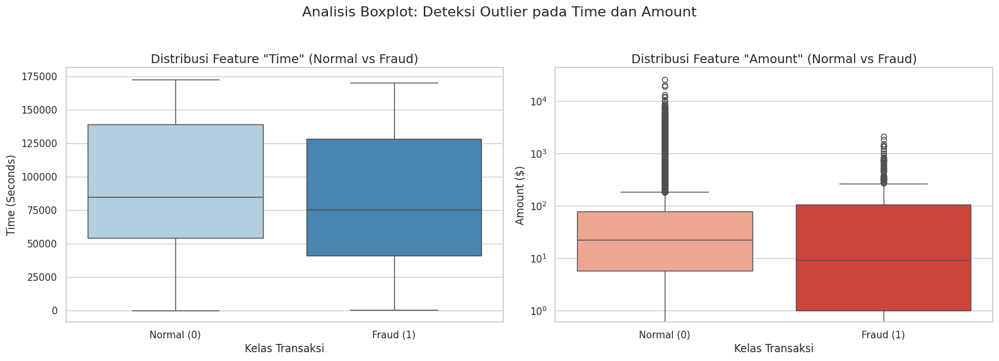

In [ ]:
# Mengatur gaya visualisasi
sns.set(style="whitegrid")

# Membuat Figure dengan 2 Subplot (Kiri: Time, Kanan: Amount)
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# --- PLOT 1: Boxplot untuk Feature 'Time' ---
# memisahkan berdasarkan 'Class' agar terlihat beda pola Fraud vs Normal
sns.boxplot(x="Class", y="Time", data=df, ax=axes[0], palette="Blues")
axes[0].set_title('Distribusi Feature "Time" (Normal vs Fraud)', fontsize=14)
axes[0].set_xticklabels(['Normal (0)', 'Fraud (1)'])
axes[0].set_xlabel('Kelas Transaksi')
axes[0].set_ylabel('Time (Seconds)')

# --- PLOT 2: Boxplot untuk Feature 'Amount' ---
# Menggunakan skala logaritma karena 'Amount' biasanya memiliki outlier ekstrem
sns.boxplot(x="Class", y="Amount", data=df, ax=axes[1], palette="Reds")
axes[1].set_title('Distribusi Feature "Amount" (Normal vs Fraud)', fontsize=14)
axes[1].set_xticklabels(['Normal (0)', 'Fraud (1)'])
axes[1].set_xlabel('Kelas Transaksi')
axes[1].set_ylabel('Amount ($)')
axes[1].set_yscale('log') 

plt.suptitle('Analisis Boxplot: Deteksi Outlier pada Time dan Amount', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Agar judul utama tidak tertutup
plt.show()

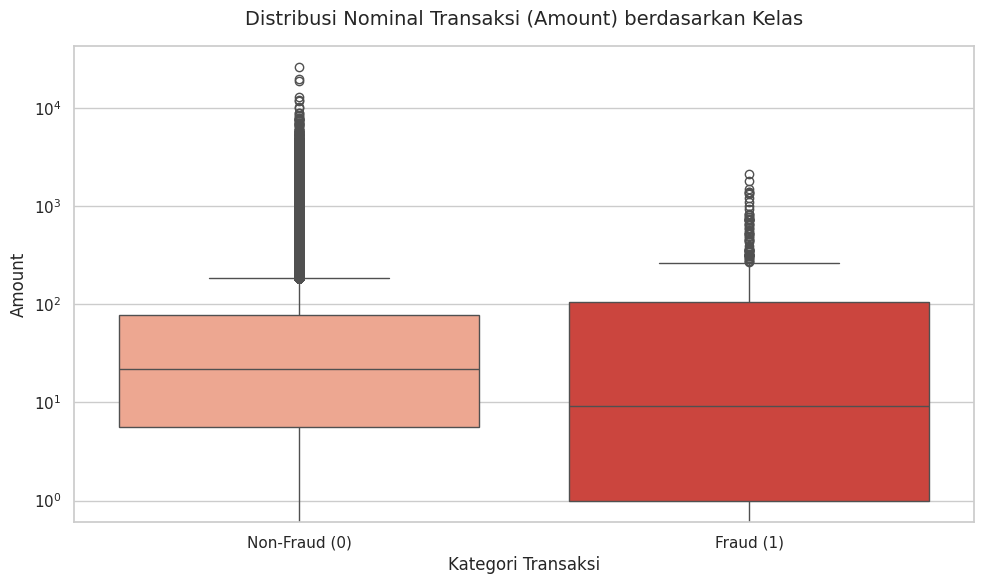

In [ ]:
# Setup Gaya Visualisasi
sns.set_style("whitegrid")
plt.figure(figsize=(10, 6))

# Membuat Boxplot Amount
# Kita gunakan skala Logaritma (yscale='log') karena biasanya ada outlier nilai sangat besar
# yang membuat boxplot menjadi gepeng jika menggunakan skala linear biasa.
sns.boxplot(x='Class', y='Amount', data=df, palette="Reds")

plt.title('Distribusi Nominal Transaksi (Amount) berdasarkan Kelas', fontsize=14, pad=15)
plt.xlabel('Kategori Transaksi', fontsize=12)
plt.ylabel('Amount', fontsize=12)
plt.xticks([0, 1], ['Non-Fraud (0)', 'Fraud (1)'])
plt.yscale('log') # Matikan baris ini jika ingin melihat skala asli (linear)

plt.tight_layout()
plt.show()

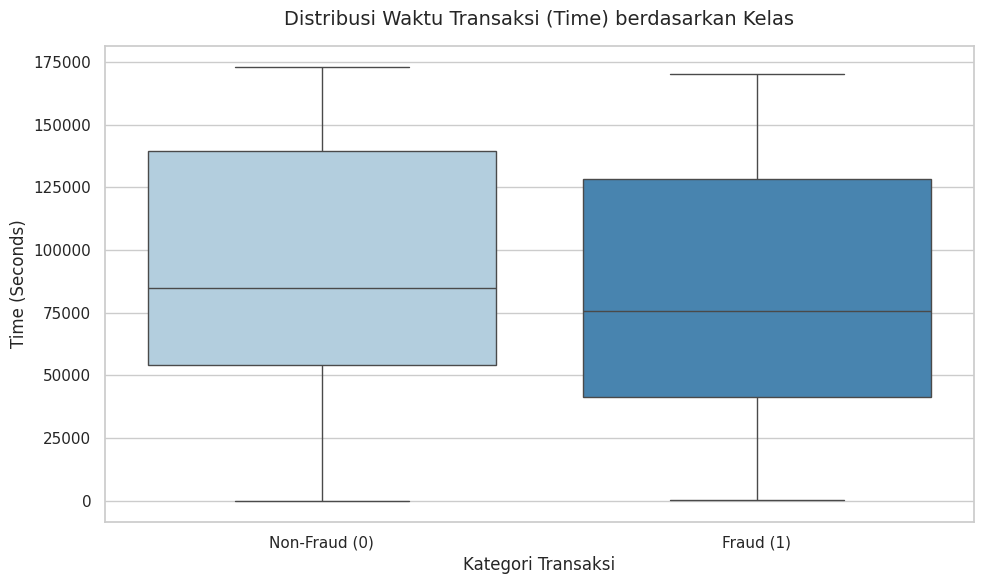

In [ ]:
# Setup Gaya Visualisasi
sns.set_style("whitegrid")
plt.figure(figsize=(10, 6))

# Membuat Boxplot Time
sns.boxplot(x='Class', y='Time', data=df, palette="Blues")

# Mempercantik Label
plt.title('Distribusi Waktu Transaksi (Time) berdasarkan Kelas', fontsize=14, pad=15)
plt.xlabel('Kategori Transaksi', fontsize=12)
plt.ylabel('Time (Seconds)', fontsize=12)
plt.xticks([0, 1], ['Non-Fraud (0)', 'Fraud (1)'])

plt.tight_layout()
plt.show()

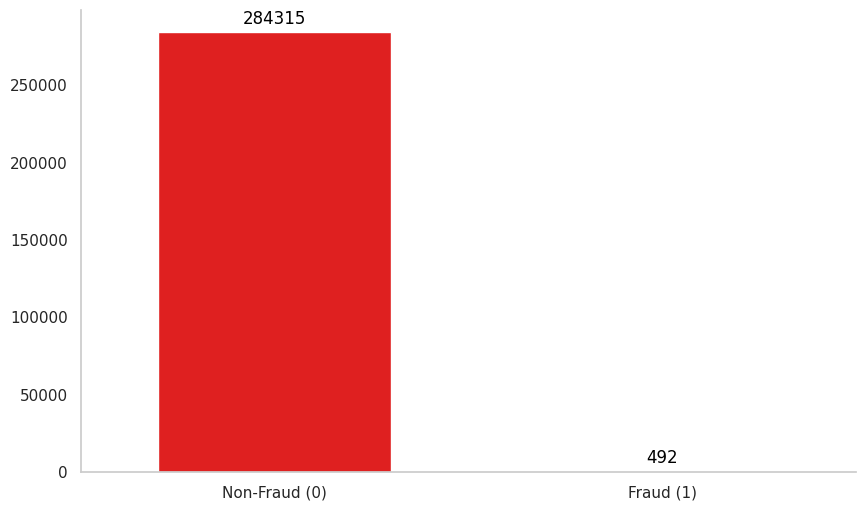

In [ ]:
plt.figure(figsize=(10, 6))
ax = (sns.countplot(x=df['Class'], palette={'0': 'Red', '1': 'Blue'}, width=0.6))
ax.set_xlabel('')
ax.set_ylabel('')
plt.grid(False)

label_mapping = {
    '0': 'Non-Fraud (0)',
    '1': 'Fraud (1)'
}

current_labels = [label.get_text() for label in ax.get_xticklabels()]
new_labels = [label_mapping.get(label, label) for label in current_labels]

ax.set_xticklabels(new_labels)

for p in ax.patches:
    ax.annotate(
        int(p.get_height()),
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center', va='bottom', fontsize=12, color='black',
        xytext=(0, 3), textcoords='offset points'
    )
sns.despine()
plt.show()

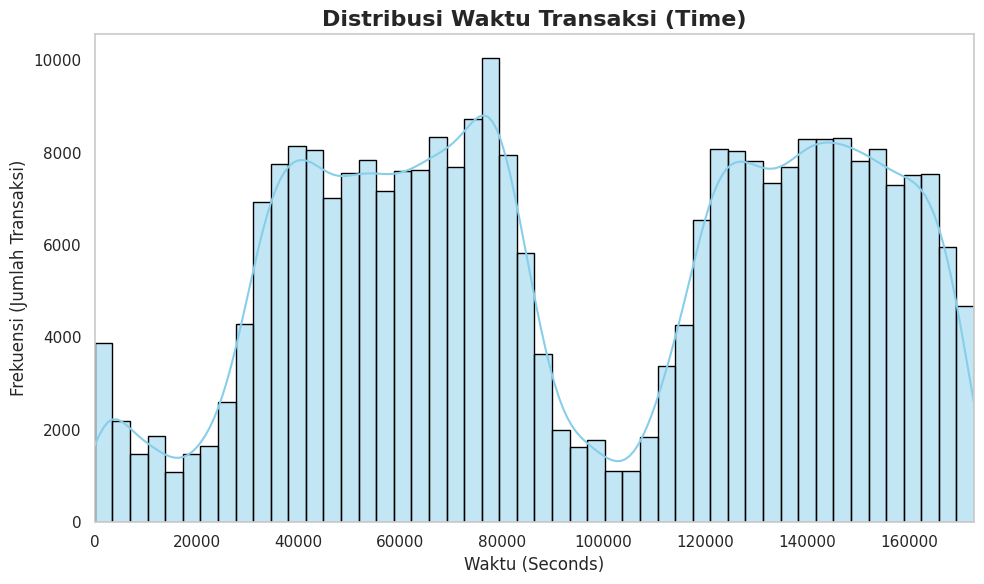

In [ ]:
# Setup Gaya Visualisasi
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# Membuat Histogram Time
sns.histplot(data=df, x='Time', bins=50, kde=True, color='skyblue', edgecolor='black')

# Label dan Judul
plt.title('Distribusi Waktu Transaksi (Time)', fontsize=16, fontweight='bold')
plt.xlabel('Waktu (Seconds)', fontsize=12)
plt.ylabel('Frekuensi (Jumlah Transaksi)', fontsize=12)
plt.grid(False)

# Menambahkan batas sumbu x agar sesuai durasi data (0 sampai sekitar 172792 detik)
plt.xlim([0, df['Time'].max()])

plt.tight_layout()
plt.show()

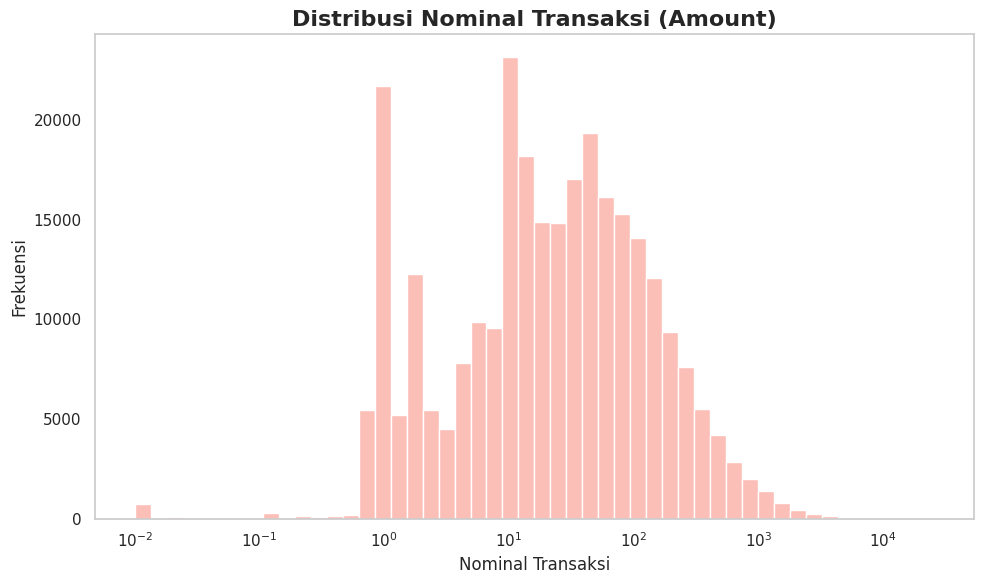

In [ ]:
# Setup Gaya Visualisasi
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

# Membuat Histogram Amount
sns.histplot(data=df, x='Amount', bins=50, kde=True, color='salmon', log_scale=True)

# Label dan Judul
plt.title('Distribusi Nominal Transaksi (Amount)', fontsize=16, fontweight='bold')
plt.xlabel('Nominal Transaksi', fontsize=12)
plt.ylabel('Frekuensi', fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.show()

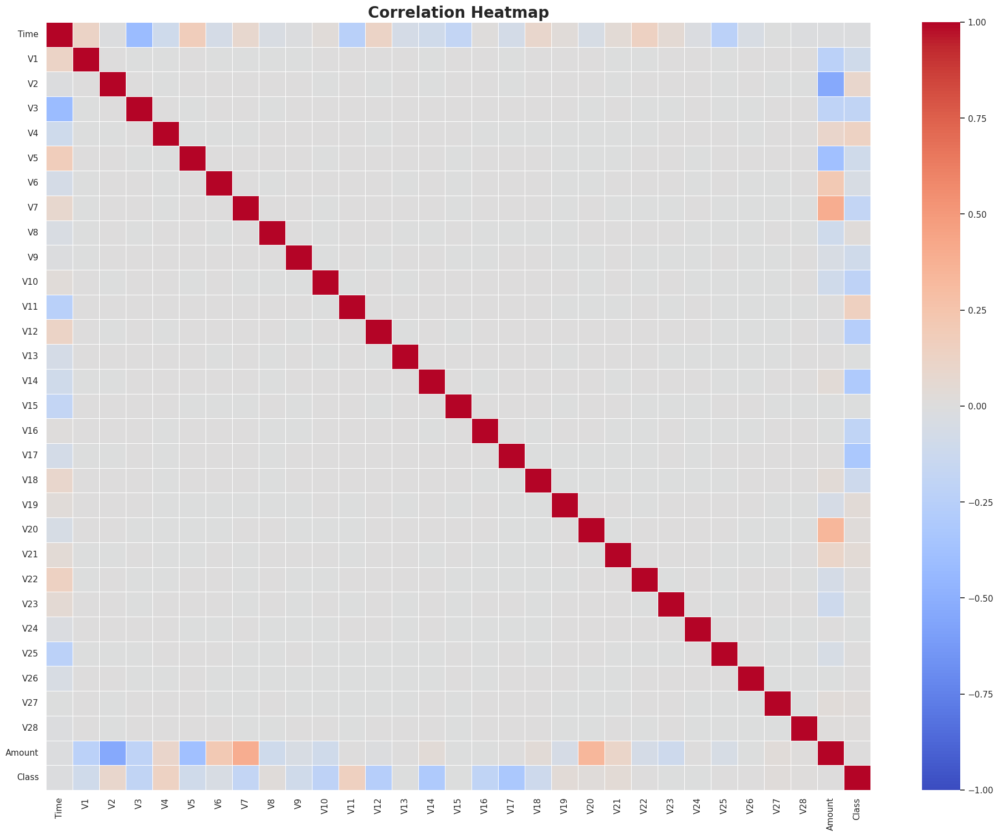

In [ ]:
corr_matrix = df.corr()

plt.figure(figsize=(24, 18))

sns.heatmap(corr_matrix, cmap='coolwarm', annot=False, linewidths=0.5, vmin=-1, vmax=1)

plt.title('Correlation Heatmap', fontsize=20, fontweight='bold')
plt.show()

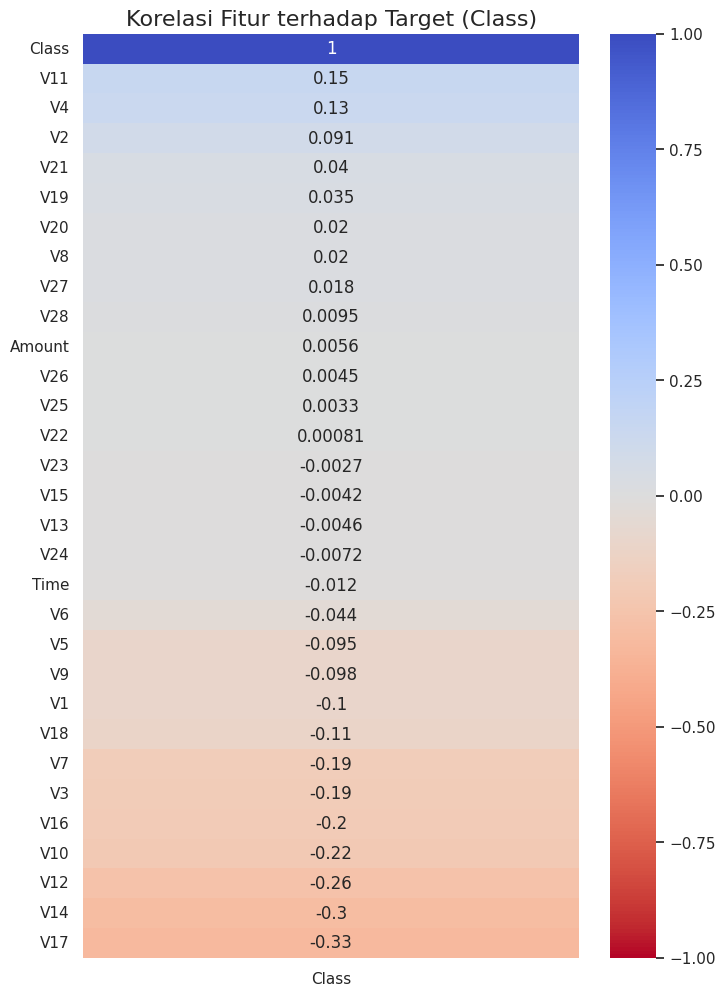

In [ ]:
plt.figure(figsize=(8, 12))
heatmap = sns.heatmap(df.corr()[['Class']].sort_values(by='Class', ascending=False),
                      vmin=-1, vmax=1, annot=True, cmap='coolwarm_r')
plt.title('Korelasi Fitur terhadap Target (Class)', fontsize=16)
plt.show()

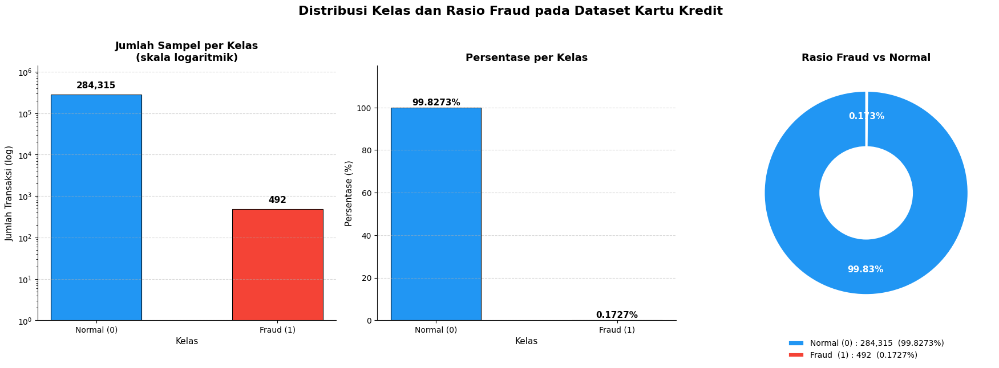


=== Ringkasan Distribusi Kelas ===
Total sampel         : 284,807
Transaksi Normal (0) : 284,315  (99.8273%)
Transaksi Fraud  (1) : 492  (0.1727%)
Rasio Imbalance      : 577.9:1  (Normal : Fraud)


In [ ]:
# ============================================================
# VISUALISASI DISTRIBUSI KELAS (0 vs 1) DAN RASIO FRAUD
# ============================================================

# Hitung distribusi kelas
class_counts = df['Class'].value_counts().sort_index()
class_labels = ['Normal (0)', 'Fraud (1)']
counts = [class_counts[0], class_counts[1]]
total = sum(counts)
fraud_ratio = counts[1] / total * 100
normal_ratio = counts[0] / total * 100

# Palet warna
colors_bar = ['#2196F3', '#F44336']
colors_pie = ['#2196F3', '#F44336']

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle(
    'Distribusi Kelas dan Rasio Fraud pada Dataset Kartu Kredit',
    fontsize=16, fontweight='bold', y=1.02
)

# ── Plot 1: Bar Chart Jumlah Sampel (skala log) ─────────────────────────────
ax1 = axes[0]
bars = ax1.bar(
    class_labels, counts, color=colors_bar,
    edgecolor='black', linewidth=0.8, width=0.5
)
ax1.set_title('Jumlah Sampel per Kelas\n(skala logaritmik)', fontsize=13, fontweight='bold')
ax1.set_xlabel('Kelas', fontsize=11)
ax1.set_ylabel('Jumlah Transaksi (log)', fontsize=11)
ax1.set_yscale('log')
for bar, count in zip(bars, counts):
    ax1.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() * 1.3,
        f'{count:,}',
        ha='center', va='bottom', fontsize=11, fontweight='bold'
    )
ax1.set_ylim(1, max(counts) * 5)
ax1.grid(axis='y', linestyle='--', alpha=0.5)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# ── Plot 2: Bar Chart Persentase ─────────────────────────────────────────────
ax2 = axes[1]
percentages = [normal_ratio, fraud_ratio]
bars2 = ax2.bar(
    class_labels, percentages, color=colors_bar,
    edgecolor='black', linewidth=0.8, width=0.5
)
ax2.set_title('Persentase per Kelas', fontsize=13, fontweight='bold')
ax2.set_xlabel('Kelas', fontsize=11)
ax2.set_ylabel('Persentase (%)', fontsize=11)
for bar, pct in zip(bars2, percentages):
    ax2.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 0.4,
        f'{pct:.4f}%',
        ha='center', va='bottom', fontsize=11, fontweight='bold'
    )
ax2.set_ylim(0, max(percentages) * 1.2)
ax2.grid(axis='y', linestyle='--', alpha=0.5)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

# ── Plot 3: Donut Chart Rasio Fraud ──────────────────────────────────────────
ax3 = axes[2]
wedge_props = dict(width=0.55, edgecolor='white', linewidth=2)
wedges, texts, autotexts = ax3.pie(
    counts,
    labels=None,
    autopct=lambda pct: f'{pct:.3f}%' if pct < 1 else f'{pct:.2f}%',
    colors=colors_pie,
    startangle=90,
    wedgeprops=wedge_props,
    pctdistance=0.75,
    textprops=dict(fontsize=11, fontweight='bold')
)
for autotext in autotexts:
    autotext.set_color('white')
legend_labels = [
    f'Normal (0) : {counts[0]:,}  ({normal_ratio:.4f}%)',
    f'Fraud  (1) : {counts[1]:,}  ({fraud_ratio:.4f}%)'
]
ax3.legend(
    wedges, legend_labels,
    loc='lower center', bbox_to_anchor=(0.5, -0.18),
    fontsize=10, frameon=False
)
ax3.set_title('Rasio Fraud vs Normal', fontsize=13, fontweight='bold')

plt.tight_layout()
plt.show()

print('\n=== Ringkasan Distribusi Kelas ===')
print(f'Total sampel         : {total:,}')
print(f'Transaksi Normal (0) : {counts[0]:,}  ({normal_ratio:.4f}%)')
print(f'Transaksi Fraud  (1) : {counts[1]:,}  ({fraud_ratio:.4f}%)')
print(f'Rasio Imbalance      : {counts[0] / counts[1]:.1f}:1  (Normal : Fraud)')


# Data Preprocessing

In [10]:
df.isnull().sum().sort_values(ascending=False)

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

In [10]:
df.duplicated().sum()

np.int64(1081)

In [5]:
# Pisahkan fitur dan target
X = df.drop('Class', axis=1)
y = df['Class']

In [6]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    stratify=y,
    random_state=42
)

print("Train distribution:\n", y_train.value_counts(normalize=True))
print("Test distribution:\n", y_test.value_counts(normalize=True))

Train distribution:
 Class
0    0.998271
1    0.001729
Name: proportion, dtype: float64
Test distribution:
 Class
0    0.99828
1    0.00172
Name: proportion, dtype: float64


In [7]:
scaler = StandardScaler()

# Fit hanya di train (hindari data leakage)
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Baseline

=== RANDOM FOREST BASELINE ===
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.94      0.82      0.87        98

    accuracy                           1.00     56962
   macro avg       0.97      0.91      0.94     56962
weighted avg       1.00      1.00      1.00     56962



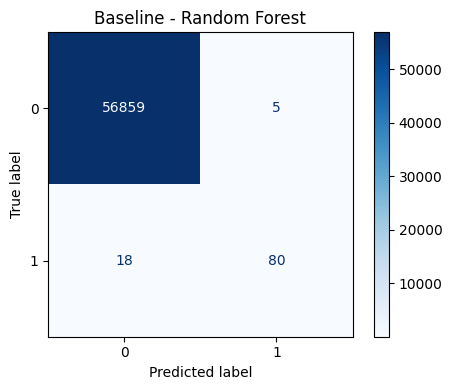

Recall: 0.8163265306122449
Precision: 0.9411764705882353
F1: 0.8743169398907104
Accuracy: 0.9995962220427653


In [8]:
rf = RandomForestClassifier(random_state=42)

rf.fit(X_train_scaled, y_train)
y_pred_rf = rf.predict(X_test_scaled)

print("=== RANDOM FOREST BASELINE ===")
print(classification_report(y_test, y_pred_rf))
cm = confusion_matrix(y_test, y_pred_rf)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("Baseline - Random Forest")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_rf))
print("Precision:", precision_score(y_test, y_pred_rf))
print("F1:", f1_score(y_test, y_pred_rf))
print("Accuracy:", accuracy_score(y_test, y_pred_rf))

=== XGBOOST BASELINE ===
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.87      0.80      0.83        98

    accuracy                           1.00     56962
   macro avg       0.93      0.90      0.91     56962
weighted avg       1.00      1.00      1.00     56962



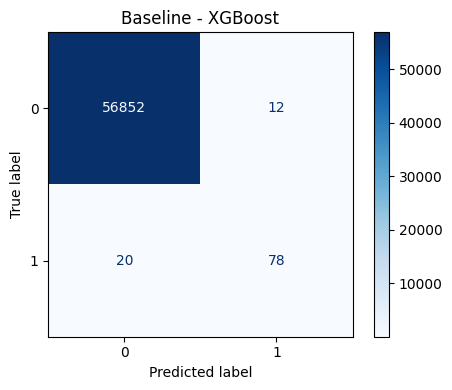

Recall: 0.7959183673469388
Precision: 0.8666666666666667
F1: 0.8297872340425532
Accuracy: 0.9994382219725431


In [9]:
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss')

xgb.fit(X_train_scaled, y_train)
y_pred_xgb = xgb.predict(X_test_scaled)

print("=== XGBOOST BASELINE ===")
print(classification_report(y_test, y_pred_xgb))
cm = confusion_matrix(y_test, y_pred_xgb)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("Baseline - XGBoost")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_xgb))
print("Precision:", precision_score(y_test, y_pred_xgb))
print("F1:", f1_score(y_test, y_pred_xgb))
print("Accuracy:", accuracy_score(y_test, y_pred_xgb))

=== Gradient Boosting Baseline ===
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.53      0.18      0.27        98

    accuracy                           1.00     56962
   macro avg       0.76      0.59      0.64     56962
weighted avg       1.00      1.00      1.00     56962



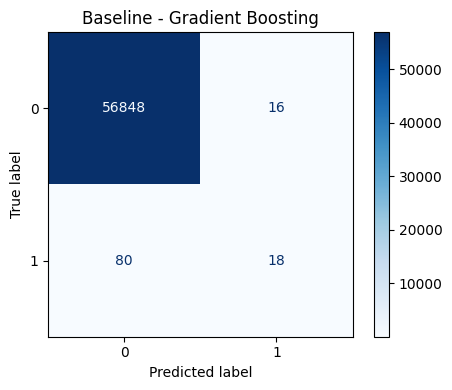

Recall: 0.1836734693877551
Precision: 0.5294117647058824
F1: 0.2727272727272727
Accuracy: 0.9983146659176293


In [10]:
gb = GradientBoostingClassifier(random_state=42)

gb.fit(X_train_scaled, y_train)
y_pred_gb = gb.predict(X_test_scaled)

print("=== Gradient Boosting Baseline ===")
print(classification_report(y_test, y_pred_gb))
cm = confusion_matrix(y_test, y_pred_gb)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("Baseline - Gradient Boosting")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_gb))
print("Precision:", precision_score(y_test, y_pred_gb))
print("F1:", f1_score(y_test, y_pred_gb))
print("Accuracy:", accuracy_score(y_test, y_pred_gb))

=== SOFT VOTING BASELINE ===
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.94      0.74      0.83        98

    accuracy                           1.00     56962
   macro avg       0.97      0.87      0.91     56962
weighted avg       1.00      1.00      1.00     56962



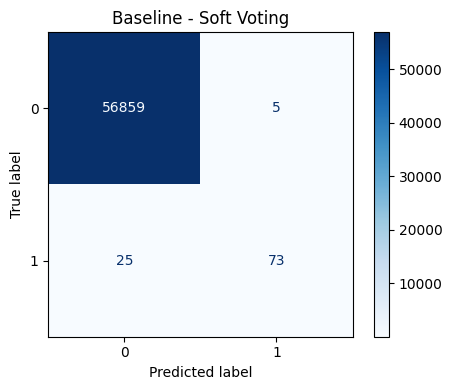

Recall: 0.7448979591836735
Precision: 0.9358974358974359
F1: 0.8295454545454546
Accuracy: 0.9994733330992591


In [11]:
voting = VotingClassifier(
    estimators=[
        ('lr', LogisticRegression(max_iter=1000)),
        ('dt', DecisionTreeClassifier()),
        ('svm', SVC(probability=True))
    ],
    voting='soft'
)

voting.fit(X_train_scaled, y_train)
y_pred_voting = voting.predict(X_test_scaled)

print("=== SOFT VOTING BASELINE ===")
print(classification_report(y_test, y_pred_voting))
cm = confusion_matrix(y_test, y_pred_voting)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("Baseline - Soft Voting")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_voting))
print("Precision:", precision_score(y_test, y_pred_voting))
print("F1:", f1_score(y_test, y_pred_voting))
print("Accuracy:", accuracy_score(y_test, y_pred_voting))

=== STACKING BASELINE ===
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.94      0.78      0.85        98

    accuracy                           1.00     56962
   macro avg       0.97      0.89      0.92     56962
weighted avg       1.00      1.00      1.00     56962



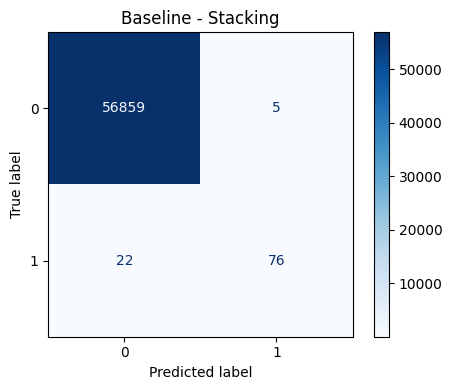

Recall: 0.7755102040816326
Precision: 0.9382716049382716
F1: 0.8491620111731844
Accuracy: 0.9995259997893332


In [12]:
stacking = StackingClassifier(
    estimators=[
        ('rf', RandomForestClassifier(random_state=42)),
        ('xgb', XGBClassifier(use_label_encoder=False, eval_metric='logloss')),
        ('gb', GradientBoostingClassifier(random_state=42))
    ],
    final_estimator=LogisticRegression(max_iter=1000)
)

stacking.fit(X_train_scaled, y_train)
y_pred_stacking = stacking.predict(X_test_scaled)

print("=== STACKING BASELINE ===")
print(classification_report(y_test, y_pred_stacking))
cm = confusion_matrix(y_test, y_pred_stacking)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("Baseline - Stacking")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_stacking))
print("Precision:", precision_score(y_test, y_pred_stacking))
print("F1:", f1_score(y_test, y_pred_stacking))
print("Accuracy:", accuracy_score(y_test, y_pred_stacking))

# Resampling

## Oversampling

### SMOTE

In [14]:
smote = SMOTE(
    sampling_strategy=0.3,
    k_neighbors=3,
    random_state=42)

X_train_smote, y_train_smote = smote.fit_resample(X_train_scaled, y_train)

print("Before:", y_train.value_counts())
print("After SMOTE:", pd.Series(y_train_smote).value_counts())

Before: Class
0    227451
1       394
Name: count, dtype: int64
After SMOTE: Class
0    227451
1     68235
Name: count, dtype: int64


=== RF + SMOTE ===
[[56853    11]
 [   15    83]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.88      0.85      0.86        98

    accuracy                           1.00     56962
   macro avg       0.94      0.92      0.93     56962
weighted avg       1.00      1.00      1.00     56962



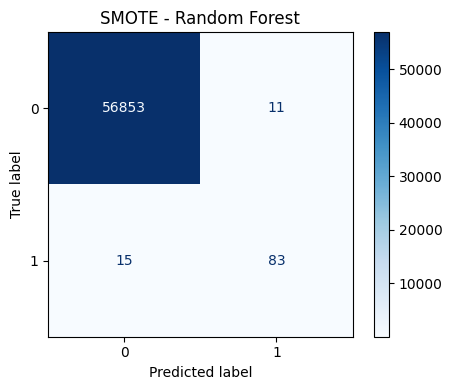

Recall: 0.8469387755102041
Precision: 0.8829787234042553
F1: 0.8645833333333334
Accuracy: 0.9995435553526912


In [15]:
from sklearn.metrics import ConfusionMatrixDisplay

rf_smote = RandomForestClassifier(random_state=42)

rf_smote.fit(X_train_smote, y_train_smote)
y_pred_rf_smote = rf_smote.predict(X_test_scaled)

print("=== RF + SMOTE ===")
print(confusion_matrix(y_test, y_pred_rf_smote))
print(classification_report(y_test, y_pred_rf_smote))
cm = confusion_matrix(y_test, y_pred_rf_smote)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("SMOTE - Random Forest")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_rf_smote))
print("Precision:", precision_score(y_test, y_pred_rf_smote))
print("F1:", f1_score(y_test, y_pred_rf_smote))
print("Accuracy:", accuracy_score(y_test, y_pred_rf_smote))

=== XGB + SMOTE ===
[[56841    23]
 [   13    85]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.79      0.87      0.83        98

    accuracy                           1.00     56962
   macro avg       0.89      0.93      0.91     56962
weighted avg       1.00      1.00      1.00     56962



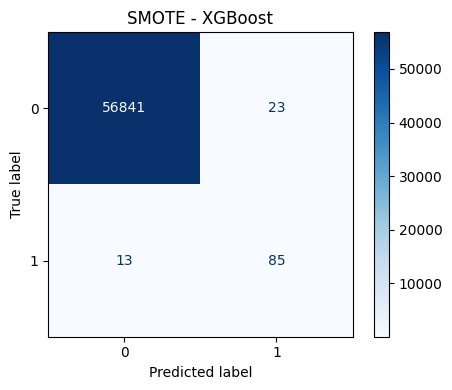

Recall: 0.8673469387755102
Precision: 0.7870370370370371
F1: 0.8252427184466019
Accuracy: 0.9993679997191109


In [18]:
xgb_smote = XGBClassifier(use_label_encoder=False, eval_metric='logloss')

xgb_smote.fit(X_train_smote, y_train_smote)
y_pred_xgb_smote = xgb_smote.predict(X_test_scaled)

print("=== XGB + SMOTE ===")
print(confusion_matrix(y_test, y_pred_xgb_smote))
print(classification_report(y_test, y_pred_xgb_smote))
cm = confusion_matrix(y_test, y_pred_xgb_smote)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("SMOTE - XGBoost")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_xgb_smote))
print("Precision:", precision_score(y_test, y_pred_xgb_smote))
print("F1:", f1_score(y_test, y_pred_xgb_smote))
print("Accuracy:", accuracy_score(y_test, y_pred_xgb_smote))

=== GB + SMOTE ===
[[56646   218]
 [   11    87]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.29      0.89      0.43        98

    accuracy                           1.00     56962
   macro avg       0.64      0.94      0.71     56962
weighted avg       1.00      1.00      1.00     56962



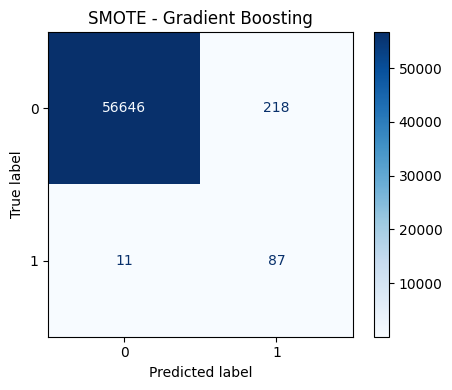

Recall: 0.8877551020408163
Precision: 0.28524590163934427
F1: 0.4317617866004963
Accuracy: 0.9959797759910115


In [19]:
gb_smote = GradientBoostingClassifier(random_state=42)

gb_smote.fit(X_train_smote, y_train_smote)
y_pred_gb_smote = gb_smote.predict(X_test_scaled)

print("=== GB + SMOTE ===")
print(confusion_matrix(y_test, y_pred_gb_smote))
print(classification_report(y_test, y_pred_gb_smote))
cm = confusion_matrix(y_test, y_pred_gb_smote)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("SMOTE - Gradient Boosting")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_gb_smote))
print("Precision:", precision_score(y_test, y_pred_gb_smote))
print("F1:", f1_score(y_test, y_pred_gb_smote))
print("Accuracy:", accuracy_score(y_test, y_pred_gb_smote))

=== Voting + SMOTE ===
[[56762   102]
 [   12    86]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.46      0.88      0.60        98

    accuracy                           1.00     56962
   macro avg       0.73      0.94      0.80     56962
weighted avg       1.00      1.00      1.00     56962



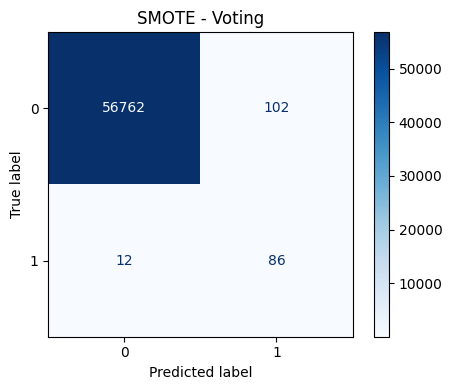

Recall: 0.8775510204081632
Precision: 0.4574468085106383
F1: 0.6013986013986014
Accuracy: 0.9979986657771848


In [2]:
voting_smote = VotingClassifier(
    estimators=[
        ('lr', LogisticRegression(max_iter=1000)),
        ('dt', DecisionTreeClassifier()),
        ('svm', SVC(probability=True))
    ],
    voting='soft'
)

voting_smote.fit(X_train_smote, y_train_smote)
y_pred_voting_smote = voting_smote.predict(X_test_scaled)

print("=== Voting + SMOTE ===")
print(confusion_matrix(y_test, y_pred_voting_smote))
print(classification_report(y_test, y_pred_voting_smote))
cm = confusion_matrix(y_test, y_pred_voting_smote)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("SMOTE - Voting")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_voting_smote))
print("Precision:", precision_score(y_test, y_pred_voting_smote))
print("F1:", f1_score(y_test, y_pred_voting_smote))
print("Accuracy:", accuracy_score(y_test, y_pred_voting_smote))

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [19:48:46] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [20:26:29] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [20:26:32] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [20:26:34] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:

=== Stacking + SMOTE ===
[[56851    13]
 [   14    84]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.87      0.86      0.86        98

    accuracy                           1.00     56962
   macro avg       0.93      0.93      0.93     56962
weighted avg       1.00      1.00      1.00     56962



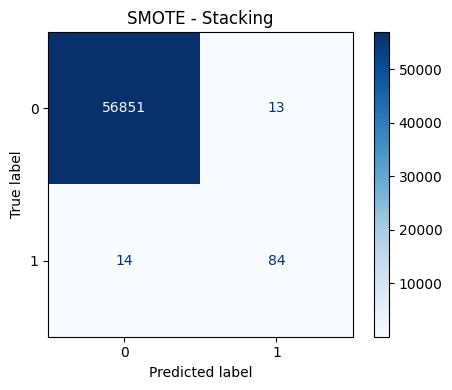

Recall: 0.8571428571428571
Precision: 0.865979381443299
F1: 0.8615384615384616
Accuracy: 0.9995259997893332


In [3]:
stacking_smote = StackingClassifier(
    estimators=[
        ('rf', RandomForestClassifier(random_state=42)),
        ('xgb', XGBClassifier(use_label_encoder=False, eval_metric='logloss')),
        ('gb', GradientBoostingClassifier(random_state=42))
    ],
    final_estimator=LogisticRegression(max_iter=1000)
)

stacking_smote.fit(X_train_smote, y_train_smote)
y_pred_stacking_smote = stacking_smote.predict(X_test_scaled)

print("=== Stacking + SMOTE ===")
print(confusion_matrix(y_test, y_pred_stacking_smote))
print(classification_report(y_test, y_pred_stacking_smote))
cm = confusion_matrix(y_test, y_pred_stacking_smote)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("SMOTE - Stacking")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_stacking_smote))
print("Precision:", precision_score(y_test, y_pred_stacking_smote))
print("F1:", f1_score(y_test, y_pred_stacking_smote))
print("Accuracy:", accuracy_score(y_test, y_pred_stacking_smote))

### Adasyn

In [20]:
adasyn = ADASYN(
    sampling_strategy=0.3,
    n_neighbors=3,
    random_state=42)

X_train_adasyn, y_train_adasyn = adasyn.fit_resample(X_train_scaled, y_train)

print("Before:", y_train.value_counts())
print("After ADASYN:", pd.Series(y_train_adasyn).value_counts())

Before: Class
0    227451
1       394
Name: count, dtype: int64
After ADASYN: Class
0    227451
1     68283
Name: count, dtype: int64


=== RF + ADASYN ===


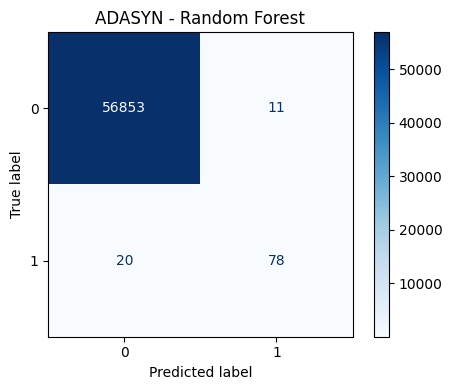

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.88      0.80      0.83        98

    accuracy                           1.00     56962
   macro avg       0.94      0.90      0.92     56962
weighted avg       1.00      1.00      1.00     56962

Recall: 0.7959183673469388
Precision: 0.8764044943820225
F1: 0.8342245989304813
Accuracy: 0.9994557775359011


In [21]:
rf_adasyn = RandomForestClassifier(random_state=42)

rf_adasyn.fit(X_train_adasyn, y_train_adasyn)
y_pred_rf_adasyn = rf_adasyn.predict(X_test_scaled)

print("=== RF + ADASYN ===")
cm = confusion_matrix(y_test, y_pred_rf_adasyn)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("ADASYN - Random Forest")
plt.tight_layout()
plt.show()
print(classification_report(y_test, y_pred_rf_adasyn))

print("Recall:", recall_score(y_test, y_pred_rf_adasyn))
print("Precision:", precision_score(y_test, y_pred_rf_adasyn))
print("F1:", f1_score(y_test, y_pred_rf_adasyn))
print("Accuracy:", accuracy_score(y_test, y_pred_rf_adasyn))

=== XGB + ADASYN ===


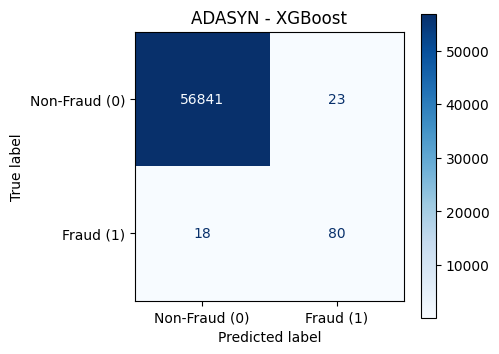

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.78      0.82      0.80        98

    accuracy                           1.00     56962
   macro avg       0.89      0.91      0.90     56962
weighted avg       1.00      1.00      1.00     56962

Recall: 0.8163265306122449
Precision: 0.7766990291262136
F1: 0.7960199004975125
Accuracy: 0.9992802219023208


In [22]:
xgb_adasyn = XGBClassifier(use_label_encoder=False, eval_metric='logloss')

xgb_adasyn.fit(X_train_adasyn, y_train_adasyn)
y_pred_xgb_adasyn = xgb_adasyn.predict(X_test_scaled)

print("=== XGB + ADASYN ===")
cm = confusion_matrix(y_test, y_pred_xgb_adasyn)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Non-Fraud (0)', 'Fraud (1)'])
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("ADASYN - XGBoost")
plt.tight_layout()
plt.show()
print(classification_report(y_test, y_pred_xgb_adasyn))

print("Recall:", recall_score(y_test, y_pred_xgb_adasyn))
print("Precision:", precision_score(y_test, y_pred_xgb_adasyn))
print("F1:", f1_score(y_test, y_pred_xgb_adasyn))
print("Accuracy:", accuracy_score(y_test, y_pred_xgb_adasyn))

=== GB + ADASYN ===
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     56864
           1       0.11      0.90      0.19        98

    accuracy                           0.99     56962
   macro avg       0.55      0.94      0.59     56962
weighted avg       1.00      0.99      0.99     56962



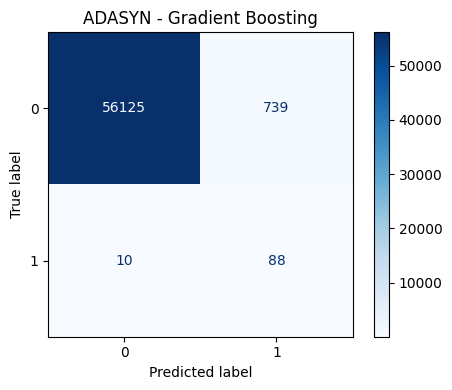

Recall: 0.8979591836734694
Precision: 0.10640870616686819
F1: 0.19027027027027027
Accuracy: 0.9868508830448369


In [24]:
gb_adasyn = GradientBoostingClassifier(random_state=42)

gb_adasyn.fit(X_train_adasyn, y_train_adasyn)
y_pred_gb_adasyn = gb_adasyn.predict(X_test_scaled)

print("=== GB + ADASYN ===")

print(classification_report(y_test, y_pred_gb_adasyn))
cm = confusion_matrix(y_test, y_pred_gb_adasyn)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("ADASYN - Gradient Boosting")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_gb_adasyn))
print("Precision:", precision_score(y_test, y_pred_gb_adasyn))
print("F1:", f1_score(y_test, y_pred_gb_adasyn))
print("Accuracy:", accuracy_score(y_test, y_pred_gb_adasyn))

=== Voting + ADASYN ===
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.53      0.82      0.64        98

    accuracy                           1.00     56962
   macro avg       0.76      0.91      0.82     56962
weighted avg       1.00      1.00      1.00     56962



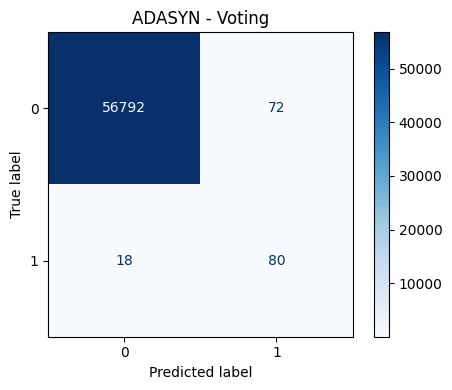

Recall: 0.8163265306122449
Precision: 0.5263157894736842
F1: 0.64
Accuracy: 0.9984199992977775


In [4]:
voting_adasyn = VotingClassifier(
    estimators=[
        ('lr', LogisticRegression(max_iter=1000)),
        ('dt', DecisionTreeClassifier()),
        ('svm', SVC(probability=True))
    ],
    voting='soft'
)

voting_adasyn.fit(X_train_adasyn, y_train_adasyn)
y_pred_voting_adasyn = voting_adasyn.predict(X_test_scaled)

print("=== Voting + ADASYN ===")

print(classification_report(y_test, y_pred_voting_adasyn))
cm = confusion_matrix(y_test, y_pred_voting_adasyn)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("ADASYN - Voting")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_voting_adasyn))
print("Precision:", precision_score(y_test, y_pred_voting_adasyn))
print("F1:", f1_score(y_test, y_pred_voting_adasyn))
print("Accuracy:", accuracy_score(y_test, y_pred_voting_adasyn))

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [22:33:35] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [23:09:46] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [23:09:49] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [23:09:52] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:

=== Stacking + ADASYN ===
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.35      0.90      0.51        98

    accuracy                           1.00     56962
   macro avg       0.68      0.95      0.75     56962
weighted avg       1.00      1.00      1.00     56962



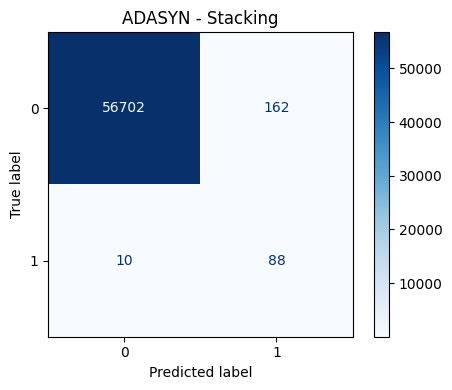

Recall: 0.8979591836734694
Precision: 0.352
F1: 0.5057471264367817
Accuracy: 0.9969804431024192


In [5]:
stacking_adasyn = StackingClassifier(
    estimators=[
        ('rf', RandomForestClassifier(random_state=42)),
        ('xgb', XGBClassifier(use_label_encoder=False, eval_metric='logloss')),
        ('gb', GradientBoostingClassifier(random_state=42))
    ],
    final_estimator=LogisticRegression(max_iter=1000)
)

stacking_adasyn.fit(X_train_adasyn, y_train_adasyn)
y_pred_stacking_adasyn = stacking_adasyn.predict(X_test_scaled)

print("=== Stacking + ADASYN ===")

print(classification_report(y_test, y_pred_stacking_adasyn))
cm = confusion_matrix(y_test, y_pred_stacking_adasyn)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("ADASYN - Stacking")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_stacking_adasyn))
print("Precision:", precision_score(y_test, y_pred_stacking_adasyn))
print("F1:", f1_score(y_test, y_pred_stacking_adasyn))
print("Accuracy:", accuracy_score(y_test, y_pred_stacking_adasyn))

### Random Oversampling

In [26]:
ros = RandomOverSampler(
    sampling_strategy=0.3,
    random_state=42)

X_train_ros, y_train_ros = ros.fit_resample(X_train_scaled, y_train)

print("Before:", y_train.value_counts())
print("After Random Oversampling:", pd.Series(y_train_ros).value_counts())

Before: Class
0    227451
1       394
Name: count, dtype: int64
After Random Oversampling: Class
0    227451
1     68235
Name: count, dtype: int64


=== RF + ROS ===
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.95      0.81      0.87        98

    accuracy                           1.00     56962
   macro avg       0.98      0.90      0.94     56962
weighted avg       1.00      1.00      1.00     56962



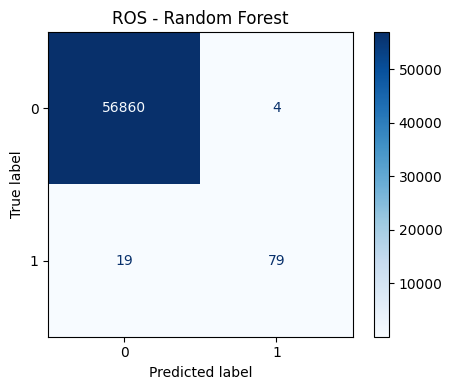

Recall: 0.8061224489795918
Precision: 0.9518072289156626
F1: 0.8729281767955801
Accuracy: 0.9995962220427653


In [27]:
rf_ros = RandomForestClassifier(random_state=42)

rf_ros.fit(X_train_ros, y_train_ros)
y_pred_rf_ros = rf_ros.predict(X_test_scaled)

print("=== RF + ROS ===")
print(classification_report(y_test, y_pred_rf_ros))
cm = confusion_matrix(y_test, y_pred_rf_ros)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("ROS - Random Forest")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_rf_ros))
print("Precision:", precision_score(y_test, y_pred_rf_ros))
print("F1:", f1_score(y_test, y_pred_rf_ros))
print("Accuracy:", accuracy_score(y_test, y_pred_rf_ros))

=== XGB + ROS ===


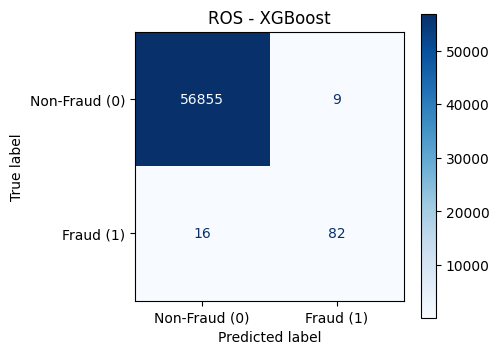

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.90      0.84      0.87        98

    accuracy                           1.00     56962
   macro avg       0.95      0.92      0.93     56962
weighted avg       1.00      1.00      1.00     56962

Recall: 0.8367346938775511
Precision: 0.9010989010989011
F1: 0.8677248677248677
Accuracy: 0.9995611109160493


In [28]:
xgb_ros = XGBClassifier(use_label_encoder=False, eval_metric='logloss')

xgb_ros.fit(X_train_ros, y_train_ros)
y_pred_xgb_ros = xgb_ros.predict(X_test_scaled)

print("=== XGB + ROS ===")
cm = confusion_matrix(y_test, y_pred_xgb_ros)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Non-Fraud (0)', 'Fraud (1)'])
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("ROS - XGBoost")
plt.tight_layout()
plt.show()
print(classification_report(y_test, y_pred_xgb_ros))

print("Recall:", recall_score(y_test, y_pred_xgb_ros))
print("Precision:", precision_score(y_test, y_pred_xgb_ros))
print("F1:", f1_score(y_test, y_pred_xgb_ros))
print("Accuracy:", accuracy_score(y_test, y_pred_xgb_ros))

=== GB + ROS ===
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.36      0.89      0.51        98

    accuracy                           1.00     56962
   macro avg       0.68      0.94      0.75     56962
weighted avg       1.00      1.00      1.00     56962



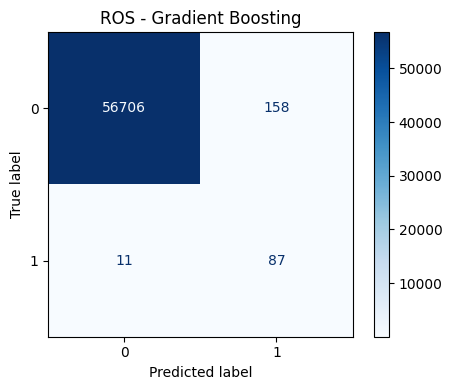

Recall: 0.8877551020408163
Precision: 0.3551020408163265
F1: 0.5072886297376094
Accuracy: 0.9970331097924933


In [29]:
gb_ros = GradientBoostingClassifier(random_state=42)

gb_ros.fit(X_train_ros, y_train_ros)
y_pred_gb_ros = gb_ros.predict(X_test_scaled)

print("=== GB + ROS ===")

print(classification_report(y_test, y_pred_gb_ros))
cm = confusion_matrix(y_test, y_pred_gb_ros)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("ROS - Gradient Boosting")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_gb_ros))
print("Precision:", precision_score(y_test, y_pred_gb_ros))
print("F1:", f1_score(y_test, y_pred_gb_ros))
print("Accuracy:", accuracy_score(y_test, y_pred_gb_ros))

=== Voting + ROS ===
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.49      0.87      0.62        98

    accuracy                           1.00     56962
   macro avg       0.74      0.93      0.81     56962
weighted avg       1.00      1.00      1.00     56962



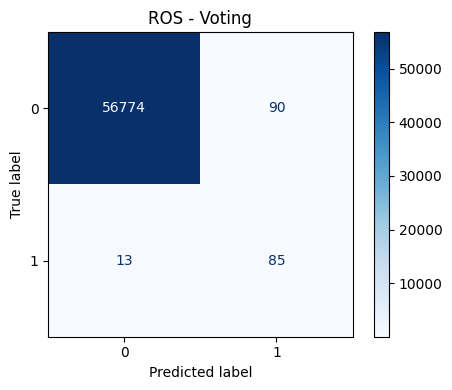

Recall: 0.8673469387755102
Precision: 0.4857142857142857
F1: 0.6227106227106227
Accuracy: 0.9981917769741231


In [6]:
voting_ros = VotingClassifier(
    estimators=[
        ('lr', LogisticRegression(max_iter=1000)),
        ('dt', DecisionTreeClassifier()),
        ('svm', SVC(probability=True))
    ],
    voting='soft'
)

voting_ros.fit(X_train_ros, y_train_ros)
y_pred_voting_ros = voting_ros.predict(X_test_scaled)

print("=== Voting + ROS ===")

print(classification_report(y_test, y_pred_voting_ros))
cm = confusion_matrix(y_test, y_pred_voting_ros)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("ROS - Voting")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_voting_ros))
print("Precision:", precision_score(y_test, y_pred_voting_ros))
print("F1:", f1_score(y_test, y_pred_voting_ros))
print("Accuracy:", accuracy_score(y_test, y_pred_voting_ros))

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [03:14:05] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [03:44:32] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [03:44:35] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [03:44:37] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:

=== Stacking + ROS ===
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.89      0.83      0.86        98

    accuracy                           1.00     56962
   macro avg       0.94      0.91      0.93     56962
weighted avg       1.00      1.00      1.00     56962



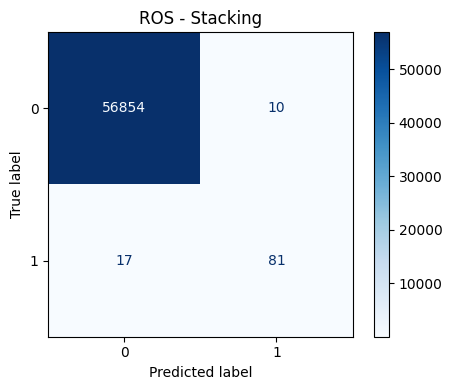

Recall: 0.826530612244898
Precision: 0.8901098901098901
F1: 0.8571428571428571
Accuracy: 0.9995259997893332


In [7]:
stacking_ros = StackingClassifier(
    estimators=[
        ('rf', RandomForestClassifier(random_state=42)),
        ('xgb', XGBClassifier(use_label_encoder=False, eval_metric='logloss')),
        ('gb', GradientBoostingClassifier(random_state=42))
    ],
    final_estimator=LogisticRegression(max_iter=1000)
)

stacking_ros.fit(X_train_ros, y_train_ros)
y_pred_stacking_ros = stacking_ros.predict(X_test_scaled)

print("=== Stacking + ROS ===")

print(classification_report(y_test, y_pred_stacking_ros))
cm = confusion_matrix(y_test, y_pred_stacking_ros)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("ROS - Stacking")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_stacking_ros))
print("Precision:", precision_score(y_test, y_pred_stacking_ros))
print("F1:", f1_score(y_test, y_pred_stacking_ros))
print("Accuracy:", accuracy_score(y_test, y_pred_stacking_ros))

## Undersampling

### Random Undersampling

In [30]:
rus = RandomUnderSampler(
    sampling_strategy=0.3,
    random_state=42)

X_train_rus, y_train_rus = rus.fit_resample(X_train_scaled, y_train)

print("Before:", y_train.value_counts())
print("After RUS:", pd.Series(y_train_rus).value_counts())

Before: Class
0    227451
1       394
Name: count, dtype: int64
After RUS: Class
0    1313
1     394
Name: count, dtype: int64


=== RF + RUS ===
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     56864
           1       0.15      0.89      0.26        98

    accuracy                           0.99     56962
   macro avg       0.57      0.94      0.63     56962
weighted avg       1.00      0.99      0.99     56962



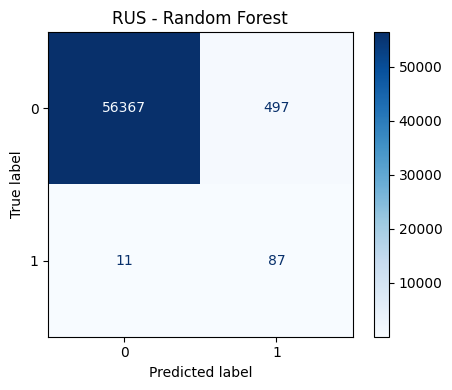

Recall: 0.8877551020408163
Precision: 0.14897260273972604
F1: 0.25513196480938416
Accuracy: 0.9910817738141217


In [31]:
rf_rus = RandomForestClassifier(random_state=42)

rf_rus.fit(X_train_rus, y_train_rus)
y_pred_rf_rus = rf_rus.predict(X_test_scaled)

print("=== RF + RUS ===")
print(classification_report(y_test, y_pred_rf_rus))
cm = confusion_matrix(y_test, y_pred_rf_rus)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("RUS - Random Forest")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_rf_rus))
print("Precision:", precision_score(y_test, y_pred_rf_rus))
print("F1:", f1_score(y_test, y_pred_rf_rus))
print("Accuracy:", accuracy_score(y_test, y_pred_rf_rus))

=== XGB + RUS ===


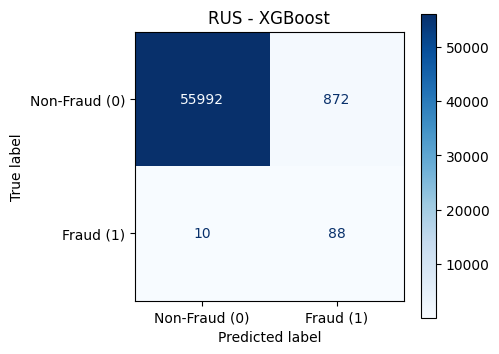

              precision    recall  f1-score   support

           0       1.00      0.98      0.99     56864
           1       0.09      0.90      0.17        98

    accuracy                           0.98     56962
   macro avg       0.55      0.94      0.58     56962
weighted avg       1.00      0.98      0.99     56962

Recall: 0.8979591836734694
Precision: 0.09166666666666666
F1: 0.166351606805293
Accuracy: 0.9845159931182191


In [32]:
xgb_rus = XGBClassifier(use_label_encoder=False, eval_metric='logloss')

xgb_rus.fit(X_train_rus, y_train_rus)
y_pred_xgb_rus = xgb_rus.predict(X_test_scaled)

print("=== XGB + RUS ===")
cm = confusion_matrix(y_test, y_pred_xgb_rus)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Non-Fraud (0)', 'Fraud (1)'])
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("RUS - XGBoost")
plt.tight_layout()
plt.show()
print(classification_report(y_test, y_pred_xgb_rus))

print("Recall:", recall_score(y_test, y_pred_xgb_rus))
print("Precision:", precision_score(y_test, y_pred_xgb_rus))
print("F1:", f1_score(y_test, y_pred_xgb_rus))
print("Accuracy:", accuracy_score(y_test, y_pred_xgb_rus))

=== GB + RUS ===
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     56864
           1       0.06      0.89      0.11        98

    accuracy                           0.98     56962
   macro avg       0.53      0.93      0.55     56962
weighted avg       1.00      0.98      0.99     56962



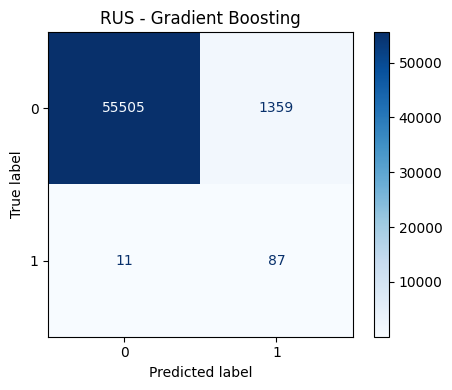

Recall: 0.8877551020408163
Precision: 0.06016597510373444
F1: 0.11269430051813471
Accuracy: 0.9759488781995014


In [33]:
gb_rus = GradientBoostingClassifier(random_state=42)

gb_rus.fit(X_train_rus, y_train_rus)
y_pred_gb_rus = gb_rus.predict(X_test_scaled)

print("=== GB + RUS ===")

print(classification_report(y_test, y_pred_gb_rus))
cm = confusion_matrix(y_test, y_pred_gb_rus)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("RUS - Gradient Boosting")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_gb_rus))
print("Precision:", precision_score(y_test, y_pred_gb_rus))
print("F1:", f1_score(y_test, y_pred_gb_rus))
print("Accuracy:", accuracy_score(y_test, y_pred_gb_rus))

=== Voting + RUS ===
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     56864
           1       0.11      0.92      0.20        98

    accuracy                           0.99     56962
   macro avg       0.56      0.95      0.60     56962
weighted avg       1.00      0.99      0.99     56962



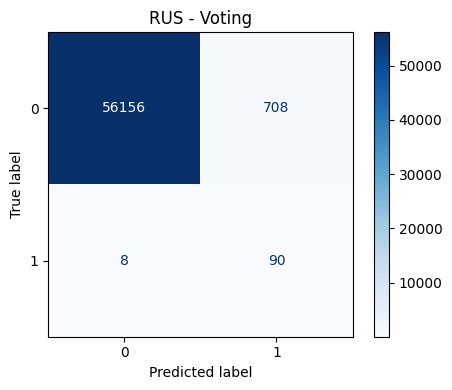

Recall: 0.9183673469387755
Precision: 0.11278195488721804
F1: 0.20089285714285715
Accuracy: 0.9874302166356519


In [9]:
voting_rus = VotingClassifier(
    estimators=[
        ('lr', LogisticRegression(max_iter=1000)),
        ('dt', DecisionTreeClassifier()),
        ('svm', SVC(probability=True))
    ],
    voting='soft'
)

voting_rus.fit(X_train_rus, y_train_rus)
y_pred_voting_rus = voting_rus.predict(X_test_scaled)

print("=== Voting + RUS ===")

print(classification_report(y_test, y_pred_voting_rus))
cm = confusion_matrix(y_test, y_pred_voting_rus)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("RUS - Voting")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_voting_rus))
print("Precision:", precision_score(y_test, y_pred_voting_rus))
print("F1:", f1_score(y_test, y_pred_voting_rus))
print("Accuracy:", accuracy_score(y_test, y_pred_voting_rus))

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [04:29:52] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [04:29:59] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [04:30:00] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


=== Stacking + RUS ===
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     56864
           1       0.10      0.90      0.18        98

    accuracy                           0.99     56962
   macro avg       0.55      0.94      0.59     56962
weighted avg       1.00      0.99      0.99     56962



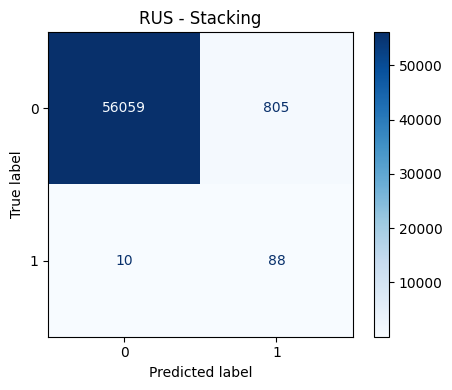

Recall: 0.8979591836734694
Precision: 0.09854423292273236
F1: 0.17759838546922302
Accuracy: 0.9856922158632071


In [8]:
stacking_rus = StackingClassifier(
    estimators=[
        ('rf', RandomForestClassifier(random_state=42)),
        ('xgb', XGBClassifier(use_label_encoder=False, eval_metric='logloss')),
        ('gb', GradientBoostingClassifier(random_state=42))
    ],
    final_estimator=LogisticRegression(max_iter=1000)
)

stacking_rus.fit(X_train_rus, y_train_rus)
y_pred_stacking_rus = stacking_rus.predict(X_test_scaled)

print("=== Stacking + RUS ===")

print(classification_report(y_test, y_pred_stacking_rus))
cm = confusion_matrix(y_test, y_pred_stacking_rus)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("RUS - Stacking")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_stacking_rus))
print("Precision:", precision_score(y_test, y_pred_stacking_rus))
print("F1:", f1_score(y_test, y_pred_stacking_rus))
print("Accuracy:", accuracy_score(y_test, y_pred_stacking_rus))

### Tomek Links

In [34]:
tomek = TomekLinks(
    sampling_strategy='auto',
    n_jobs=-1
)

X_train_tomek, y_train_tomek = tomek.fit_resample(X_train_scaled, y_train)

print("Before:", y_train.value_counts())
print("After Tomek Links:", pd.Series(y_train_tomek).value_counts())

Before: Class
0    227451
1       394
Name: count, dtype: int64
After Tomek Links: Class
0    227434
1       394
Name: count, dtype: int64


=== RF + Tomek Links ===
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.94      0.82      0.87        98

    accuracy                           1.00     56962
   macro avg       0.97      0.91      0.94     56962
weighted avg       1.00      1.00      1.00     56962



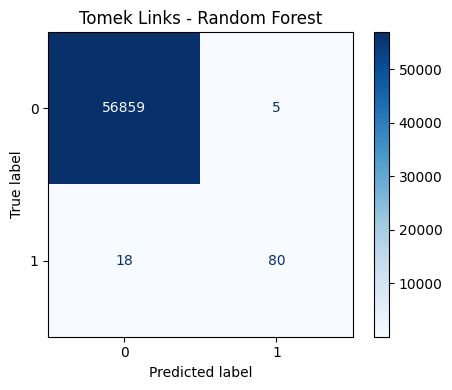

Recall: 0.8163265306122449
Precision: 0.9411764705882353
F1: 0.8743169398907104
Accuracy: 0.9995962220427653


In [35]:
rf_tomek = RandomForestClassifier(random_state=42)

rf_tomek.fit(X_train_tomek, y_train_tomek)
y_pred_rf_tomek = rf_tomek.predict(X_test_scaled)

print("=== RF + Tomek Links ===")
print(classification_report(y_test, y_pred_rf_tomek))
cm = confusion_matrix(y_test, y_pred_rf_tomek)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("Tomek Links - Random Forest")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_rf_tomek))
print("Precision:", precision_score(y_test, y_pred_rf_tomek))
print("F1:", f1_score(y_test, y_pred_rf_tomek))
print("Accuracy:", accuracy_score(y_test, y_pred_rf_tomek))

=== XGB + Tomek Links ===


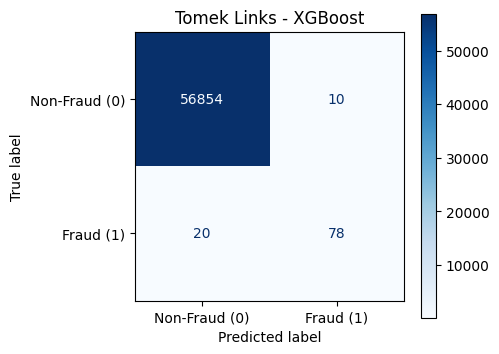

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.89      0.80      0.84        98

    accuracy                           1.00     56962
   macro avg       0.94      0.90      0.92     56962
weighted avg       1.00      1.00      1.00     56962

Recall: 0.7959183673469388
Precision: 0.8863636363636364
F1: 0.8387096774193549
Accuracy: 0.9994733330992591


In [36]:
xgb_tomek = XGBClassifier(use_label_encoder=False, eval_metric='logloss')

xgb_tomek.fit(X_train_tomek, y_train_tomek)
y_pred_xgb_tomek = xgb_tomek.predict(X_test_scaled)

print("=== XGB + Tomek Links ===")
cm = confusion_matrix(y_test, y_pred_xgb_tomek)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Non-Fraud (0)', 'Fraud (1)'])
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("Tomek Links - XGBoost")
plt.tight_layout()
plt.show()
print(classification_report(y_test, y_pred_xgb_tomek))

print("Recall:", recall_score(y_test, y_pred_xgb_tomek))
print("Precision:", precision_score(y_test, y_pred_xgb_tomek))
print("F1:", f1_score(y_test, y_pred_xgb_tomek))
print("Accuracy:", accuracy_score(y_test, y_pred_xgb_tomek))

=== GB + Tomek Links ===
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.62      0.16      0.26        98

    accuracy                           1.00     56962
   macro avg       0.81      0.58      0.63     56962
weighted avg       1.00      1.00      1.00     56962



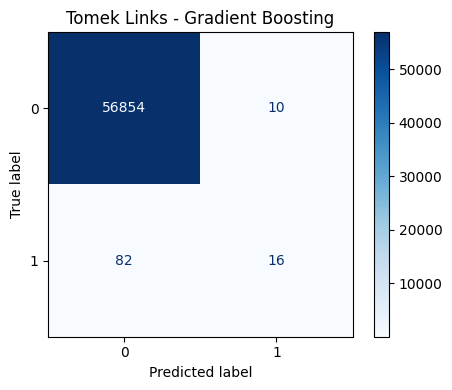

Recall: 0.16326530612244897
Precision: 0.6153846153846154
F1: 0.25806451612903225
Accuracy: 0.9983848881710614


In [37]:
gb_tomek = GradientBoostingClassifier(random_state=42)

gb_tomek.fit(X_train_tomek, y_train_tomek)
y_pred_gb_tomek = gb_tomek.predict(X_test_scaled)

print("=== GB + Tomek Links ===")

print(classification_report(y_test, y_pred_gb_tomek))
cm = confusion_matrix(y_test, y_pred_gb_tomek)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("Tomek Links - Gradient Boosting")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_gb_tomek))
print("Precision:", precision_score(y_test, y_pred_gb_tomek))
print("F1:", f1_score(y_test, y_pred_gb_tomek))
print("Accuracy:", accuracy_score(y_test, y_pred_gb_tomek))

=== Voting + Tomek Links ===
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.93      0.77      0.84        98

    accuracy                           1.00     56962
   macro avg       0.96      0.88      0.92     56962
weighted avg       1.00      1.00      1.00     56962



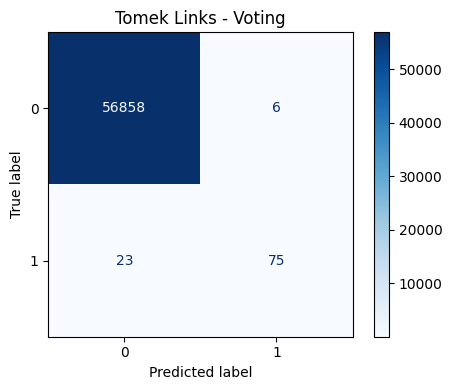

Recall: 0.7653061224489796
Precision: 0.9259259259259259
F1: 0.8379888268156425
Accuracy: 0.9994908886626171


In [10]:
voting_tomek = VotingClassifier(
    estimators=[
        ('lr', LogisticRegression(max_iter=1000)),
        ('dt', DecisionTreeClassifier()),
        ('svm', SVC(probability=True))
    ],
    voting='soft'
)

voting_tomek.fit(X_train_tomek, y_train_tomek)
y_pred_voting_tomek = voting_tomek.predict(X_test_scaled)

print("=== Voting + Tomek Links ===")

print(classification_report(y_test, y_pred_voting_tomek))
cm = confusion_matrix(y_test, y_pred_voting_tomek)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("Tomek Links - Voting")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_voting_tomek))
print("Precision:", precision_score(y_test, y_pred_voting_tomek))
print("F1:", f1_score(y_test, y_pred_voting_tomek))
print("Accuracy:", accuracy_score(y_test, y_pred_voting_tomek))

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [01:21:24] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [01:52:13] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [01:52:15] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [01:52:17] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:

=== Stacking + Tomek Links ===
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.92      0.81      0.86        98

    accuracy                           1.00     56962
   macro avg       0.96      0.90      0.93     56962
weighted avg       1.00      1.00      1.00     56962



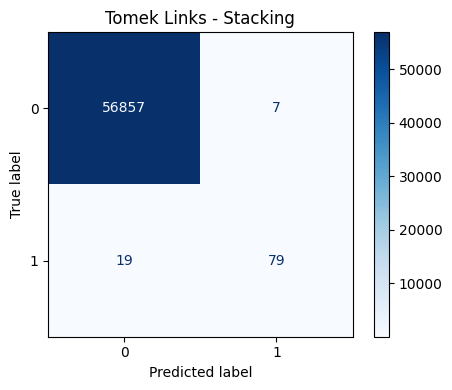

Recall: 0.8061224489795918
Precision: 0.9186046511627907
F1: 0.8586956521739131
Accuracy: 0.9995435553526912


In [8]:
stacking_tomek = StackingClassifier(
    estimators=[
        ('rf', RandomForestClassifier(random_state=42)),
        ('xgb', XGBClassifier(use_label_encoder=False, eval_metric='logloss')),
        ('gb', GradientBoostingClassifier(random_state=42))
    ],
    final_estimator=LogisticRegression(max_iter=1000)
)

stacking_tomek.fit(X_train_tomek, y_train_tomek)
y_pred_stacking_tomek = stacking_tomek.predict(X_test_scaled)

print("=== Stacking + Tomek Links ===")

print(classification_report(y_test, y_pred_stacking_tomek))
cm = confusion_matrix(y_test, y_pred_stacking_tomek)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("Tomek Links - Stacking")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_stacking_tomek))
print("Precision:", precision_score(y_test, y_pred_stacking_tomek))
print("F1:", f1_score(y_test, y_pred_stacking_tomek))
print("Accuracy:", accuracy_score(y_test, y_pred_stacking_tomek))

### ENN

In [39]:
enn = EditedNearestNeighbours(
    n_neighbors=3,
    kind_sel='mode',
    n_jobs=-1
)

X_train_enn, y_train_enn = enn.fit_resample(X_train_scaled, y_train)

print("Before:", y_train.value_counts())
print("After ENN:", pd.Series(y_train_enn).value_counts())

Before: Class
0    227451
1       394
Name: count, dtype: int64
After ENN: Class
0    227430
1       394
Name: count, dtype: int64


=== RF + ENN ===
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.91      0.83      0.87        98

    accuracy                           1.00     56962
   macro avg       0.95      0.91      0.93     56962
weighted avg       1.00      1.00      1.00     56962



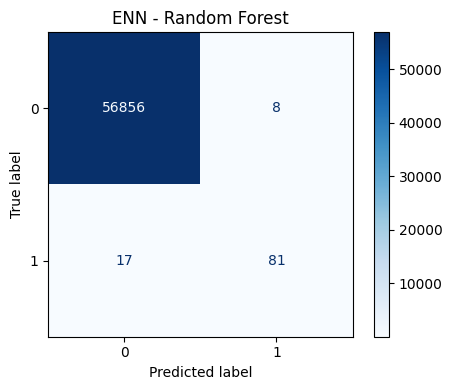

Recall: 0.826530612244898
Precision: 0.9101123595505618
F1: 0.8663101604278075
Accuracy: 0.9995611109160493


In [41]:
rf_enn = RandomForestClassifier(random_state=42)

rf_enn.fit(X_train_enn, y_train_enn)
y_pred_rf_enn = rf_enn.predict(X_test_scaled)

print("=== RF + ENN ===")
print(classification_report(y_test, y_pred_rf_enn))
cm = confusion_matrix(y_test, y_pred_rf_enn)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("ENN - Random Forest")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_rf_enn))
print("Precision:", precision_score(y_test, y_pred_rf_enn))
print("F1:", f1_score(y_test, y_pred_rf_enn))
print("Accuracy:", accuracy_score(y_test, y_pred_rf_enn))

=== XGB + ENN ===


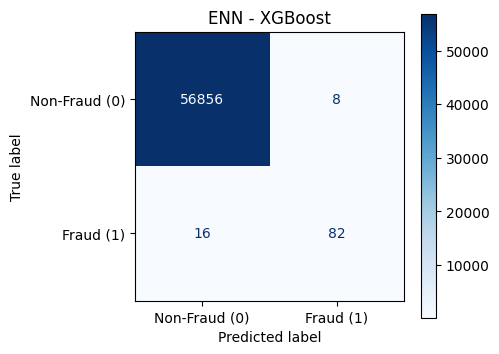

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.91      0.84      0.87        98

    accuracy                           1.00     56962
   macro avg       0.96      0.92      0.94     56962
weighted avg       1.00      1.00      1.00     56962

Recall: 0.8367346938775511
Precision: 0.9111111111111111
F1: 0.8723404255319149
Accuracy: 0.9995786664794073


In [42]:
xgb_enn = XGBClassifier(use_label_encoder=False, eval_metric='logloss')

xgb_enn.fit(X_train_enn, y_train_enn)
y_pred_xgb_enn = xgb_enn.predict(X_test_scaled)

print("=== XGB + ENN ===")
cm = confusion_matrix(y_test, y_pred_xgb_enn)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Non-Fraud (0)', 'Fraud (1)'])
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("ENN - XGBoost")
plt.tight_layout()
plt.show()
print(classification_report(y_test, y_pred_xgb_enn))

print("Recall:", recall_score(y_test, y_pred_xgb_enn))
print("Precision:", precision_score(y_test, y_pred_xgb_enn))
print("F1:", f1_score(y_test, y_pred_xgb_enn))
print("Accuracy:", accuracy_score(y_test, y_pred_xgb_enn))

=== GB + ENN ===
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.84      0.62      0.71        98

    accuracy                           1.00     56962
   macro avg       0.92      0.81      0.86     56962
weighted avg       1.00      1.00      1.00     56962



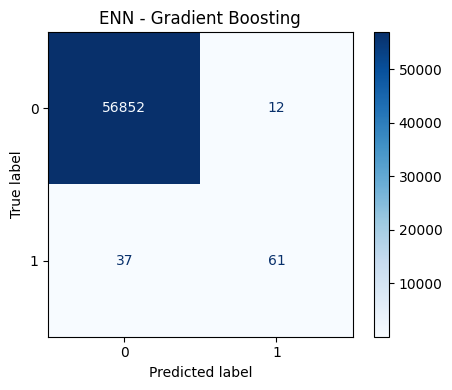

Recall: 0.6224489795918368
Precision: 0.8356164383561644
F1: 0.7134502923976608
Accuracy: 0.9991397773954567


In [ ]:
gb_enn = GradientBoostingClassifier(random_state=42)

gb_enn.fit(X_train_enn, y_train_enn)
y_pred_gb_enn = gb_enn.predict(X_test_scaled)

print("=== GB + ENN ===")

print(classification_report(y_test, y_pred_gb_enn))
cm = confusion_matrix(y_test, y_pred_gb_enn)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("ENN - Gradient Boosting")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_gb_enn))
print("Precision:", precision_score(y_test, y_pred_gb_enn))
print("F1:", f1_score(y_test, y_pred_gb_enn))
print("Accuracy:", accuracy_score(y_test, y_pred_gb_enn))

=== Voting + ENN ===
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.90      0.79      0.84        98

    accuracy                           1.00     56962
   macro avg       0.95      0.89      0.92     56962
weighted avg       1.00      1.00      1.00     56962



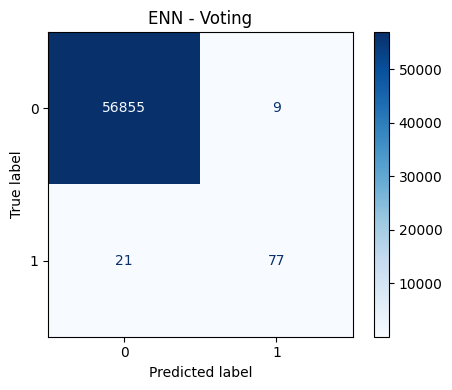

Recall: 0.7857142857142857
Precision: 0.8953488372093024
F1: 0.8369565217391305
Accuracy: 0.9994733330992591


In [3]:
voting_enn = VotingClassifier(
    estimators=[
        ('lr', LogisticRegression(max_iter=1000)),
        ('dt', DecisionTreeClassifier()),
        ('svm', SVC(probability=True))
    ],
    voting='soft'
)

voting_enn.fit(X_train_enn, y_train_enn)
y_pred_voting_enn = voting_enn.predict(X_test_scaled)

print("=== Voting + ENN ===")

print(classification_report(y_test, y_pred_voting_enn))
cm = confusion_matrix(y_test, y_pred_voting_enn)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("ENN - Voting")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_voting_enn))
print("Precision:", precision_score(y_test, y_pred_voting_enn))
print("F1:", f1_score(y_test, y_pred_voting_enn))
print("Accuracy:", accuracy_score(y_test, y_pred_voting_enn))

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [21:43:27] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [22:13:38] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [22:13:40] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [22:13:42] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:

=== Stacking + ENN ===
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.94      0.81      0.87        98

    accuracy                           1.00     56962
   macro avg       0.97      0.90      0.93     56962
weighted avg       1.00      1.00      1.00     56962



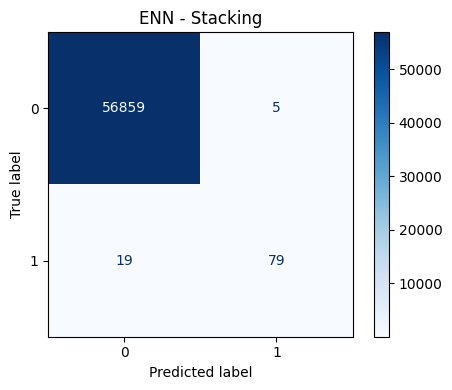

Recall: 0.8061224489795918
Precision: 0.9404761904761905
F1: 0.8681318681318682
Accuracy: 0.9995786664794073


In [6]:
stacking_enn = StackingClassifier(
    estimators=[
        ('rf', RandomForestClassifier(random_state=42)),
        ('xgb', XGBClassifier(use_label_encoder=False, eval_metric='logloss')),
        ('gb', GradientBoostingClassifier(random_state=42))
    ],
    final_estimator=LogisticRegression(max_iter=1000)
)

stacking_enn.fit(X_train_enn, y_train_enn)
y_pred_stacking_enn = stacking_enn.predict(X_test_scaled)

print("=== Stacking + ENN ===")

print(classification_report(y_test, y_pred_stacking_enn))
cm = confusion_matrix(y_test, y_pred_stacking_enn)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("ENN - Stacking")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_stacking_enn))
print("Precision:", precision_score(y_test, y_pred_stacking_enn))
print("F1:", f1_score(y_test, y_pred_stacking_enn))
print("Accuracy:", accuracy_score(y_test, y_pred_stacking_enn))

## Hybrid Sampling

### SMOTE-ENN

In [ ]:
smote_enn = SMOTEENN(
    sampling_strategy=0.3,
    smote=SMOTE(
        k_neighbors=3,
        random_state=42
    ),
    enn=EditedNearestNeighbours(
        n_neighbors=3,
        kind_sel='mode'
    ),
    random_state=42
)

X_train_smoteenn, y_train_smoteenn = smote_enn.fit_resample(X_train_scaled, y_train)

print("Before:", y_train.value_counts())
print("After SMOTEENN:", pd.Series(y_train_smoteenn).value_counts())

Before: Class
0    227451
1       394
Name: count, dtype: int64
After SMOTEENN: Class
0    227451
1    227451
Name: count, dtype: int64


=== RF + SMOTE-ENN ===
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.90      0.82      0.86        98

    accuracy                           1.00     56962
   macro avg       0.95      0.91      0.93     56962
weighted avg       1.00      1.00      1.00     56962



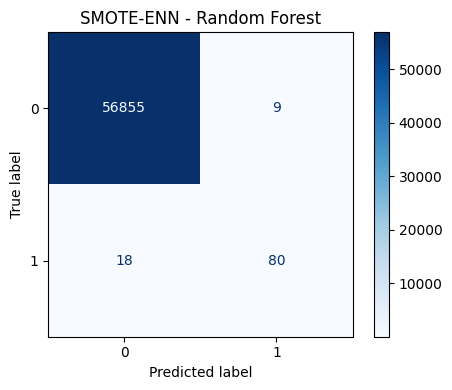

Recall: 0.8163265306122449
Precision: 0.898876404494382
F1: 0.8556149732620321
Accuracy: 0.9995259997893332


In [ ]:
rf_smoteenn = RandomForestClassifier(random_state=42)

rf_smoteenn.fit(X_train_smoteenn, y_train_smoteenn)
y_pred_rf_smoteenn = rf_smoteenn.predict(X_test_scaled)

print("=== RF + SMOTE-ENN ===")
print(classification_report(y_test, y_pred_rf_smoteenn))
cm = confusion_matrix(y_test, y_pred_rf_smoteenn)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("SMOTE-ENN - Random Forest")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_rf_smoteenn))
print("Precision:", precision_score(y_test, y_pred_rf_smoteenn))
print("F1:", f1_score(y_test, y_pred_rf_smoteenn))
print("Accuracy:", accuracy_score(y_test, y_pred_rf_smoteenn))


=== XGB + SMOTE-ENN ===
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.74      0.85      0.79        98

    accuracy                           1.00     56962
   macro avg       0.87      0.92      0.90     56962
weighted avg       1.00      1.00      1.00     56962



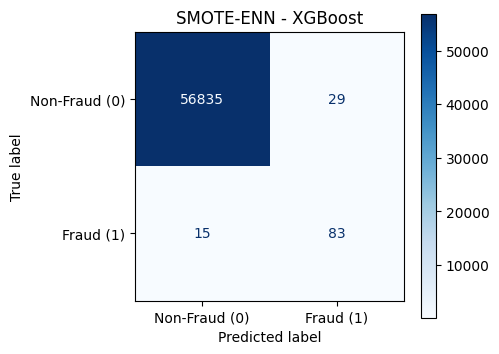

Recall: 0.8469387755102041
Precision: 0.7410714285714286
F1: 0.7904761904761904
Accuracy: 0.9992275552122467


In [ ]:
xgb_smoteenn = XGBClassifier(use_label_encoder=False, eval_metric='logloss')

xgb_smoteenn.fit(X_train_smoteenn, y_train_smoteenn)
y_pred_xgb_smoteenn = xgb_smoteenn.predict(X_test_scaled)

print("=== XGB + SMOTE-ENN ===")

print(classification_report(y_test, y_pred_xgb_smoteenn))
cm = confusion_matrix(y_test, y_pred_xgb_smoteenn)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Non-Fraud (0)', 'Fraud (1)'])
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("SMOTE-ENN - XGBoost")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_xgb_smoteenn))
print("Precision:", precision_score(y_test, y_pred_xgb_smoteenn))
print("F1:", f1_score(y_test, y_pred_xgb_smoteenn))
print("Accuracy:", accuracy_score(y_test, y_pred_xgb_smoteenn))

=== GB + SMOTE-ENN ===
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     56864
           1       0.12      0.91      0.21        98

    accuracy                           0.99     56962
   macro avg       0.56      0.95      0.60     56962
weighted avg       1.00      0.99      0.99     56962



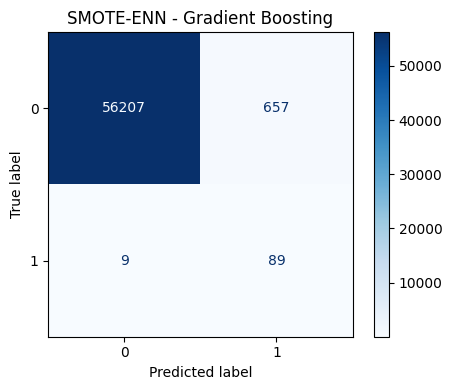

Recall: 0.9081632653061225
Precision: 0.1193029490616622
F1: 0.2109004739336493
Accuracy: 0.9883079948035532


In [ ]:
gb_smoteenn = GradientBoostingClassifier(random_state=42)

gb_smoteenn.fit(X_train_smoteenn, y_train_smoteenn)
y_pred_gb_smoteenn = gb_smoteenn.predict(X_test_scaled)

print("=== GB + SMOTE-ENN ===")

print(classification_report(y_test, y_pred_gb_smoteenn))
cm = confusion_matrix(y_test, y_pred_gb_smoteenn)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("SMOTE-ENN - Gradient Boosting")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_gb_smoteenn))
print("Precision:", precision_score(y_test, y_pred_gb_smoteenn))
print("F1:", f1_score(y_test, y_pred_gb_smoteenn))
print("Accuracy:", accuracy_score(y_test, y_pred_gb_smoteenn))

=== Voting + SMOTE-ENN ===
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     56864
           1       0.18      0.88      0.30        98

    accuracy                           0.99     56962
   macro avg       0.59      0.94      0.65     56962
weighted avg       1.00      0.99      1.00     56962



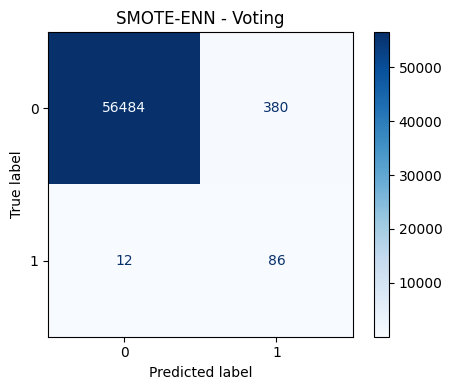

Recall: 0.8775510204081632
Precision: 0.18454935622317598
F1: 0.3049645390070922
Accuracy: 0.993118219163653


In [ ]:
voting_smoteenn = VotingClassifier(
    estimators=[
        ('lr', LogisticRegression(max_iter=1000)),
        ('dt', DecisionTreeClassifier()),
        ('svm', SVC(probability=True))
    ],
    voting='soft'
)

voting_smoteenn.fit(X_train_smoteenn, y_train_smoteenn)
y_pred_voting_smoteenn = voting_smoteenn.predict(X_test_scaled)

print("=== Voting + SMOTE-ENN ===")

print(classification_report(y_test, y_pred_voting_smoteenn))
cm = confusion_matrix(y_test, y_pred_voting_smoteenn)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("SMOTE-ENN - Voting")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_voting_smoteenn))
print("Precision:", precision_score(y_test, y_pred_voting_smoteenn))
print("F1:", f1_score(y_test, y_pred_voting_smoteenn))
print("Accuracy:", accuracy_score(y_test, y_pred_voting_smoteenn))

=== Stacking + SMOTE-ENN ===
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.85      0.85      0.85        98

    accuracy                           1.00     56962
   macro avg       0.92      0.92      0.92     56962
weighted avg       1.00      1.00      1.00     56962



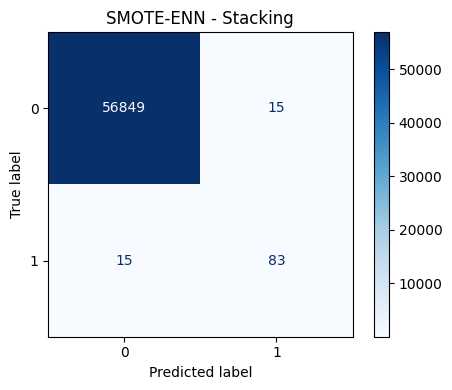

Recall: 0.8469387755102041
Precision: 0.8469387755102041
F1: 0.8469387755102041
Accuracy: 0.9994733330992591


In [ ]:
stacking_smoteenn = StackingClassifier(
    estimators=[
        ('rf', RandomForestClassifier(random_state=42)),
        ('xgb', XGBClassifier(use_label_encoder=False, eval_metric='logloss')),
        ('gb', GradientBoostingClassifier(random_state=42))
    ],
    final_estimator=LogisticRegression(max_iter=1000)
)

stacking_smoteenn.fit(X_train_smoteenn, y_train_smoteenn)
y_pred_stacking_smoteenn = stacking_smoteenn.predict(X_test_scaled)

print("=== Stacking + SMOTE-ENN ===")

print(classification_report(y_test, y_pred_stacking_smoteenn))
cm = confusion_matrix(y_test, y_pred_stacking_smoteenn)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("SMOTE-ENN - Stacking")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_stacking_smoteenn))
print("Precision:", precision_score(y_test, y_pred_stacking_smoteenn))
print("F1:", f1_score(y_test, y_pred_stacking_smoteenn))
print("Accuracy:", accuracy_score(y_test, y_pred_stacking_smoteenn))

### SMOTE-TOMEK

In [ ]:
smote_tomek = SMOTETomek(
    sampling_strategy=0.3,
    smote=SMOTE(
        k_neighbors=3,
        random_state=42
    ),
    tomek=TomekLinks(
        sampling_strategy='auto'
    ),
    random_state=42
)

X_train_smotetomek, y_train_smotetomek = smote_tomek.fit_resample(X_train_scaled, y_train)

print("Before:", y_train.value_counts())
print("After SMOTE-Tomek:", pd.Series(y_train_smotetomek).value_counts())

Before: Class
0    227451
1       394
Name: count, dtype: int64
After SMOTE-Tomek: Class
0    227451
1    227451
Name: count, dtype: int64


=== RF + SMOTE-Tomek ===
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.88      0.82      0.85        98

    accuracy                           1.00     56962
   macro avg       0.94      0.91      0.92     56962
weighted avg       1.00      1.00      1.00     56962



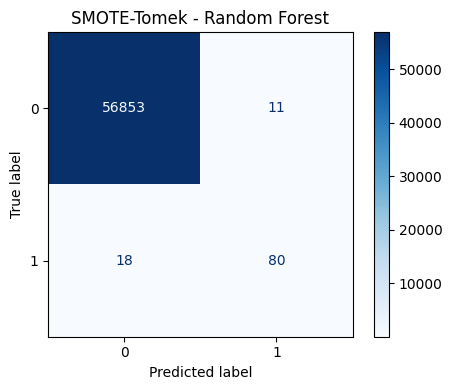

Recall: 0.8163265306122449
Precision: 0.8791208791208791
F1: 0.8465608465608465
Accuracy: 0.9994908886626171


In [ ]:
rf_smotetomek = RandomForestClassifier(random_state=42)

rf_smotetomek.fit(X_train_smotetomek, y_train_smotetomek)
y_pred_rf_smotetomek = rf_smotetomek.predict(X_test_scaled)

print("=== RF + SMOTE-Tomek ===")
print(classification_report(y_test, y_pred_rf_smotetomek))
cm = confusion_matrix(y_test, y_pred_rf_smotetomek)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("SMOTE-Tomek - Random Forest")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_rf_smotetomek))
print("Precision:", precision_score(y_test, y_pred_rf_smotetomek))
print("F1:", f1_score(y_test, y_pred_rf_smotetomek))
print("Accuracy:", accuracy_score(y_test, y_pred_rf_smotetomek))


=== XGB + SMOTE-Tomek ===
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.75      0.88      0.81        98

    accuracy                           1.00     56962
   macro avg       0.88      0.94      0.91     56962
weighted avg       1.00      1.00      1.00     56962



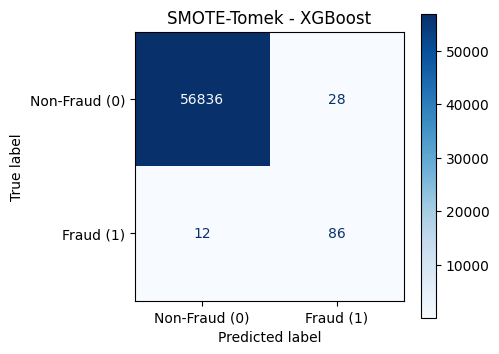

Recall: 0.8775510204081632
Precision: 0.7543859649122807
F1: 0.8113207547169812
Accuracy: 0.9992977774656788


In [ ]:
xgb_smotetomek = XGBClassifier(use_label_encoder=False, eval_metric='logloss')

xgb_smotetomek.fit(X_train_smotetomek, y_train_smotetomek)
y_pred_xgb_smotetomek = xgb_smotetomek.predict(X_test_scaled)

print("=== XGB + SMOTE-Tomek ===")

print(classification_report(y_test, y_pred_xgb_smotetomek))
cm = confusion_matrix(y_test, y_pred_xgb_smotetomek)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Non-Fraud (0)', 'Fraud (1)'])
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("SMOTE-Tomek - XGBoost")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_xgb_smotetomek))
print("Precision:", precision_score(y_test, y_pred_xgb_smotetomek))
print("F1:", f1_score(y_test, y_pred_xgb_smotetomek))
print("Accuracy:", accuracy_score(y_test, y_pred_xgb_smotetomek))

=== GB + SMOTE-Tomek ===
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     56864
           1       0.12      0.91      0.21        98

    accuracy                           0.99     56962
   macro avg       0.56      0.95      0.60     56962
weighted avg       1.00      0.99      0.99     56962



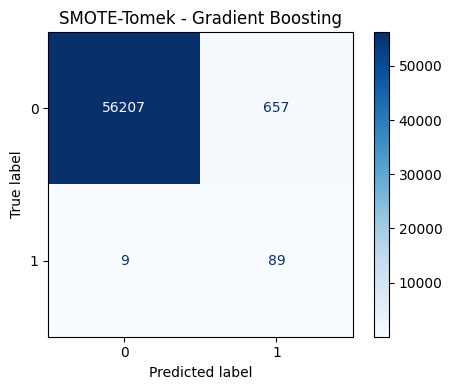

Recall: 0.9081632653061225
Precision: 0.1193029490616622
F1: 0.2109004739336493
Accuracy: 0.9883079948035532


In [ ]:
gb_smotetomek = GradientBoostingClassifier(random_state=42)

gb_smotetomek.fit(X_train_smotetomek, y_train_smotetomek)
y_pred_gb_smotetomek = gb_smotetomek.predict(X_test_scaled)

print("=== GB + SMOTE-Tomek ===")

print(classification_report(y_test, y_pred_gb_smotetomek))
cm = confusion_matrix(y_test, y_pred_gb_smotetomek)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("SMOTE-Tomek - Gradient Boosting")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_gb_smotetomek))
print("Precision:", precision_score(y_test, y_pred_gb_smotetomek))
print("F1:", f1_score(y_test, y_pred_gb_smotetomek))
print("Accuracy:", accuracy_score(y_test, y_pred_gb_smotetomek))

=== Voting + SMOTE-Tomek ===
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     56864
           1       0.18      0.88      0.30        98

    accuracy                           0.99     56962
   macro avg       0.59      0.94      0.65     56962
weighted avg       1.00      0.99      1.00     56962



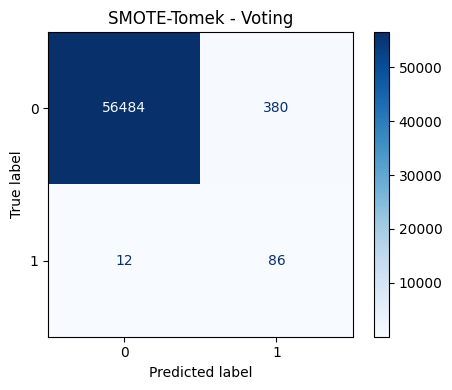

Recall: 0.8775510204081632
Precision: 0.18454935622317598
F1: 0.3049645390070922
Accuracy: 0.993118219163653


In [5]:
voting_smotetomek = VotingClassifier(
    estimators=[
        ('lr', LogisticRegression(max_iter=1000)),
        ('dt', DecisionTreeClassifier()),
        ('svm', SVC(probability=True))
    ],
    voting='soft'
)

voting_smotetomek.fit(X_train_smotetomek, y_train_smotetomek)
y_pred_voting_smotetomek = voting_smotetomek.predict(X_test_scaled)

print("=== Voting + SMOTE-Tomek ===")

print(classification_report(y_test, y_pred_voting_smotetomek))
cm = confusion_matrix(y_test, y_pred_voting_smotetomek)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("SMOTE-Tomek - Voting")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_voting_smotetomek))
print("Precision:", precision_score(y_test, y_pred_voting_smotetomek))
print("F1:", f1_score(y_test, y_pred_voting_smotetomek))
print("Accuracy:", accuracy_score(y_test, y_pred_voting_smotetomek))

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [23:01:01] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [23:56:27] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [23:56:31] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [23:56:35] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:

=== Stacking + SMOTE-Tomek ===
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.85      0.87      0.86        98

    accuracy                           1.00     56962
   macro avg       0.92      0.93      0.93     56962
weighted avg       1.00      1.00      1.00     56962



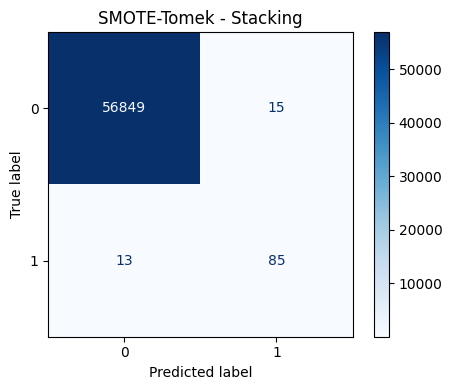

Recall: 0.8673469387755102
Precision: 0.85
F1: 0.8585858585858586
Accuracy: 0.9995084442259752


In [7]:
stacking_smotetomek = StackingClassifier(
    estimators=[
        ('rf', RandomForestClassifier(random_state=42)),
        ('xgb', XGBClassifier(use_label_encoder=False, eval_metric='logloss')),
        ('gb', GradientBoostingClassifier(random_state=42))
    ],
    final_estimator=LogisticRegression(max_iter=1000)
)

stacking_smotetomek.fit(X_train_smotetomek, y_train_smotetomek)
y_pred_stacking_smotetomek = stacking_smotetomek.predict(X_test_scaled)

print("=== Stacking + SMOTE-Tomek ===")

print(classification_report(y_test, y_pred_stacking_smotetomek))
cm = confusion_matrix(y_test, y_pred_stacking_smotetomek)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig, ax = plt.subplots(figsize=(5, 4))
disp.plot(ax=ax, cmap="Blues", colorbar=True)
ax.set_title("SMOTE-Tomek - Stacking")
plt.tight_layout()
plt.show()

print("Recall:", recall_score(y_test, y_pred_stacking_smotetomek))
print("Precision:", precision_score(y_test, y_pred_stacking_smotetomek))
print("F1:", f1_score(y_test, y_pred_stacking_smotetomek))
print("Accuracy:", accuracy_score(y_test, y_pred_stacking_smotetomek))

---
# Analisis Hasil & Perbandingan Performa

Bagian ini menyajikan ringkasan komparatif dari seluruh eksperimen yang telah dilakukan, 
mencakup **9 kondisi resampling** (termasuk baseline) **× 5 model ensemble = 45 eksperimen total**.

Seluruh model menggunakan **parameter default** dari masing-masing library (scikit-learn / XGBoost).

In [4]:
# ============================================================
# TABEL RINGKASAN KOMPARATIF SELURUH EKSPERIMEN
# ============================================================

from sklearn.metrics import recall_score, precision_score, f1_score, accuracy_score

# Kumpulkan semua hasil prediksi
results = {}

# --- Baseline ---
results['Baseline × Random Forest'] = y_pred_rf
results['Baseline × XGBoost'] = y_pred_xgb
results['Baseline × Gradient Boosting'] = y_pred_gb
results['Baseline × Soft Voting'] = y_pred_voting
results['Baseline × Stacking'] = y_pred_stacking

# --- SMOTE ---
results['SMOTE × Random Forest'] = y_pred_rf_smote
results['SMOTE × XGBoost'] = y_pred_xgb_smote
results['SMOTE × Gradient Boosting'] = y_pred_gb_smote
results['SMOTE × Soft Voting'] = y_pred_voting_smote
results['SMOTE × Stacking'] = y_pred_stacking_smote

# --- ADASYN ---
results['ADASYN × Random Forest'] = y_pred_rf_adasyn
results['ADASYN × XGBoost'] = y_pred_xgb_adasyn
results['ADASYN × Gradient Boosting'] = y_pred_gb_adasyn
results['ADASYN × Soft Voting'] = y_pred_voting_adasyn
results['ADASYN × Stacking'] = y_pred_stacking_adasyn

# --- Random Oversampling ---
results['Random OS × Random Forest'] = y_pred_rf_ros
results['Random OS × XGBoost'] = y_pred_xgb_ros
results['Random OS × Gradient Boosting'] = y_pred_gb_ros
results['Random OS × Soft Voting'] = y_pred_voting_ros
results['Random OS × Stacking'] = y_pred_stacking_ros

# --- Random Undersampling ---
results['Random US × Random Forest'] = y_pred_rf_rus
results['Random US × XGBoost'] = y_pred_xgb_rus
results['Random US × Gradient Boosting'] = y_pred_gb_rus
results['Random US × Soft Voting'] = y_pred_voting_rus
results['Random US × Stacking'] = y_pred_stacking_rus

# --- Tomek Links ---
results['Tomek Links × Random Forest'] = y_pred_rf_tomek
results['Tomek Links × XGBoost'] = y_pred_xgb_tomek
results['Tomek Links × Gradient Boosting'] = y_pred_gb_tomek
results['Tomek Links × Soft Voting'] = y_pred_voting_tomek
results['Tomek Links × Stacking'] = y_pred_stacking_tomek

# --- ENN ---
results['ENN × Random Forest'] = y_pred_rf_enn
results['ENN × XGBoost'] = y_pred_xgb_enn
results['ENN × Gradient Boosting'] = y_pred_gb_enn
results['ENN × Soft Voting'] = y_pred_voting_enn
results['ENN × Stacking'] = y_pred_stacking_enn

# --- SMOTE-ENN ---
results['SMOTE-ENN × Random Forest'] = y_pred_rf_smoteenn
results['SMOTE-ENN × XGBoost'] = y_pred_xgb_smoteenn
results['SMOTE-ENN × Gradient Boosting'] = y_pred_gb_smoteenn
results['SMOTE-ENN × Soft Voting'] = y_pred_voting_smoteenn
results['SMOTE-ENN × Stacking'] = y_pred_stacking_smoteenn

# --- SMOTE-Tomek ---
results['SMOTE-Tomek × Random Forest'] = y_pred_rf_smotetomek
results['SMOTE-Tomek × XGBoost'] = y_pred_xgb_smotetomek
results['SMOTE-Tomek × Gradient Boosting'] = y_pred_gb_smotetomek
results['SMOTE-Tomek × Soft Voting'] = y_pred_voting_smotetomek
results['SMOTE-Tomek × Stacking'] = y_pred_stacking_smotetomek

# Hitung metrik untuk setiap kombinasi
rows = []
for name, y_pred in results.items():
    parts = name.split(' × ')
    sampling = parts[0]
    model = parts[1]
    rows.append({
        'Teknik Resampling': sampling,
        'Model': model,
        'Recall': round(recall_score(y_test, y_pred), 4),
        'Precision': round(precision_score(y_test, y_pred), 4),
        'F1-Score': round(f1_score(y_test, y_pred), 4),
        'Accuracy': round(accuracy_score(y_test, y_pred), 4)
    })

df_results = pd.DataFrame(rows)

# Urutkan berdasarkan Recall tertinggi
df_results_sorted = df_results.sort_values('Recall', ascending=False).reset_index(drop=True)
df_results_sorted.index = df_results_sorted.index + 1
df_results_sorted.index.name = 'Rank'

print("=" * 90)
print("TABEL RINGKASAN PERFORMA SELURUH EKSPERIMEN")
print("Diurutkan berdasarkan Recall (Sensitivitas) kelas Fraud")
print("Seluruh model menggunakan parameter default")
print("=" * 90)
print(df_results_sorted.to_string())


TABEL RINGKASAN PERFORMA SELURUH EKSPERIMEN
Diurutkan berdasarkan Recall (Sensitivitas) kelas Fraud
Seluruh model menggunakan parameter default
     Teknik Resampling              Model  Recall  Precision  F1-Score  Accuracy
Rank                                                                            
1            Random US        Soft Voting  0.9184     0.1128    0.2009    0.9874
2          SMOTE-Tomek  Gradient Boosting  0.9082     0.1193    0.2109    0.9883
3            SMOTE-ENN  Gradient Boosting  0.9082     0.1193    0.2109    0.9883
4               ADASYN           Stacking  0.8980     0.3520    0.5057    0.9970
5               ADASYN  Gradient Boosting  0.8980     0.1064    0.1903    0.9869
6            Random US           Stacking  0.8980     0.0985    0.1776    0.9857
7            Random US            XGBoost  0.8980     0.0917    0.1664    0.9845
8            Random OS  Gradient Boosting  0.8878     0.3551    0.5073    0.9970
9            Random US  Gradient Boosting  0.8

In [5]:
# ============================================================
# TABEL PIVOT: RECALL PER MODEL × TEKNIK RESAMPLING
# ============================================================

# Urutan logis untuk resampling
order = ['Baseline', 'SMOTE', 'ADASYN', 'Random OS', 'Random US',
         'Tomek Links', 'ENN', 'SMOTE-ENN', 'SMOTE-Tomek']

# Pivot Recall
pivot_recall = df_results.pivot_table(
    values='Recall', index='Teknik Resampling', columns='Model', aggfunc='first'
).reindex(order)

# Pivot Precision
pivot_precision = df_results.pivot_table(
    values='Precision', index='Teknik Resampling', columns='Model', aggfunc='first'
).reindex(order)

# Pivot F1
pivot_f1 = df_results.pivot_table(
    values='F1-Score', index='Teknik Resampling', columns='Model', aggfunc='first'
).reindex(order)

print("\n" + "=" * 80)
print("PIVOT TABLE: RECALL per Model × Teknik Resampling")
print("=" * 80)
print(pivot_recall.round(4).to_string())

print("\n" + "=" * 80)
print("PIVOT TABLE: PRECISION per Model × Teknik Resampling")
print("=" * 80)
print(pivot_precision.round(4).to_string())

print("\n" + "=" * 80)
print("PIVOT TABLE: F1-SCORE per Model × Teknik Resampling")
print("=" * 80)
print(pivot_f1.round(4).to_string())



PIVOT TABLE: RECALL per Model × Teknik Resampling
Model              Gradient Boosting  Random Forest  Soft Voting  Stacking  XGBoost
Teknik Resampling                                                                  
Baseline                      0.1837         0.8163       0.7449    0.7755   0.7959
SMOTE                         0.8878         0.8469       0.8776    0.8571   0.8673
ADASYN                        0.8980         0.7959       0.8163    0.8980   0.8163
Random OS                     0.8878         0.8061       0.8673    0.8265   0.8367
Random US                     0.8878         0.8878       0.9184    0.8980   0.8980
Tomek Links                   0.1633         0.8163       0.7653    0.8061   0.7959
ENN                           0.6224         0.8265       0.7857    0.8061   0.8367
SMOTE-ENN                     0.9082         0.8163       0.8776    0.8469   0.8469
SMOTE-Tomek                   0.9082         0.8163       0.8776    0.8673   0.8776

PIVOT TABLE: PRECISION p

## Visualisasi Heatmap Perbandingan Metrik

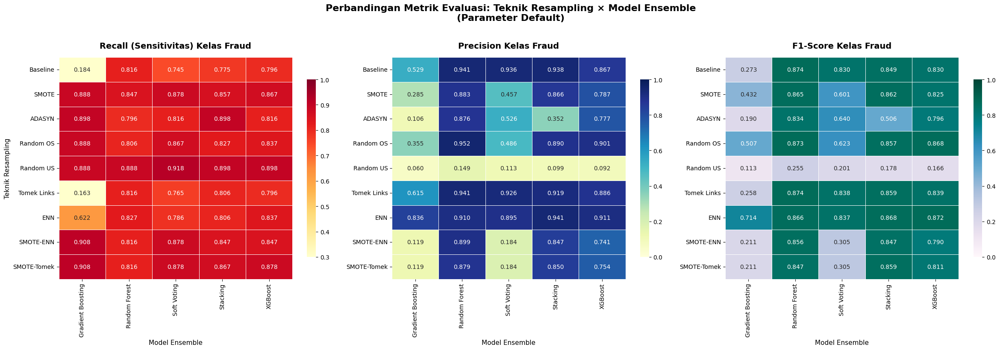

In [6]:
# ============================================================
# HEATMAP RECALL, PRECISION, F1-SCORE
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(24, 8))

# Heatmap Recall
sns.heatmap(pivot_recall, annot=True, fmt='.3f', cmap='YlOrRd', ax=axes[0],
            vmin=0.3, vmax=1.0, linewidths=0.5, cbar_kws={'shrink': 0.8})
axes[0].set_title('Recall (Sensitivitas) Kelas Fraud', fontsize=14, fontweight='bold', pad=15)
axes[0].set_ylabel('Teknik Resampling', fontsize=11)
axes[0].set_xlabel('Model Ensemble', fontsize=11)

# Heatmap Precision
sns.heatmap(pivot_precision, annot=True, fmt='.3f', cmap='YlGnBu', ax=axes[1],
            vmin=0.0, vmax=1.0, linewidths=0.5, cbar_kws={'shrink': 0.8})
axes[1].set_title('Precision Kelas Fraud', fontsize=14, fontweight='bold', pad=15)
axes[1].set_ylabel('')
axes[1].set_xlabel('Model Ensemble', fontsize=11)

# Heatmap F1-Score
sns.heatmap(pivot_f1, annot=True, fmt='.3f', cmap='PuBuGn', ax=axes[2],
            vmin=0.0, vmax=1.0, linewidths=0.5, cbar_kws={'shrink': 0.8})
axes[2].set_title('F1-Score Kelas Fraud', fontsize=14, fontweight='bold', pad=15)
axes[2].set_ylabel('')
axes[2].set_xlabel('Model Ensemble', fontsize=11)

plt.suptitle('Perbandingan Metrik Evaluasi: Teknik Resampling × Model Ensemble\n(Parameter Default)',
             fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()


## Analisis Peningkatan Recall terhadap Baseline

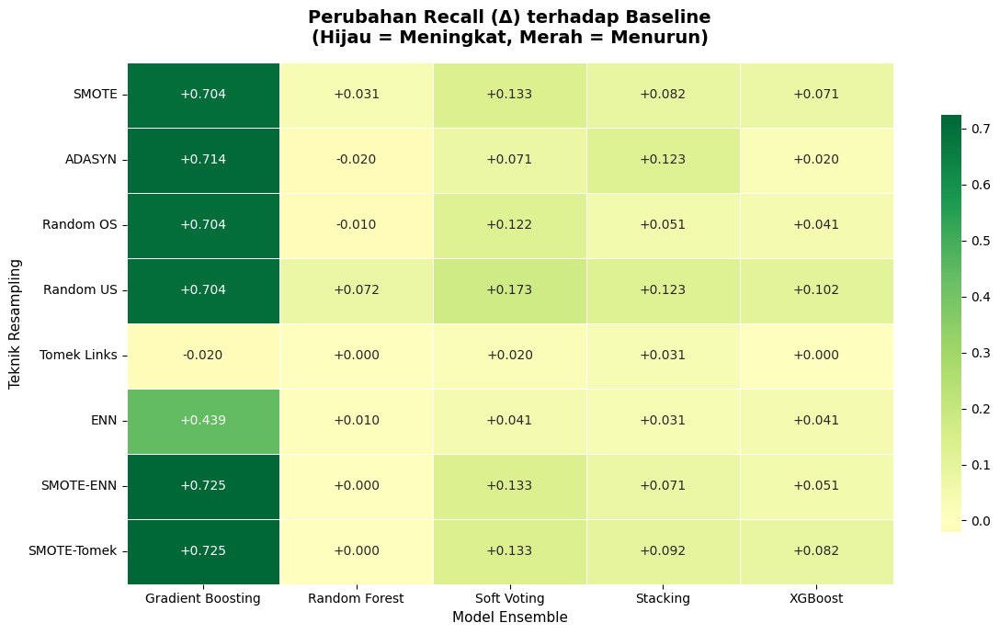


Rata-rata Peningkatan Recall per Teknik Resampling:
Teknik Resampling
Random US      0.2347
SMOTE-Tomek    0.2061
SMOTE          0.2041
SMOTE-ENN      0.1959
ADASYN         0.1816
Random OS      0.1816
ENN            0.1122
Tomek Links    0.0061

Rata-rata Peningkatan Recall per Model Ensemble:
Model
Gradient Boosting    0.5867
Soft Voting          0.1033
Stacking             0.0753
XGBoost              0.0510
Random Forest        0.0102


In [7]:
# ============================================================
# ANALISIS DELTA RECALL: RESAMPLING vs BASELINE
# ============================================================

baseline_recall = pivot_recall.loc['Baseline']
delta_recall = pivot_recall.subtract(baseline_recall, axis=1).drop('Baseline')

fig, ax = plt.subplots(figsize=(12, 7))
sns.heatmap(delta_recall, annot=True, fmt='+.3f', cmap='RdYlGn', center=0,
            linewidths=0.5, ax=ax, cbar_kws={'shrink': 0.8})
ax.set_title('Perubahan Recall (Δ) terhadap Baseline\n(Hijau = Meningkat, Merah = Menurun)',
             fontsize=14, fontweight='bold', pad=15)
ax.set_ylabel('Teknik Resampling', fontsize=11)
ax.set_xlabel('Model Ensemble', fontsize=11)
plt.tight_layout()
plt.show()

print("\nRata-rata Peningkatan Recall per Teknik Resampling:")
print(delta_recall.mean(axis=1).sort_values(ascending=False).round(4).to_string())

print("\nRata-rata Peningkatan Recall per Model Ensemble:")
print(delta_recall.mean(axis=0).sort_values(ascending=False).round(4).to_string())


## Visualisasi Top-10 Kombinasi

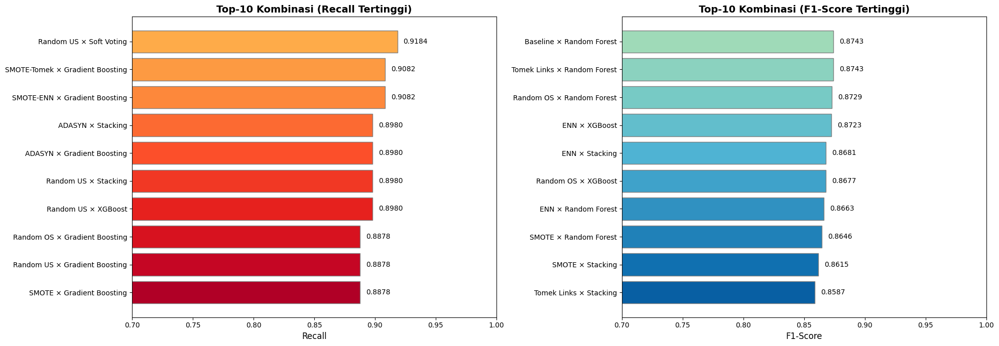

In [8]:
# ============================================================
# BAR CHART: TOP-10 KOMBINASI BERDASARKAN RECALL & F1
# ============================================================

top10 = df_results_sorted.head(10).copy()
top10['Label'] = top10['Teknik Resampling'] + ' × ' + top10['Model']

fig, axes = plt.subplots(1, 2, figsize=(20, 7))

# Plot 1: Top-10 by Recall
colors_recall = plt.cm.YlOrRd(np.linspace(0.4, 0.9, len(top10)))
bars = axes[0].barh(top10['Label'][::-1], top10['Recall'][::-1],
                    color=colors_recall[::-1], edgecolor='gray')
axes[0].set_xlabel('Recall', fontsize=12)
axes[0].set_title('Top-10 Kombinasi (Recall Tertinggi)', fontsize=14, fontweight='bold')
axes[0].set_xlim([0.7, 1.0])
for bar, val in zip(bars, top10['Recall'][::-1]):
    axes[0].text(bar.get_width() + 0.005, bar.get_y() + bar.get_height()/2,
                f'{val:.4f}', va='center', fontsize=10)

# Plot 2: Top-10 by F1
top10_f1 = df_results.sort_values('F1-Score', ascending=False).head(10).copy()
top10_f1['Label'] = top10_f1['Teknik Resampling'] + ' × ' + top10_f1['Model']
colors_f1 = plt.cm.GnBu(np.linspace(0.4, 0.9, len(top10_f1)))
bars2 = axes[1].barh(top10_f1['Label'][::-1], top10_f1['F1-Score'][::-1],
                     color=colors_f1[::-1], edgecolor='gray')
axes[1].set_xlabel('F1-Score', fontsize=12)
axes[1].set_title('Top-10 Kombinasi (F1-Score Tertinggi)', fontsize=14, fontweight='bold')
axes[1].set_xlim([0.7, 1.0])
for bar, val in zip(bars2, top10_f1['F1-Score'][::-1]):
    axes[1].text(bar.get_width() + 0.005, bar.get_y() + bar.get_height()/2,
                f'{val:.4f}', va='center', fontsize=10)

plt.tight_layout()
plt.show()


/tmp/ipykernel_59/3746938271.py:29: RuntimeWarning: divide by zero encountered in divide
  precision_line = (f1_val * recall_line) / (2 * recall_line - f1_val)


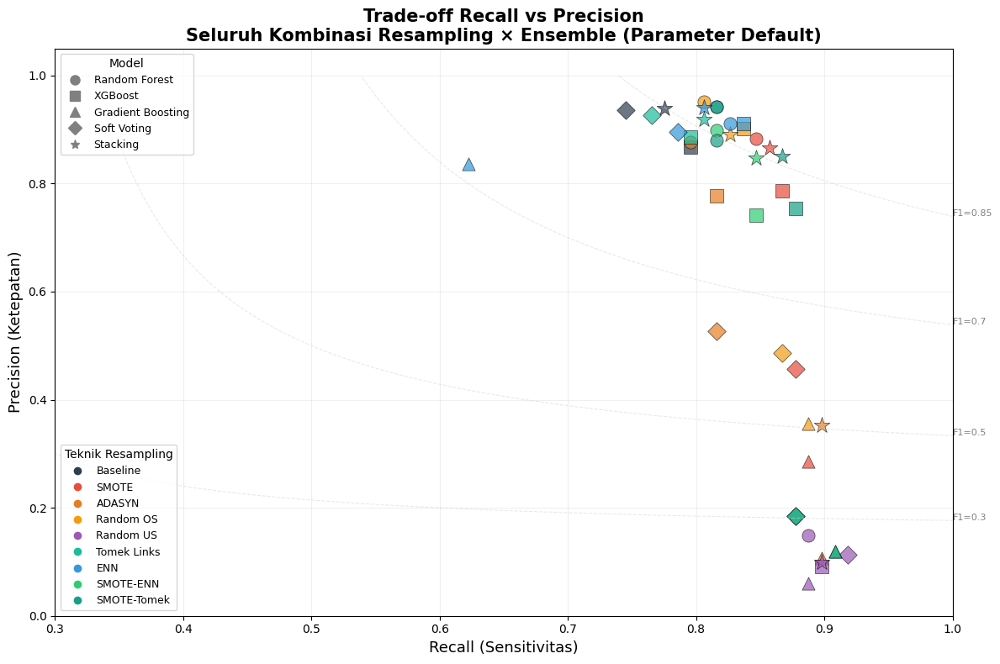

In [9]:
# ============================================================
# SCATTER PLOT: RECALL vs PRECISION (Trade-off)
# ============================================================

from matplotlib.lines import Line2D

fig, ax = plt.subplots(figsize=(12, 8))

sampling_colors = {
    'Baseline': '#2c3e50', 'SMOTE': '#e74c3c', 'ADASYN': '#e67e22',
    'Random OS': '#f39c12', 'Random US': '#9b59b6', 'Tomek Links': '#1abc9c',
    'ENN': '#3498db', 'SMOTE-ENN': '#2ecc71', 'SMOTE-Tomek': '#16a085'
}
model_markers = {
    'Random Forest': 'o', 'XGBoost': 's', 'Gradient Boosting': '^',
    'Soft Voting': 'D', 'Stacking': '*'
}

for _, row in df_results.iterrows():
    color = sampling_colors.get(row['Teknik Resampling'], 'gray')
    marker = model_markers.get(row['Model'], 'o')
    size = 200 if marker == '*' else 120
    ax.scatter(row['Recall'], row['Precision'], c=color, marker=marker,
              s=size, alpha=0.7, edgecolors='black', linewidth=0.5)

# F1 iso-contour lines
for f1_val in [0.3, 0.5, 0.7, 0.85]:
    recall_line = np.linspace(0.01, 1.0, 100)
    precision_line = (f1_val * recall_line) / (2 * recall_line - f1_val)
    valid = (precision_line > 0) & (precision_line <= 1)
    ax.plot(recall_line[valid], precision_line[valid], '--', color='lightgray',
           alpha=0.5, linewidth=0.8)
    ax.annotate(f'F1={f1_val}', xy=(recall_line[valid][-1], precision_line[valid][-1]),
               fontsize=8, color='gray')

# Legends
legend1_handles = [Line2D([0], [0], marker='o', color='w', markerfacecolor=c,
                          markersize=8, label=s) for s, c in sampling_colors.items()]
legend1 = ax.legend(handles=legend1_handles, title='Teknik Resampling',
                    loc='lower left', fontsize=9)

legend2_handles = [Line2D([0], [0], marker=m, color='gray', markerfacecolor='gray',
                          markersize=8, label=n, linestyle='None')
                   for n, m in model_markers.items()]
legend2 = ax.legend(handles=legend2_handles, title='Model', loc='upper left', fontsize=9)
ax.add_artist(legend1)

ax.set_xlabel('Recall (Sensitivitas)', fontsize=13)
ax.set_ylabel('Precision (Ketepatan)', fontsize=13)
ax.set_title('Trade-off Recall vs Precision\nSeluruh Kombinasi Resampling × Ensemble (Parameter Default)',
             fontsize=15, fontweight='bold')
ax.set_xlim([0.3, 1.0])
ax.set_ylim([0.0, 1.05])
ax.grid(True, alpha=0.2)
plt.tight_layout()
plt.show()


## Visualisasi Tambahan

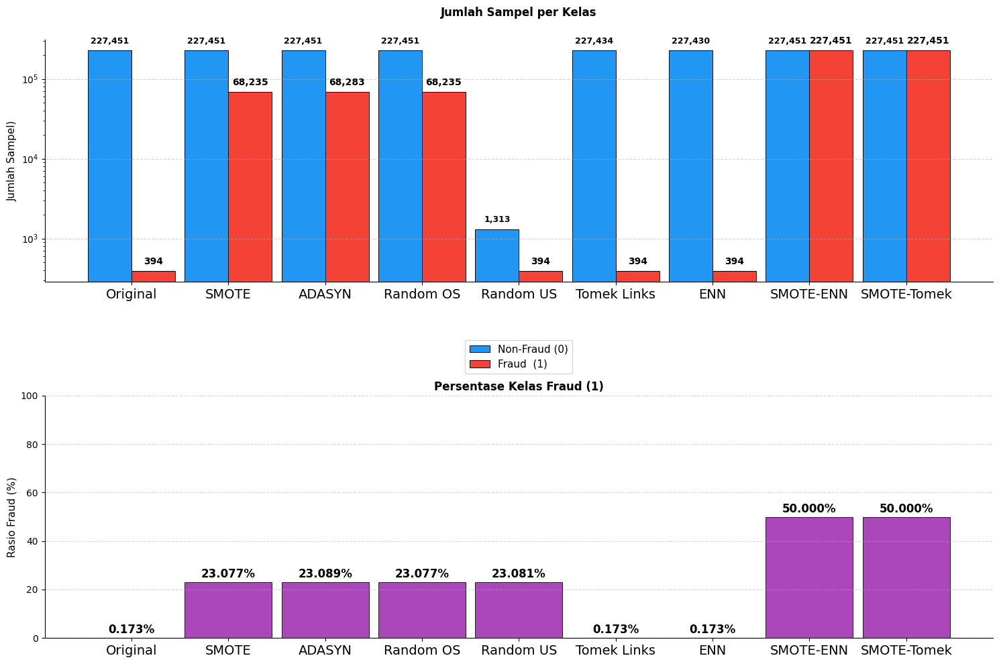

In [ ]:
# ============================================================
# DISTRIBUSI KELAS: ORIGINAL vs SEMUA METODE RESAMPLING
# Satu grafik gabungan (grouped bar chart)
# ============================================================

# ── Dataset list ─────────────────────────────────────────────────────────────
datasets = [
    ('Original',           y_train),
    ('SMOTE',              y_train_smote),
    ('ADASYN',             y_train_adasyn),
    ('Random OS',          y_train_ros),
    ('Random US',          y_train_rus),
    ('Tomek Links',        y_train_tomek),
    ('ENN',                y_train_enn),
    ('SMOTE-ENN',          y_train_smoteenn),
    ('SMOTE-Tomek',        y_train_smotetomek),
]

labels   = [d[0] for d in datasets]
normal_c = []
fraud_c  = []
fraud_pct = []

for _, y in datasets:
    vc = pd.Series(y).value_counts().sort_index()
    c0 = int(vc.get(0, 0))
    c1 = int(vc.get(1, 0))
    normal_c.append(c0)
    fraud_c.append(c1)
    fraud_pct.append(c1 / (c0 + c1) * 100)

x     = np.arange(len(labels))
width = 0.45

# ── Figure: 2 panels (top=count log, bottom=fraud %) ─────────────────────────
fig, (ax1, ax2) = plt.subplots(
    2, 1,
    figsize=(15, 10),
    gridspec_kw={'height_ratios': [1, 1]},

)
# fig.suptitle(
#     'Distribusi Kelas Data Training: Original vs Setelah Resampling',
#     fontsize=16, fontweight='bold', y=1.01
# )

# ── Panel atas: Grouped bar chart (skala log) ─────────────────────────────────
bars_n = ax1.bar(x - width/2, normal_c, width, label='Non-Fraud (0)',
                 color='#2196F3', edgecolor='black', linewidth=0.7)
bars_f = ax1.bar(x + width/2, fraud_c,  width, label='Fraud  (1)',
                 color='#F44336', edgecolor='black', linewidth=0.7)

ax1.set_yscale('log')
ax1.set_ylabel('Jumlah Sampel)', fontsize=11)
ax1.set_title('Jumlah Sampel per Kelas', fontsize=12, fontweight='bold', pad=25)
ax1.set_xticks(x)
ax1.set_xticklabels(labels, fontsize=14)
ax1.grid(axis='y', linestyle='--', alpha=0.5)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.legend(fontsize=11, loc='lower center', bbox_to_anchor=(0.5, -0.4))

# Annotate count on each bar
for bar in bars_n:
    h = bar.get_height()
    ax1.text(
        bar.get_x() + bar.get_width() / 2, h * 1.15,
        f'{int(h):,}', ha='center', va='bottom', fontsize=9,
        fontweight='bold', color='black'
    )
for bar in bars_f:
    h = bar.get_height()
    ax1.text(
        bar.get_x() + bar.get_width() / 2, h * 1.15,
        f'{int(h):,}', ha='center', va='bottom', fontsize=10,
        fontweight='bold', color='black'
    )

# ── Panel bawah: Fraud ratio bar ─────────────────────────────────────────────
bar_colors = ['#9C27B0' if pct > 1 else '#FF9800' for pct in fraud_pct]
bars_pct = ax2.bar(x, fraud_pct, width * 2, color=bar_colors,
                   edgecolor='black', linewidth=0.7, alpha=0.85)

ax2.set_ylabel('Rasio Fraud (%)', fontsize=11)
ax2.set_title('Persentase Kelas Fraud (1)', fontsize=12, fontweight='bold')
ax2.set_xticks(x)
ax2.set_xticklabels(labels, fontsize=14)
ax2.grid(axis='y', linestyle='--', alpha=0.5)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

# Annotate percentage on bars
for bar, pct in zip(bars_pct, fraud_pct):
    ax2.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + max(fraud_pct) * 0.015,
        f'{pct:.3f}%', ha='center', va='bottom',
        fontsize=12, fontweight='bold'
    )

ax2.set_ylim(0, max(fraud_pct) * 2)

# # Legend for panel bawah
# p1 = mpatches.Patch(color='#FF9800', label='Fraud < 1% (heavily imbalanced)')
# p2 = mpatches.Patch(color='#9C27B0', label='Fraud >= 1% (more balanced)')
# ax2.legend(handles=[p1, p2], fontsize=9, loc='upper right')

plt.tight_layout()
plt.show()

# # ── Tabel ringkasan ───────────────────────────────────────────────────────────
# print('\n=== Ringkasan Distribusi Kelas per Metode Resampling ===')
# print(f'{"Metode":<22} {"Normal (0)":>14} {"Fraud (1)":>12} {"Total":>10} {"Fraud %":>9}')
# print('-' * 74)
# for lbl, c0, c1, pct in zip(labels, normal_c, fraud_c, fraud_pct):
#     print(f'{lbl:<22} {c0:>14,} {c1:>12,} {c0+c1:>10,} {pct:>8.4f}%')
# print('-' * 74)


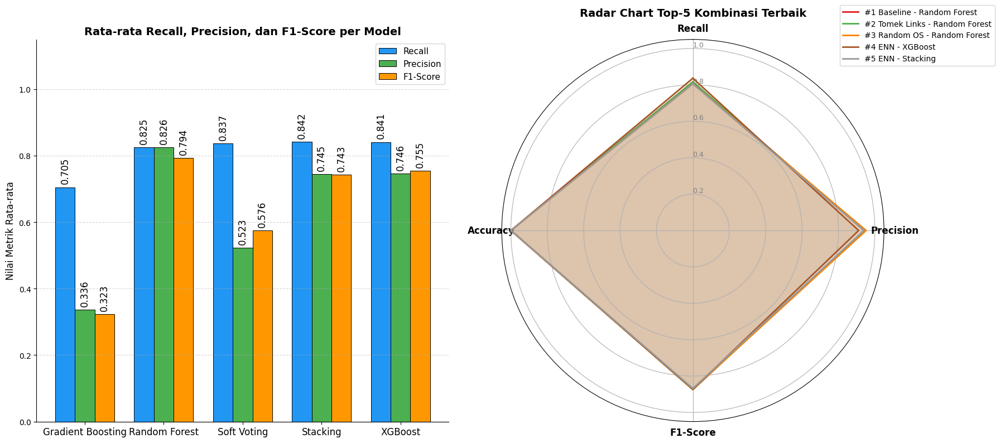

In [ ]:
# ============================================================
# VISUALISASI TAMBAHAN: GROUPED BAR CHART & RADAR CHART
# ============================================================

fig = plt.figure(figsize=(18, 8))

# ── Plot 1: Grouped Bar Chart (Rata-rata Kinerja per Model) ─────────────────
# Menghitung rata-rata Recall, Precision, dan F1-Score per Model
df_avg_model = df_results.groupby('Model')[['Recall', 'Precision', 'F1-Score']].mean().reset_index()
models = df_avg_model['Model'].tolist()
recall_avg = df_avg_model['Recall'].tolist()
precision_avg = df_avg_model['Precision'].tolist()
f1_avg = df_avg_model['F1-Score'].tolist()

ax1 = fig.add_subplot(1, 2, 1)
x = np.arange(len(models))
width = 0.25

bars1 = ax1.bar(x - width, recall_avg, width, label='Recall', color='#2196F3', edgecolor='black', linewidth=0.7)
bars2 = ax1.bar(x, precision_avg, width, label='Precision', color='#4CAF50', edgecolor='black', linewidth=0.7)
bars3 = ax1.bar(x + width, f1_avg, width, label='F1-Score', color='#FF9800', edgecolor='black', linewidth=0.7)

ax1.set_ylabel('Nilai Metrik Rata-rata', fontsize=12)
ax1.set_title('Rata-rata Recall, Precision, dan F1-Score per Model', fontsize=14, fontweight='bold')
ax1.set_xticks(x)
ax1.set_xticklabels(models, fontsize=12)
ax1.legend(fontsize=11)
ax1.grid(axis='y', linestyle='--', alpha=0.5)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.set_ylim(0, 1.15)

# Anotasi bar
for bars in [bars1, bars2, bars3]:
    for bar in bars:
        yval = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2.0, yval + 0.01,
                 f'{yval:.3f}', ha='center', va='bottom', fontsize=12, rotation=90)

# ── Plot 2: Radar Chart (Top-5 Kombinasi) ────────────────────────────────────
ax2 = fig.add_subplot(1, 2, 2, polar=True)

# Menggunakan top5 yang sudah diinisialisasi sebelumnya (berdasarkan F1-Score tertinggi)
metrics = ['Recall', 'Precision', 'F1-Score', 'Accuracy']
N = len(metrics)
angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]

ax2.set_theta_offset(pi / 2)
ax2.set_theta_direction(-1)
ax2.set_xticks(angles[:-1])
ax2.set_xticklabels(metrics, fontsize=12, fontweight='bold')
ax2.set_rlabel_position(0)
ax2.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
ax2.set_yticklabels(['0.2', '0.4', '0.6', '0.8', '1.0'], color='gray', size=9)
ax2.set_ylim(0, 1.05)

colors_radar = plt.cm.Set1(np.linspace(0, 1, 5))

for i in range(5):
    row = top5.iloc[i]
    label = f"#{i+1} {row['Teknik Resampling']} - {row['Model']}"
    values = row[metrics].tolist()
    values += values[:1]
    ax2.plot(angles, values, linewidth=2, linestyle='solid', label=label, color=colors_radar[i])
    ax2.fill(angles, values, alpha=0.1, color=colors_radar[i])

ax2.set_title('Radar Chart Top-5 Kombinasi Terbaik', fontsize=14, fontweight='bold', pad=30)
ax2.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1), fontsize=10)

plt.tight_layout()
plt.show()


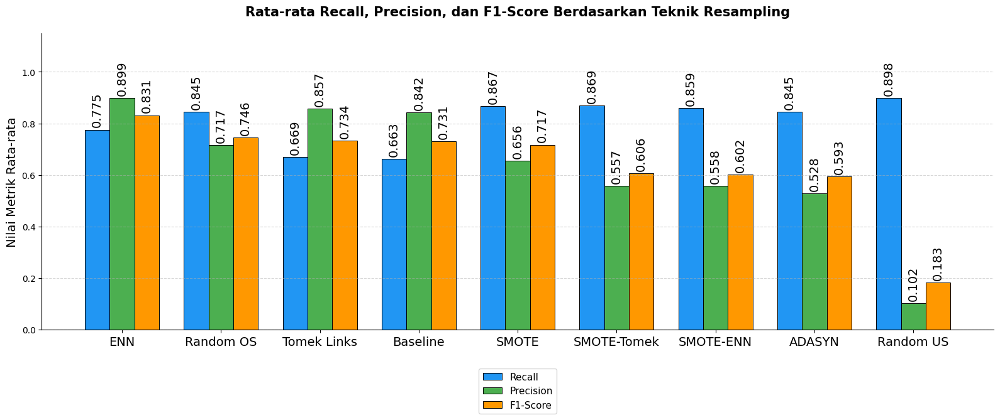

In [ ]:
# ============================================================
# GROUPED BAR CHART: RATA-RATA KINERJA PER TEKNIK RESAMPLING
# ============================================================

fig, ax = plt.subplots(figsize=(16, 7))

# Menghitung rata-rata metrik per teknik resampling
df_avg_sampling = df_results.groupby('Teknik Resampling')[['Recall', 'Precision', 'F1-Score']].mean().reset_index()
# Opsional: urutkan berdasarkan F1-Score agar lebih rapi
df_avg_sampling = df_avg_sampling.sort_values('F1-Score', ascending=False)

samplings = df_avg_sampling['Teknik Resampling'].tolist()
recall_avg = df_avg_sampling['Recall'].tolist()
precision_avg = df_avg_sampling['Precision'].tolist()
f1_avg = df_avg_sampling['F1-Score'].tolist()

x = np.arange(len(samplings))
width = 0.25

bars1 = ax.bar(x - width, recall_avg, width, label='Recall', color='#2196F3', edgecolor='black', linewidth=0.7)
bars2 = ax.bar(x, precision_avg, width, label='Precision', color='#4CAF50', edgecolor='black', linewidth=0.7)
bars3 = ax.bar(x + width, f1_avg, width, label='F1-Score', color='#FF9800', edgecolor='black', linewidth=0.7)

ax.set_ylabel('Nilai Metrik Rata-rata', fontsize=14)
ax.set_title('Rata-rata Recall, Precision, dan F1-Score Berdasarkan Teknik Resampling', fontsize=15, fontweight='bold', pad=20)
ax.set_xticks(x)
ax.set_xticklabels(samplings, fontsize=14)
ax.legend(fontsize=11, bbox_to_anchor=(0.5, -0.3), loc='lower center')
ax.grid(axis='y', linestyle='--', alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_ylim(0, 1.15)

# Anotasi bar
for bars in [bars1, bars2, bars3]:
    for bar in bars:
        yval = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2.0, yval + 0.01,
                 f'{yval:.3f}', ha='center', va='bottom', fontsize=14, rotation=90)

plt.tight_layout()
plt.show()

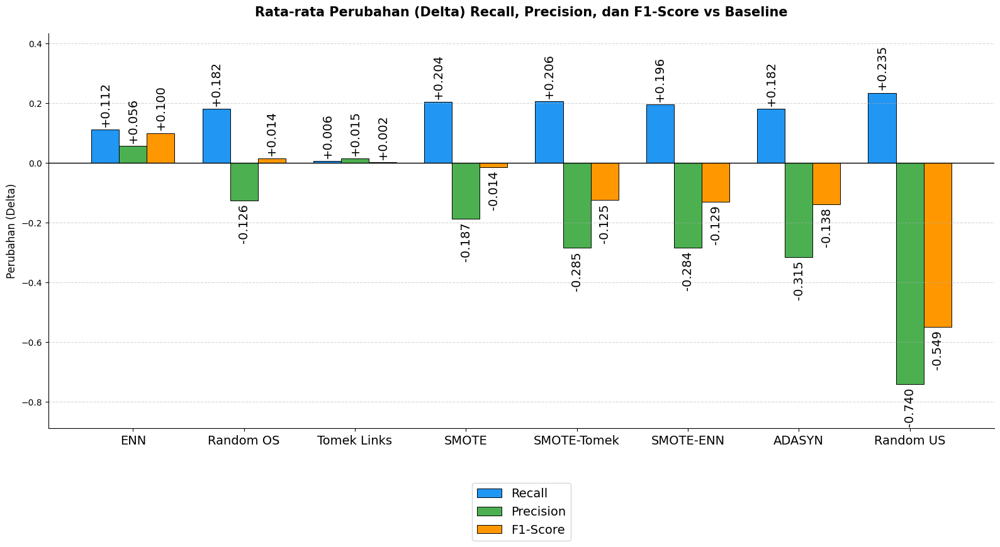

In [ ]:
# ============================================================
# GROUPED BAR CHART: DELTA PERFORMA (RESAMPLING - BASELINE)
# ============================================================

# Memisahkan baseline dan resampling
df_base = df_results[df_results['Teknik Resampling'] == 'Baseline'].set_index('Model')
df_resample = df_results[df_results['Teknik Resampling'] != 'Baseline']

# Menghitung delta (Perbedaan) untuk setiap baris eksperimen
delta_rows = []
for _, row in df_resample.iterrows():
    model = row['Model']
    base_metrics = df_base.loc[model]
    delta_rows.append({
        'Teknik Resampling': row['Teknik Resampling'],
        'Model': model,
        'Delta Recall': row['Recall'] - base_metrics['Recall'],
        'Delta Precision': row['Precision'] - base_metrics['Precision'],
        'Delta F1-Score': row['F1-Score'] - base_metrics['F1-Score']
    })

df_delta = pd.DataFrame(delta_rows)

# Rata-rata delta per teknik resampling
df_avg_delta = df_delta.groupby('Teknik Resampling')[['Delta Recall', 'Delta Precision', 'Delta F1-Score']].mean().reset_index()
df_avg_delta = df_avg_delta.sort_values('Delta F1-Score', ascending=False) # Urutkan dari F1-Score delta terbaik

fig, ax = plt.subplots(figsize=(16, 9))

samplings = df_avg_delta['Teknik Resampling'].tolist()
d_recall = df_avg_delta['Delta Recall'].tolist()
d_precision = df_avg_delta['Delta Precision'].tolist()
d_f1 = df_avg_delta['Delta F1-Score'].tolist()

x = np.arange(len(samplings))
width = 0.25

bars1 = ax.bar(x - width, d_recall, width, label='Recall', color='#2196F3', edgecolor='black', linewidth=0.7)
bars2 = ax.bar(x, d_precision, width, label='Precision', color='#4CAF50', edgecolor='black', linewidth=0.7)
bars3 = ax.bar(x + width, d_f1, width, label='F1-Score', color='#FF9800', edgecolor='black', linewidth=0.7)

ax.set_ylabel('Perubahan (Delta)', fontsize=12)
ax.set_title('Rata-rata Perubahan (Delta) Recall, Precision, dan F1-Score vs Baseline', fontsize=15, fontweight='bold', pad=20)
ax.set_xticks(x)
ax.set_xticklabels(samplings, fontsize=14)
ax.axhline(0, color='black', linewidth=1)
ax.legend(fontsize=14, bbox_to_anchor=(0.5, -0.3), loc='lower center')
ax.grid(axis='y', linestyle='--', alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Anotasi bar untuk bar positif dan negatif
for bars in [bars1, bars2, bars3]:
    for bar in bars:
        yval = bar.get_height()
        offset = 0.01 if yval >= 0 else -0.01
        va = 'bottom' if yval >= 0 else 'top'
        ax.text(bar.get_x() + bar.get_width()/2.0, yval + offset,
                 f'{yval:+.3f}', ha='center', va=va, fontsize=14, rotation=90)

# Atur limit y sedikit lebih luas agar anotasi tidak terpotong
y_min, y_max = ax.get_ylim()
ax.set_ylim(y_min - 0.1, y_max + 0.15)

plt.tight_layout()
plt.show()


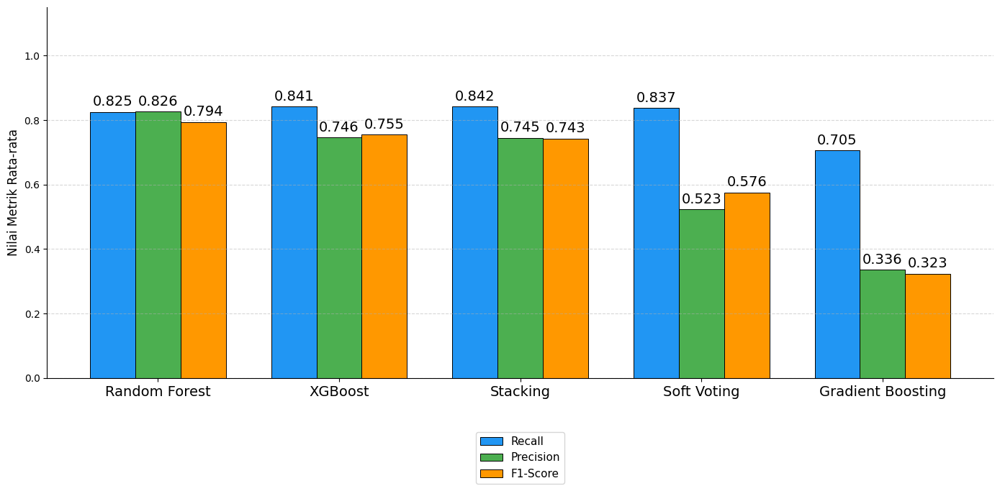

In [ ]:
# ============================================================
# GROUPED BAR CHART: RATA-RATA KINERJA PER MODEL
# ============================================================
fig, ax = plt.subplots(figsize=(14, 7))

df_avg_model = df_results.groupby('Model')[['Recall', 'Precision', 'F1-Score']].mean().reset_index()
df_avg_model = df_avg_model.sort_values('F1-Score', ascending=False)

models = df_avg_model['Model'].tolist()
recall_avg = df_avg_model['Recall'].tolist()
precision_avg = df_avg_model['Precision'].tolist()
f1_avg = df_avg_model['F1-Score'].tolist()

x = np.arange(len(models))
width = 0.25

bars1 = ax.bar(x - width, recall_avg, width, label='Recall', color='#2196F3', edgecolor='black', linewidth=0.7)
bars2 = ax.bar(x, precision_avg, width, label='Precision', color='#4CAF50', edgecolor='black', linewidth=0.7)
bars3 = ax.bar(x + width, f1_avg, width, label='F1-Score', color='#FF9800', edgecolor='black', linewidth=0.7)

ax.set_ylabel('Nilai Metrik Rata-rata', fontsize=12)
# ax.set_title('Rata-rata Recall, Precision, dan F1-Score per Model', fontsize=15, fontweight='bold', pad=20)
ax.set_xticks(x)
ax.set_xticklabels(models, fontsize=14)
ax.legend(fontsize=11, bbox_to_anchor=(0.5, -0.3), loc='lower center')
ax.grid(axis='y', linestyle='--', alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_ylim(0, 1.15)

# Anotasi bar
for bars in [bars1, bars2, bars3]:
    for bar in bars:
        yval = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2.0, yval + 0.01,
                 f'{yval:.3f}', ha='center', va='bottom', fontsize=14)

plt.tight_layout()
plt.show()


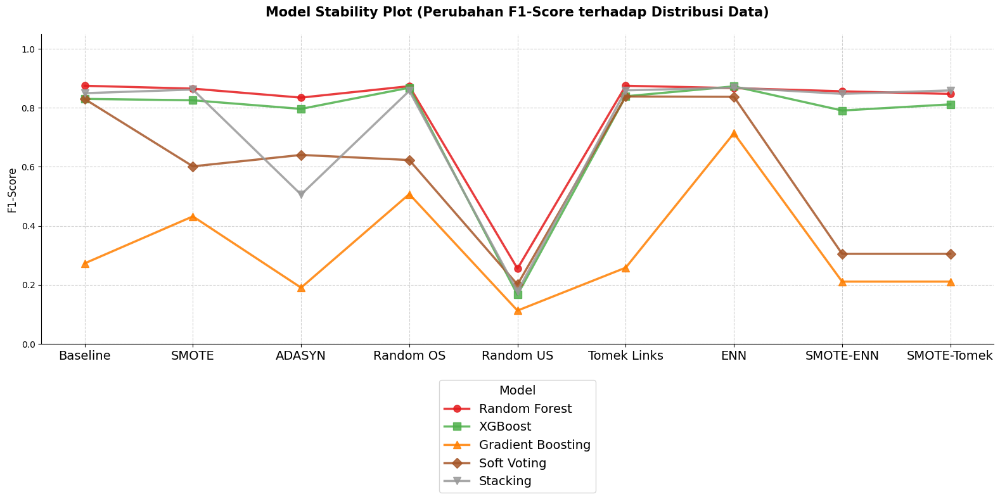

In [ ]:
# ============================================================
# MODEL STABILITY PLOT: F1-SCORE LINTAS TEKNIK RESAMPLING
# ============================================================

fig, ax = plt.subplots(figsize=(16, 9))

# Urutkan teknik resampling agar x-axis konsisten (misal Baseline pertama, lalu abjad atau by mean F1)
order_resampling = ['Baseline', 'SMOTE', 'ADASYN', 'Random OS', 'Random US', 'Tomek Links', 'ENN', 'SMOTE-ENN', 'SMOTE-Tomek']

# Mapping marker dan warna untuk variasi
markers = ['o', 's', '^', 'D', 'v', 'p']
colors_line = plt.cm.Set1(np.linspace(0, 1, len(df_results['Model'].unique())))

for idx, model in enumerate(df_results['Model'].unique()):
    subset = df_results[df_results['Model'] == model].copy()
    # Urutkan berdasarkan urutan teknik resampling
    subset['Teknik Resampling'] = pd.Categorical(subset['Teknik Resampling'], categories=order_resampling, ordered=True)
    subset = subset.sort_values('Teknik Resampling')
    
    ax.plot(subset['Teknik Resampling'], subset['F1-Score'], 
            marker=markers[idx % len(markers)], markersize=8, linewidth=2.5, 
            label=model, color=colors_line[idx], alpha=0.85)

ax.set_ylabel('F1-Score', fontsize=12)
ax.set_title('Model Stability Plot (Perubahan F1-Score terhadap Distribusi Data)', fontsize=15, fontweight='bold', pad=20)
ax.tick_params(axis='x', labelsize=14)
ax.grid(axis='both', linestyle='--', alpha=0.6)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.legend(title='Model', title_fontsize=14, fontsize=14, 
          bbox_to_anchor=(0.5, -0.5), loc='lower center', frameon=True)

# Tambahkan batas y-axis sedikit di atas nilai max untuk ruang visual
ax.set_ylim(0, 1.05)

plt.tight_layout()
plt.show()


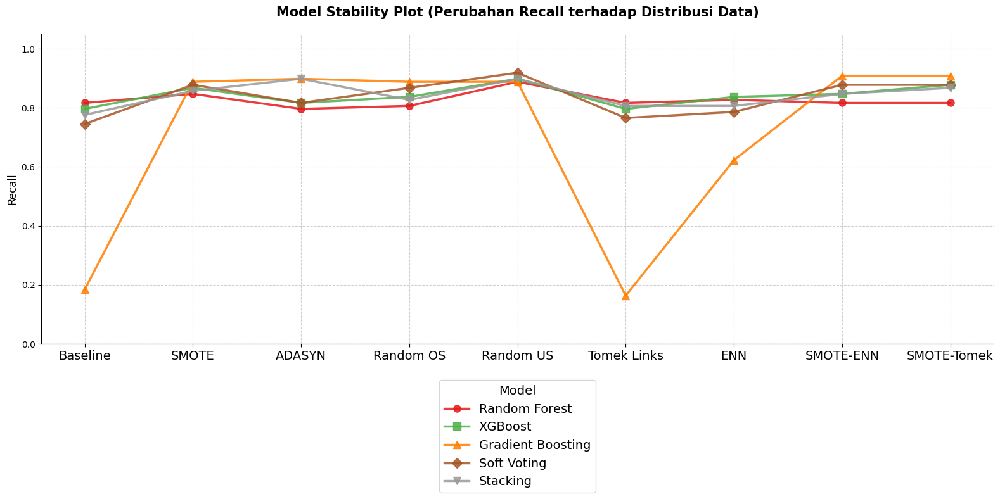

In [ ]:
# ============================================================
# MODEL STABILITY PLOT: F1-SCORE LINTAS TEKNIK RESAMPLING
# ============================================================

fig, ax = plt.subplots(figsize=(16, 9))

# Urutkan teknik resampling agar x-axis konsisten (misal Baseline pertama, lalu abjad atau by mean F1)
order_resampling = ['Baseline', 'SMOTE', 'ADASYN', 'Random OS', 'Random US', 'Tomek Links', 'ENN', 'SMOTE-ENN', 'SMOTE-Tomek']

# Mapping marker dan warna untuk variasi
markers = ['o', 's', '^', 'D', 'v', 'p']
colors_line = plt.cm.Set1(np.linspace(0, 1, len(df_results['Model'].unique())))

for idx, model in enumerate(df_results['Model'].unique()):
    subset = df_results[df_results['Model'] == model].copy()
    # Urutkan berdasarkan urutan teknik resampling
    subset['Teknik Resampling'] = pd.Categorical(subset['Teknik Resampling'], categories=order_resampling, ordered=True)
    subset = subset.sort_values('Teknik Resampling')
    
    ax.plot(subset['Teknik Resampling'], subset['Recall'], 
            marker=markers[idx % len(markers)], markersize=8, linewidth=2.5, 
            label=model, color=colors_line[idx], alpha=0.85)

ax.set_ylabel('Recall', fontsize=12)
ax.set_title('Model Stability Plot (Perubahan Recall terhadap Distribusi Data)', fontsize=15, fontweight='bold', pad=20)
ax.tick_params(axis='x', labelsize=14)
ax.grid(axis='both', linestyle='--', alpha=0.6)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.legend(title='Model', title_fontsize=14, fontsize=14, 
          bbox_to_anchor=(0.5, -0.5), loc='lower center', frameon=True)

# Tambahkan batas y-axis sedikit di atas nilai max untuk ruang visual
ax.set_ylim(0, 1.05)

plt.tight_layout()
plt.show()


/tmp/ipykernel_58/3219465616.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Model', y='F1-Score', data=df_results, ax=ax,


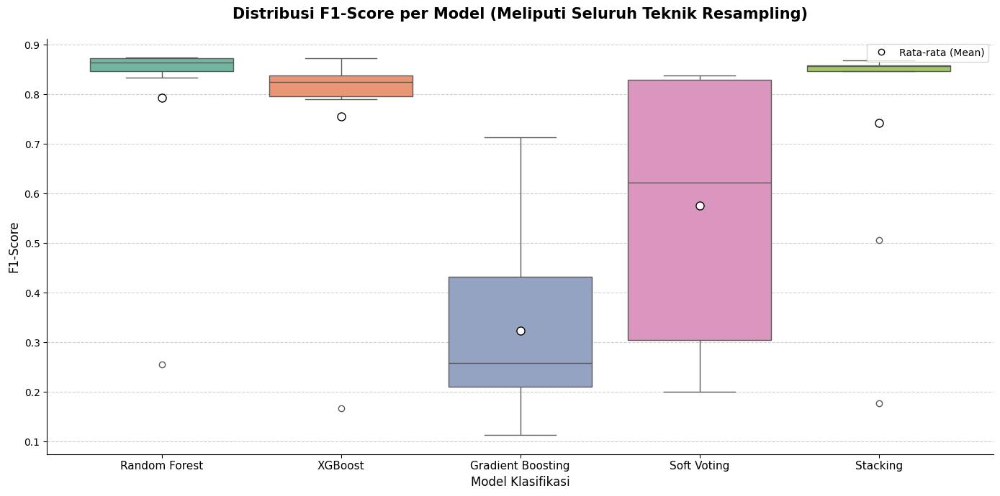

In [ ]:
# ============================================================
# BOXPLOT DISTRIBUSI F1-SCORE PER MODEL
# ============================================================

fig, ax = plt.subplots(figsize=(14, 7))

# Menggunakan Seaborn untuk Boxplot
sns.boxplot(x='Model', y='F1-Score', data=df_results, ax=ax, 
            palette='Set2', showmeans=True, 
            meanprops={"marker":"o", "markerfacecolor":"white", "markeredgecolor":"black", "markersize":"8"})

ax.set_xlabel('Model Klasifikasi', fontsize=12)
ax.set_ylabel('F1-Score', fontsize=12)
ax.set_title('Distribusi F1-Score per Model (Meliputi Seluruh Teknik Resampling)', fontsize=15, fontweight='bold', pad=20)
ax.tick_params(axis='x', labelsize=11)
ax.grid(axis='y', linestyle='--', alpha=0.6)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Keterangan tambahan untuk mean marker
ax.plot([], [], 'o', color='white', markeredgecolor='black', label='Rata-rata (Mean)')
ax.legend(loc='upper right', fontsize=10)

plt.tight_layout()
plt.show()


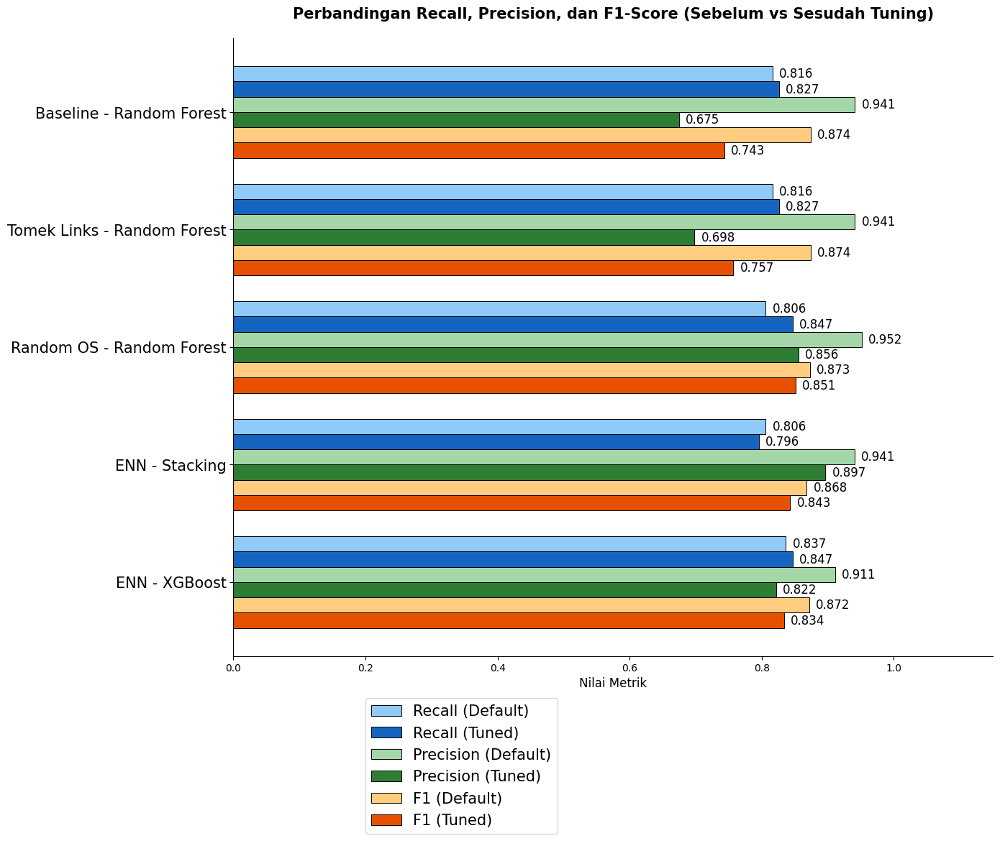

In [ ]:
# ============================================================
# HORIZONTAL CLUSTERED BAR CHART: RECALL, PRECISION, F1-SCORE
# (Default vs Tuned) dalam satu grafik horizontal
# ============================================================

fig, ax = plt.subplots(figsize=(14, 12))

y = np.arange(len(df_tuned))
height = 0.13  # Tinggi tiap bar horizontal

# Koordinat y untuk ke-6 bar per grup (dari atas ke bawah dalam grup)
# Agar urutan legenda dan bar pas, kita atur offset y:
y1 = y - 2.5 * height
y2 = y - 1.5 * height
y3 = y - 0.5 * height
y4 = y + 0.5 * height
y5 = y + 1.5 * height
y6 = y + 2.5 * height

labels = [f"{r['Teknik Resampling']} - {r['Model']}" for _, r in df_tuned.iterrows()]

bars1 = ax.barh(y1, df_tuned['Recall (Default)'], height, label='Recall (Default)', color='#90CAF9', edgecolor='black', linewidth=0.7)
bars2 = ax.barh(y2, df_tuned['Recall (Tuned)'], height, label='Recall (Tuned)', color='#1565C0', edgecolor='black', linewidth=0.7)

bars3 = ax.barh(y3, df_tuned['Precision (Default)'], height, label='Precision (Default)', color='#A5D6A7', edgecolor='black', linewidth=0.7)
bars4 = ax.barh(y4, df_tuned['Precision (Tuned)'], height, label='Precision (Tuned)', color='#2E7D32', edgecolor='black', linewidth=0.7)

bars5 = ax.barh(y5, df_tuned['F1 (Default)'], height, label='F1 (Default)', color='#FFCC80', edgecolor='black', linewidth=0.7)
bars6 = ax.barh(y6, df_tuned['F1 (Tuned)'], height, label='F1 (Tuned)', color='#E65100', edgecolor='black', linewidth=0.7)

ax.set_title('Perbandingan Recall, Precision, dan F1-Score (Sebelum vs Sesudah Tuning)', 
             fontsize=15, fontweight='bold', pad=20)
ax.set_xlabel('Nilai Metrik', fontsize=12)
ax.set_yticks(y)
ax.set_yticklabels(labels, fontsize=15)
ax.set_xlim(0, 1.15)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Balik sumbu Y agar rank #1 berada di paling atas
ax.invert_yaxis()

ax.legend(fontsize=15, bbox_to_anchor=(0.3, -0.3), loc='lower center')

# Tambahkan Anotasi teks di samping masing-masing bar
for bars in [bars1, bars2, bars3, bars4, bars5, bars6]:
    for bar in bars:
        xval = bar.get_width()
        ax.text(xval + 0.01, bar.get_y() + bar.get_height()/2.0,
                 f'{xval:.3f}', ha='left', va='center', fontsize=12)

plt.tight_layout()
plt.show()


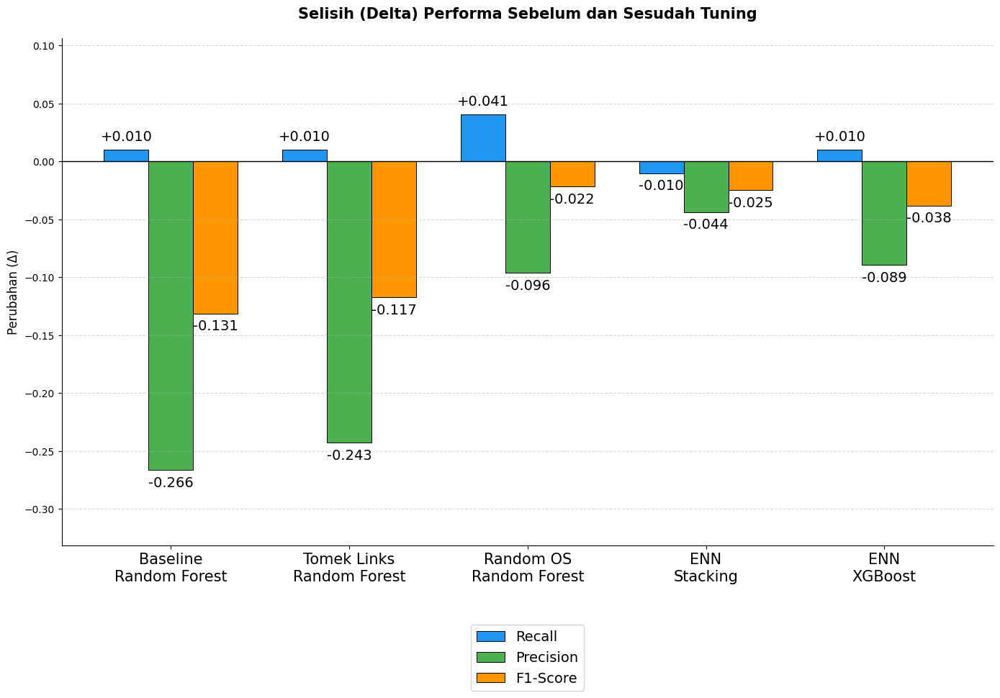

In [ ]:
# ============================================================
# GROUPED BAR CHART: DELTA RECALL, PRECISION, F1-SCORE (TUNING)
# ============================================================

fig, ax = plt.subplots(figsize=(14, 10))

x = np.arange(len(df_tuned))
width = 0.25

bars1 = ax.bar(x - width, df_tuned['Δ Recall'], width, label='Recall', color='#2196F3', edgecolor='black', linewidth=0.7)
bars2 = ax.bar(x, df_tuned['Δ Precision'], width, label='Precision', color='#4CAF50', edgecolor='black', linewidth=0.7)
bars3 = ax.bar(x + width, df_tuned['Δ F1'], width, label='F1-Score', color='#FF9800', edgecolor='black', linewidth=0.7)

ax.set_title('Selisih (Delta) Performa Sebelum dan Sesudah Tuning', fontsize=15, fontweight='bold', pad=20)
ax.set_ylabel('Perubahan (Δ)', fontsize=12)
ax.set_xticks(x)
ax.set_xticklabels(labels, fontsize=15, rotation=0)
ax.axhline(0, color='black', linewidth=1)
ax.legend(fontsize=14, bbox_to_anchor=(0.5, -0.3), loc='lower center')
ax.grid(axis='y', linestyle='--', alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Anotasi bar untuk bar positif dan negatif
for bars in [bars1, bars2, bars3]:
    for bar in bars:
        yval = bar.get_height()
        offset = 0.005 if yval >= 0 else -0.005
        va = 'bottom' if yval >= 0 else 'top'
        ax.text(bar.get_x() + bar.get_width()/2.0, yval + offset,
                 f'{yval:+.3f}', ha='center', va=va, fontsize=14)

y_min, y_max = ax.get_ylim()
ax.set_ylim(y_min - 0.05, y_max + 0.05)

plt.tight_layout()
plt.show()


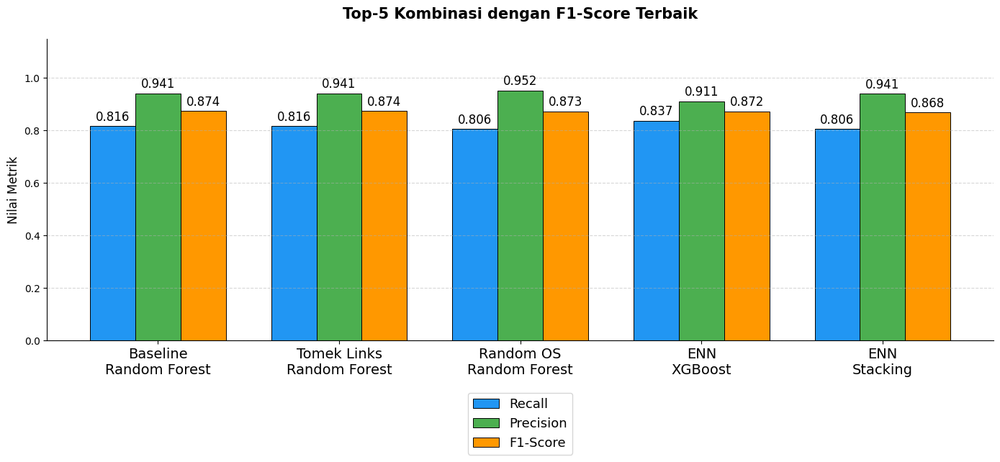

In [ ]:
# ============================================================
# CLUSTERED BAR CHART: TOP-5 KOMBINASI BERDASARKAN F1-SCORE
# ============================================================

fig, ax = plt.subplots(figsize=(14, 7))

top5_f1 = df_results.sort_values('F1-Score', ascending=False).head(5)
labels = [f"{r['Teknik Resampling']}\n{r['Model']}" for _, r in top5_f1.iterrows()]

x = np.arange(len(top5_f1))
width = 0.25

bars1 = ax.bar(x - width, top5_f1['Recall'], width, label='Recall', color='#2196F3', edgecolor='black', linewidth=0.7)
bars2 = ax.bar(x, top5_f1['Precision'], width, label='Precision', color='#4CAF50', edgecolor='black', linewidth=0.7)
bars3 = ax.bar(x + width, top5_f1['F1-Score'], width, label='F1-Score', color='#FF9800', edgecolor='black', linewidth=0.7)

ax.set_title('Top-5 Kombinasi dengan F1-Score Terbaik', fontsize=15, fontweight='bold', pad=20)
ax.set_ylabel('Nilai Metrik', fontsize=12)
ax.set_xticks(x)
ax.set_xticklabels(labels, fontsize=14)
ax.legend(fontsize=13, bbox_to_anchor=(0.5, -0.4), loc='lower center')
ax.set_ylim(0, 1.15)
ax.grid(axis='y', linestyle='--', alpha=0.5)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

for bars in [bars1, bars2, bars3]:
    for bar in bars:
        yval = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2.0, yval + 0.01,
                 f'{yval:.3f}', ha='center', va='bottom', fontsize=12)

plt.tight_layout()
plt.show()


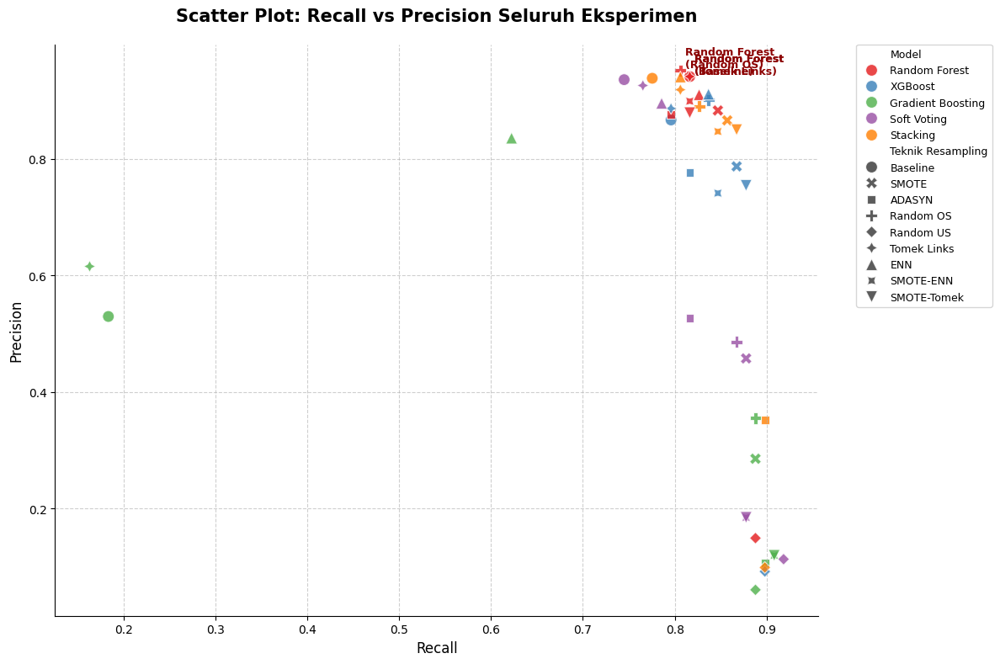

In [ ]:
# ============================================================
# SCATTER PLOT: RECALL vs PRECISION
# ============================================================

fig, ax = plt.subplots(figsize=(12, 8))

sns.scatterplot(data=df_results, x='Recall', y='Precision', hue='Model', style='Teknik Resampling',
                s=100, alpha=0.8, ax=ax, palette='Set1')

ax.set_title('Scatter Plot: Recall vs Precision Seluruh Eksperimen', fontsize=15, fontweight='bold', pad=20)
ax.set_xlabel('Recall', fontsize=12)
ax.set_ylabel('Precision', fontsize=12)
ax.grid(True, linestyle='--', alpha=0.6)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Anotasi top 3 model berdasarkan F1-score
top3 = df_results.sort_values('F1-Score', ascending=False).head(3)
for _, row in top3.iterrows():
    ax.text(row['Recall'] + 0.005, row['Precision'] + 0.005, 
            f"{row['Model']}\n({row['Teknik Resampling']})", 
            fontsize=9, fontweight='bold', color='darkred')

ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9, borderaxespad=0.)

plt.tight_layout()
plt.show()


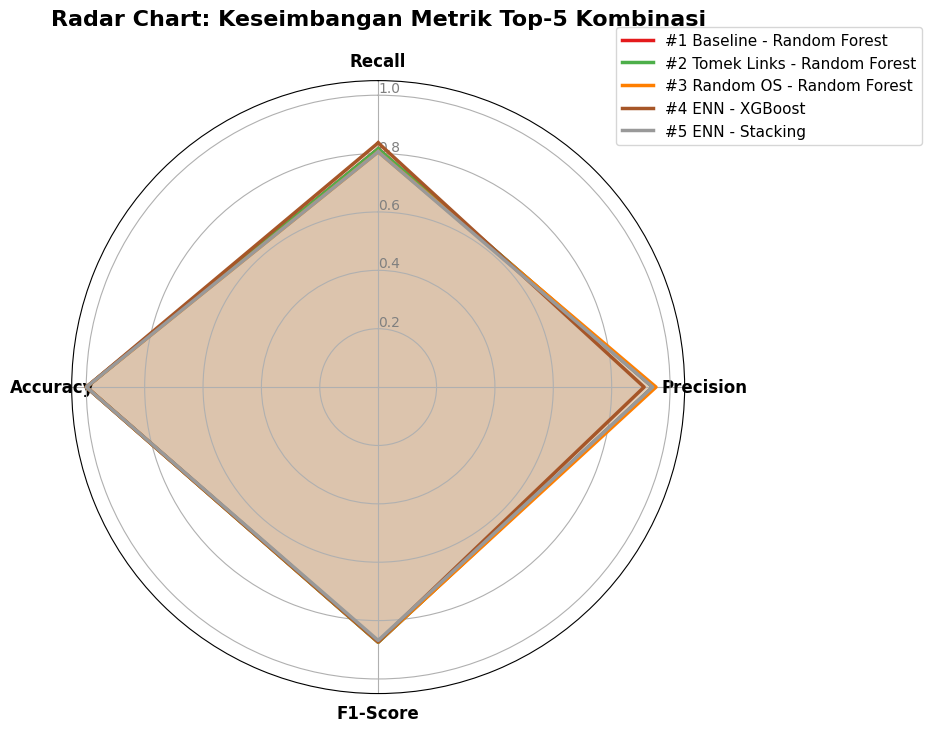

In [ ]:
# ============================================================
# RADAR CHART: TOP-5 KOMBINASI (Dedicated Plot)
# ============================================================

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, polar=True)

metrics = ['Recall', 'Precision', 'F1-Score', 'Accuracy']
N = len(metrics)
angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]

ax.set_theta_offset(pi / 2)
ax.set_theta_direction(-1)
ax.set_xticks(angles[:-1])
ax.set_xticklabels(metrics, fontsize=12, fontweight='bold')
ax.set_rlabel_position(0)
ax.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
ax.set_yticklabels(['0.2', '0.4', '0.6', '0.8', '1.0'], color='gray', size=10)
ax.set_ylim(0, 1.05)

colors_radar = plt.cm.Set1(np.linspace(0, 1, 5))
top5_radar = df_results.sort_values('F1-Score', ascending=False).head(5)

for i in range(5):
    row = top5_radar.iloc[i]
    label = f"#{i+1} {row['Teknik Resampling']} - {row['Model']}"
    values = row[metrics].tolist()
    values += values[:1]
    ax.plot(angles, values, linewidth=2.5, linestyle='solid', label=label, color=colors_radar[i])
    ax.fill(angles, values, alpha=0.1, color=colors_radar[i])

ax.set_title('Radar Chart: Keseimbangan Metrik Top-5 Kombinasi', fontsize=16, fontweight='bold', pad=40)
ax.legend(loc='upper right', bbox_to_anchor=(1.4, 1.1), fontsize=11)

plt.tight_layout()
plt.show()


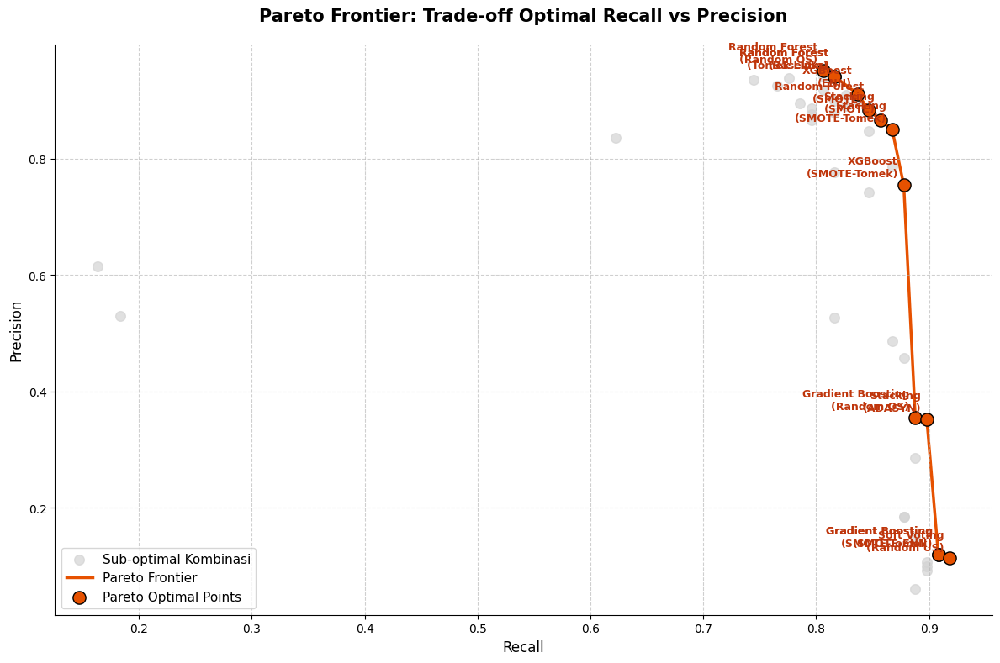

In [ ]:
# ============================================================
# PARETO FRONTIER: RECALL vs PRECISION
# ============================================================

fig, ax = plt.subplots(figsize=(12, 8))

# Identifikasi Pareto Optimal points
points = df_results[['Recall', 'Precision', 'Model', 'Teknik Resampling']].values
pareto_optimal = []
for i, p in enumerate(points):
    is_optimal = True
    for j, other in enumerate(points):
        if i == j: continue
        # Jika ada titik lain yang Recall >= dan Precision >= (dan setidaknya salah satu lebih besar)
        if other[0] >= p[0] and other[1] >= p[1] and (other[0] > p[0] or other[1] > p[1]):
            is_optimal = False
            break
    if is_optimal:
        pareto_optimal.append(p)

# Urutkan berdasarkan Recall agar garisnya menyambung dengan benar
pareto_optimal = sorted(pareto_optimal, key=lambda x: x[0])

px = [p[0] for p in pareto_optimal]
py = [p[1] for p in pareto_optimal]
plabels = [f"{p[2]}\n({p[3]})" for p in pareto_optimal]

# Plot semua titik
ax.scatter(df_results['Recall'], df_results['Precision'], color='lightgray', s=70, alpha=0.7, label='Sub-optimal Kombinasi')

# Plot garis Pareto dan titik optimal
ax.plot(px, py, color='#E65100', linestyle='-', linewidth=2.5, label='Pareto Frontier', zorder=1)
ax.scatter(px, py, color='#E65100', s=120, edgecolor='black', zorder=2, label='Pareto Optimal Points')

ax.set_title('Pareto Frontier: Trade-off Optimal Recall vs Precision', fontsize=15, fontweight='bold', pad=20)
ax.set_xlabel('Recall', fontsize=12)
ax.set_ylabel('Precision', fontsize=12)
ax.grid(True, linestyle='--', alpha=0.6)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Anotasi titik optimal
for x_val, y_val, lbl in zip(px, py, plabels):
    ax.text(x_val - 0.005, y_val + 0.01, lbl, fontsize=9, fontweight='bold', ha='right', va='bottom', color='#BF360C')

ax.legend(loc='lower left', fontsize=11)

plt.tight_layout()
plt.show()


---
# Hyperparameter Tuning (Top-5 F1-Score Terbaik)

Berdasarkan hasil eksperimen dengan parameter default, **5 kombinasi dengan F1-score tertinggi** 
dipilih untuk dilakukan hyperparameter tuning menggunakan `RandomizedSearchCV`. 
Tujuannya adalah mengetahui pengaruh hyperparameter tuning pada penelitian ini.

In [1]:
# ============================================================
# IDENTIFIKASI TOP-5 KOMBINASI F1-SCORE TERBAIK
# ============================================================

# Urutkan berdasarkan F1-Score untuk memilih top-5
top5 = df_results.sort_values("F1-Score", ascending=False).head(5).reset_index(drop=True)
top5.index += 1
top5.index.name = "Rank"

print("Top-5 Kombinasi dengan F1-Score Tertinggi (Parameter Default):")
print("=" * 80)
print(top5[["Teknik Resampling", "Model", "Recall", "Precision", "F1-Score"]].to_string())

# Mapping nama kombinasi ke data training dan model class yang sesuai
# Kita perlu memetakan setiap kombinasi ke X_train, y_train yang tepat
train_data_map = {
    "Baseline": (X_train_scaled, y_train),
    "SMOTE": (X_train_smote, y_train_smote),
    "ADASYN": (X_train_adasyn, y_train_adasyn),
    "Random OS": (X_train_ros, y_train_ros),
    "Random US": (X_train_rus, y_train_rus),
    "Tomek Links": (X_train_tomek, y_train_tomek),
    "ENN": (X_train_enn, y_train_enn),
    "SMOTE-ENN": (X_train_smoteenn, y_train_smoteenn),
    "SMOTE-Tomek": (X_train_smotetomek, y_train_smotetomek),
}


Top-5 Kombinasi dengan F1-Score Tertinggi (Parameter Default):
     Teknik Resampling          Model  Recall  Precision  F1-Score
Rank                                                              
1             Baseline  Random Forest  0.8163     0.9412    0.8743
2          Tomek Links  Random Forest  0.8163     0.9412    0.8743
3            Random OS  Random Forest  0.8061     0.9518    0.8729
4                  ENN        XGBoost  0.8367     0.9111    0.8723
5                  ENN       Stacking  0.8061     0.9405    0.8681


In [2]:
# ============================================================
# HYPERPARAMETER TUNING UNTUK TOP-5 KOMBINASI
# ============================================================

from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

# Parameter distributions per model type
param_distributions = {
    'Random Forest': {
        'n_estimators': randint(100, 500),
        'max_depth': [None, 10, 20, 30, 50],
        'min_samples_split': randint(2, 20),
        'min_samples_leaf': randint(1, 10),
        'max_features': ['sqrt', 'log2', None],
        'class_weight': ['balanced', 'balanced_subsample', None]
    },
    'XGBoost': {
        'n_estimators': randint(50, 400),
        'learning_rate': uniform(0.01, 0.3),
        'max_depth': randint(3, 10),
        'min_child_weight': randint(1, 10),
        'subsample': uniform(0.6, 0.4),
        'colsample_bytree': uniform(0.5, 0.5),
        'gamma': uniform(0, 5),
        'scale_pos_weight': [1, 5, 10, 50, 100]
    },
    'Gradient Boosting': {
        'n_estimators': randint(50, 400),
        'learning_rate': uniform(0.01, 0.3),
        'max_depth': randint(2, 8),
        'min_samples_split': randint(2, 20),
        'min_samples_leaf': randint(1, 20),
        'subsample': uniform(0.6, 0.4),
        'max_features': ['sqrt', 'log2', None]
    },
    'Soft Voting': None,  # Voting tidak bisa di-tune langsung
    'Stacking': None,     # Stacking di-tune via base learners
}

def get_base_model(model_name):
    """Buat model base sesuai nama"""
    if model_name == 'Random Forest':
        return RandomForestClassifier(random_state=42)
    elif model_name == 'XGBoost':
        return XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42, tree_method='hist', device='cuda')
    elif model_name == 'Gradient Boosting':
        return GradientBoostingClassifier(random_state=42)
    else:
        return None

def tune_model(model_name, X_train, y_train, X_test, y_test, sampling_name):
    """Lakukan RandomizedSearchCV untuk model tertentu"""
    params = param_distributions.get(model_name)
    base_model = get_base_model(model_name)

    if params is None or base_model is None:
        # Untuk Voting dan Stacking, tune base learners terpisah
        print(f"\n{'='*60}")
        print(f"TUNING: {model_name} + {sampling_name}")
        print(f"{'='*60}")

        if model_name == 'Soft Voting':
            # Tune LR, DT, SVM secara individual, lalu gabung
            from sklearn.model_selection import GridSearchCV

            # Tune Logistic Regression
            lr = LogisticRegression(max_iter=1000, random_state=42)
            lr_params = {'C': [0.01, 0.1, 1, 10, 100], 'solver': ['lbfgs', 'liblinear']}
            lr_search = GridSearchCV(lr, lr_params, scoring='recall', cv=3, n_jobs=-1)
            lr_search.fit(X_train, y_train)
            best_lr = lr_search.best_estimator_

            # Tune Decision Tree
            dt = DecisionTreeClassifier(random_state=42)
            dt_params = {'max_depth': [None, 5, 10, 20], 'min_samples_split': [2, 5, 10],
                        'min_samples_leaf': [1, 5, 10], 'class_weight': ['balanced', None]}
            dt_search = GridSearchCV(dt, dt_params, scoring='recall', cv=3, n_jobs=-1)
            dt_search.fit(X_train, y_train)
            best_dt = dt_search.best_estimator_

            # Tune SVM
            best_svm = SVC(probability=True, random_state=42, class_weight='balanced')

            # Build tuned Voting
            tuned_model = VotingClassifier(
                estimators=[('lr', best_lr), ('dt', best_dt), ('svm', best_svm)],
                voting='soft'
            )
            tuned_model.fit(X_train, y_train)
            y_pred = tuned_model.predict(X_test)

            print(f"Best LR params: {lr_search.best_params_}")
            print(f"Best DT params: {dt_search.best_params_}")

        elif model_name == 'Stacking':
            # Tune RF, XGB, GB base learners
            print("Executing Tuned RF for Stacking...")
            rf_search = RandomizedSearchCV(
                RandomForestClassifier(random_state=42),
                param_distributions['Random Forest'], n_iter=5,
                scoring='recall', cv=3, random_state=42, n_jobs=2, verbose=2)
            rf_search.fit(X_train, y_train)
            
            print("Executing Tuned XGB for Stacking...")
            xgb_search = RandomizedSearchCV(
                XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42, tree_method='hist', device='cuda'),
                param_distributions['XGBoost'], n_iter=5,
                scoring='recall', cv=3, random_state=42, n_jobs=1, verbose=2)
            xgb_search.fit(X_train, y_train)

            print("Executing Tuned GB for Stacking...")
            gb_search = RandomizedSearchCV(
                GradientBoostingClassifier(random_state=42),
                param_distributions['Gradient Boosting'], n_iter=5,
                scoring='recall', cv=3, random_state=42, n_jobs=2, verbose=2)
            gb_search.fit(X_train, y_train)

            tuned_model = StackingClassifier(
                estimators=[
                    ('rf', rf_search.best_estimator_),
                    ('xgb', xgb_search.best_estimator_),
                    ('gb', gb_search.best_estimator_)
                ],
                final_estimator=LogisticRegression(max_iter=1000),
                cv=3,
                n_jobs=-1
            )
            tuned_model.fit(X_train, y_train)
            y_pred = tuned_model.predict(X_test)

            print(f"Best RF params: {rf_search.best_params_}")
            print(f"Best XGB params: {xgb_search.best_params_}")
            print(f"Best GB params: {gb_search.best_params_}")

        print(f"\nClassification Report:")
        print(classification_report(y_test, y_pred))
        cm = confusion_matrix(y_test, y_pred)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Non-Fraud (0)', 'Fraud (1)'])
        fig, ax = plt.subplots(figsize=(5, 4))
        disp.plot(ax=ax, cmap='Blues', colorbar=True)
        ax.set_title(f'Tuned {model_name} + {sampling_name}')
        plt.tight_layout()
        plt.show()

        r = recall_score(y_test, y_pred)
        p = precision_score(y_test, y_pred)
        f = f1_score(y_test, y_pred)
        a = accuracy_score(y_test, y_pred)
        print(f"Recall   : {r}")
        print(f"Precision: {p}")
        print(f"F1 Score : {f}")
        print(f"Accuracy : {a}")
        return tuned_model, y_pred, r, p, f, a

    # Standard tuning for RF, XGB, GB
    print(f"\n{'='*60}")
    print(f"TUNING: {model_name} + {sampling_name}")
    print(f"{'='*60}")

    search = RandomizedSearchCV(
        estimator=base_model,
        param_distributions=params,
        n_iter=10,
        scoring='recall',
        cv=3,
        verbose=2,
        random_state=42,
        n_jobs=-1
    )
    search.fit(X_train, y_train)
    best_model = search.best_estimator_
    y_pred = best_model.predict(X_test)

    print(f"\nBest Parameters: {search.best_params_}")
    print(f"\nClassification Report:")
    print(classification_report(y_test, y_pred))

    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Non-Fraud (0)', 'Fraud (1)'])
    fig, ax = plt.subplots(figsize=(5, 4))
    disp.plot(ax=ax, cmap='Blues', colorbar=True)
    ax.set_title(f'Tuned {model_name} + {sampling_name}')
    plt.tight_layout()
    plt.show()

    r = recall_score(y_test, y_pred)
    p = precision_score(y_test, y_pred)
    f = f1_score(y_test, y_pred)
    a = accuracy_score(y_test, y_pred)
    print(f"Recall   : {r}")
    print(f"Precision: {p}")
    print(f"F1 Score : {f}")
    print(f"Accuracy : {a}")

    return best_model, y_pred, r, p, f, a


In [3]:
# ============================================================
# INISIALISASI: List untuk menampung hasil tuning top-5
# Jalankan sel ini sebelum menjalankan tuning masing-masing kombinasi.
# ============================================================

tuned_results = []
print("Tuned_results diinisialisasi. Siap menjalankan tuning per kombinasi.")
print(f"\nTop-5 kombinasi (F1-Score terbaik) yang akan di-tuning:")
print(top5[["Teknik Resampling", "Model", "Recall", "Precision", "F1-Score"]].to_string())


Tuned_results diinisialisasi. Siap menjalankan tuning per kombinasi.

Top-5 kombinasi (F1-Score terbaik) yang akan di-tuning:
     Teknik Resampling          Model  Recall  Precision  F1-Score
Rank                                                              
1             Baseline  Random Forest  0.8163     0.9412    0.8743
2          Tomek Links  Random Forest  0.8163     0.9412    0.8743
3            Random OS  Random Forest  0.8061     0.9518    0.8729
4                  ENN        XGBoost  0.8367     0.9111    0.8723
5                  ENN       Stacking  0.8061     0.9405    0.8681


Kombinasi 1: Baseline x Random Forest
F1-Score Default: 0.8743 | Recall Default: 0.8163

TUNING: Random Forest + Baseline
Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV] END class_weight=None, max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5, n_estimators=459; total time=131.2min
[CV] END class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=4, n_estimators=406; total time=115.8min
[CV] END class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=149; total time= 5.7min
[CV] END class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=149; total time= 5.9min
[CV] END class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=149; total time= 5.8min
[CV] END class_weight=None, max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=221; 

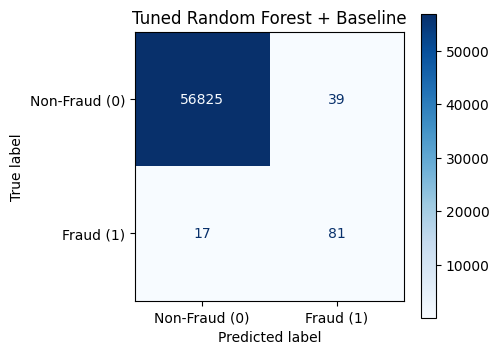

Recall   : 0.826530612244898
Precision: 0.675
F1 Score : 0.7431192660550459
Accuracy : 0.9990168884519505

Kombinasi 1 selesai. F1 Tuned: 0.7431 | Recall Tuned: 0.8265


In [2]:
# ============================================================
# TUNING KOMBINASI 1 — Rank #1 F1-Score Terbaik
# ============================================================

row = top5.iloc[0]
sampling = row["Teknik Resampling"]
model_name = row["Model"]
X_tr, y_tr = train_data_map[sampling]

recall_default = row["Recall"]
f1_default = row["F1-Score"]
print(f"Kombinasi 1: {sampling} x {model_name}")
print(f"F1-Score Default: {f1_default} | Recall Default: {recall_default}")

tuned_model_1, y_pred_tuned_1, r1, p1, f1, a1 = tune_model(
    model_name, X_tr, y_tr, X_test_scaled, y_test, sampling
)

tuned_results.append({
    "Teknik Resampling": sampling,
    "Model": model_name,
    "Recall (Default)": row["Recall"],
    "Recall (Tuned)": round(r1, 4),
    "Precision (Default)": row["Precision"],
    "Precision (Tuned)": round(p1, 4),
    "F1 (Default)": row["F1-Score"],
    "F1 (Tuned)": round(f1, 4),
})
print(f"\nKombinasi 1 selesai. F1 Tuned: {round(f1, 4)} | Recall Tuned: {round(r1, 4)}")


Kombinasi 2: Tomek Links x Random Forest
F1-Score Default: 0.8743 | Recall Default: 0.8163

TUNING: Random Forest + Tomek Links
Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV] END class_weight=None, max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=221; total time=11.5min
[CV] END class_weight=None, max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5, n_estimators=459; total time=134.3min
[CV] END class_weight=None, max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=4, n_estimators=406; total time=130.4min
[CV] END class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=149; total time= 6.6min
[CV] END class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=149; total time= 6.7min
[CV] END class_weight=None, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators

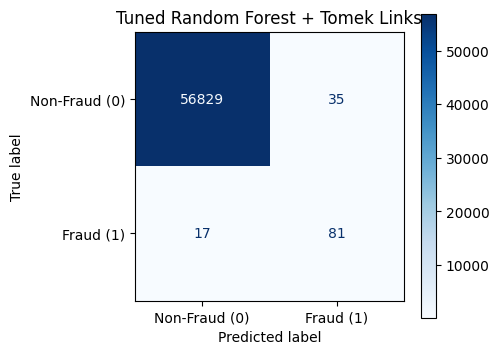

Recall   : 0.826530612244898
Precision: 0.6982758620689655
F1 Score : 0.7570093457943925
Accuracy : 0.9990871107053826

Kombinasi 2 selesai. F1 Tuned: 0.757 | Recall Tuned: 0.8265


In [1]:
# ============================================================
# TUNING KOMBINASI 2 — Rank #2 F1-Score Terbaik
# ============================================================

row = top5.iloc[1]
sampling = row["Teknik Resampling"]
model_name = row["Model"]
X_tr, y_tr = train_data_map[sampling]

recall_default = row["Recall"]
f1_default = row["F1-Score"]
print(f"Kombinasi 2: {sampling} x {model_name}")
print(f"F1-Score Default: {f1_default} | Recall Default: {recall_default}")

tuned_model_2, y_pred_tuned_2, r2, p2, f2, a2 = tune_model(
    model_name, X_tr, y_tr, X_test_scaled, y_test, sampling
)

tuned_results.append({
    "Teknik Resampling": sampling,
    "Model": model_name,
    "Recall (Default)": row["Recall"],
    "Recall (Tuned)": round(r2, 4),
    "Precision (Default)": row["Precision"],
    "Precision (Tuned)": round(p2, 4),
    "F1 (Default)": row["F1-Score"],
    "F1 (Tuned)": round(f2, 4),
})
print(f"\nKombinasi 2 selesai. F1 Tuned: {round(f2, 4)} | Recall Tuned: {round(r2, 4)}")


Kombinasi 3: Random OS x Random Forest
F1-Score Default: 0.8729 | Recall Default: 0.8061

TUNING: Random Forest + Random OS
Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV] END class_weight=None, max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5, n_estimators=459; total time=132.0min
[CV] END class_weight=balanced_subsample, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=11, n_estimators=287; total time=11.9min
[CV] END class_weight=None, max_depth=50, max_features=sqrt, min_samples_leaf=7, min_samples_split=19, n_estimators=487; total time=22.8min
[CV] END class_weight=None, max_depth=50, max_features=sqrt, min_samples_leaf=7, min_samples_split=19, n_estimators=487; total time=23.0min
[CV] END class_weight=None, max_depth=50, max_features=sqrt, min_samples_leaf=7, min_samples_split=19, n_estimators=487; total time=22.7min
[CV] END class_weight=balanced, max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_spli

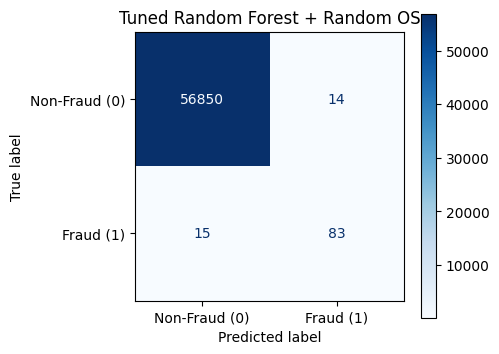

Recall   : 0.8469387755102041
Precision: 0.8556701030927835
F1 Score : 0.8512820512820513
Accuracy : 0.9994908886626171

Kombinasi 3 selesai. F1 Tuned: 0.8513 | Recall Tuned: 0.8469


In [2]:
# ============================================================
# TUNING KOMBINASI 3 — Rank #3 F1-Score Terbaik
# ============================================================

row = top5.iloc[2]
sampling = row["Teknik Resampling"]
model_name = row["Model"]
X_tr, y_tr = train_data_map[sampling]

recall_default = row["Recall"]
f1_default = row["F1-Score"]
print(f"Kombinasi 3: {sampling} x {model_name}")
print(f"F1-Score Default: {f1_default} | Recall Default: {recall_default}")

tuned_model_3, y_pred_tuned_3, r3, p3, f3, a3 = tune_model(
    model_name, X_tr, y_tr, X_test_scaled, y_test, sampling
)

tuned_results.append({
    "Teknik Resampling": sampling,
    "Model": model_name,
    "Recall (Default)": row["Recall"],
    "Recall (Tuned)": round(r3, 4),
    "Precision (Default)": row["Precision"],
    "Precision (Tuned)": round(p3, 4),
    "F1 (Default)": row["F1-Score"],
    "F1 (Tuned)": round(f3, 4),
})
print(f"\nKombinasi 3 selesai. F1 Tuned: {round(f3, 4)} | Recall Tuned: {round(r3, 4)}")


Kombinasi 4: ENN x XGBoost
F1-Score Default: 0.8723 | Recall Default: 0.8367

TUNING: XGBoost + ENN
Fitting 3 folds for each of 10 candidates, totalling 30 fits


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [03:47:23] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [03:47:23] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [03:47:23] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [03:47:23] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/core.py:751:


Best Parameters: {'colsample_bytree': np.float64(0.6293899908000085), 'gamma': np.float64(3.31261142176991), 'learning_rate': np.float64(0.10351332282682328), 'max_depth': 8, 'min_child_weight': 6, 'n_estimators': 155, 'scale_pos_weight': 50, 'subsample': np.float64(0.6739417822102108)}

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.82      0.85      0.83        98

    accuracy                           1.00     56962
   macro avg       0.91      0.92      0.92     56962
weighted avg       1.00      1.00      1.00     56962



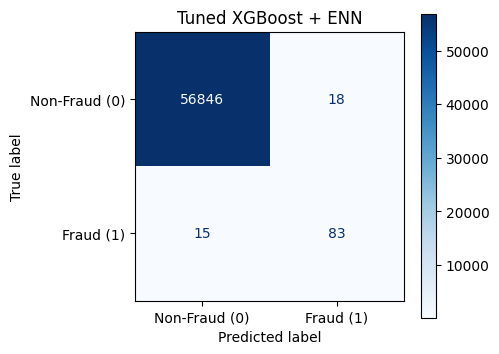

Recall   : 0.8469387755102041
Precision: 0.8217821782178217
F1 Score : 0.8341708542713567
Accuracy : 0.999420666409185

Kombinasi 4 selesai. F1 Tuned: 0.8342 | Recall Tuned: 0.8469


In [4]:
# ============================================================
# TUNING KOMBINASI 4 — Rank #4 F1-Score Terbaik
# ============================================================

row = top5.iloc[3]
sampling = row["Teknik Resampling"]
model_name = row["Model"]
X_tr, y_tr = train_data_map[sampling]

recall_default = row["Recall"]
f1_default = row["F1-Score"]
print(f"Kombinasi 4: {sampling} x {model_name}")
print(f"F1-Score Default: {f1_default} | Recall Default: {recall_default}")

tuned_model_4, y_pred_tuned_4, r4, p4, f4, a4 = tune_model(
    model_name, X_tr, y_tr, X_test_scaled, y_test, sampling
)

tuned_results.append({
    "Teknik Resampling": sampling,
    "Model": model_name,
    "Recall (Default)": row["Recall"],
    "Recall (Tuned)": round(r4, 4),
    "Precision (Default)": row["Precision"],
    "Precision (Tuned)": round(p4, 4),
    "F1 (Default)": row["F1-Score"],
    "F1 (Tuned)": round(f4, 4),
})
print(f"\nKombinasi 4 selesai. F1 Tuned: {round(f4, 4)} | Recall Tuned: {round(r4, 4)}")


Kombinasi 5: ENN x Stacking
F1-Score Default: 0.8681 | Recall Default: 0.8061

TUNING: Stacking + ENN
Executing Tuned RF for Stacking...
Fitting 3 folds for each of 5 candidates, totalling 15 fits
[CV] END class_weight=None, max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=8, n_estimators=221; total time= 6.0min
[CV] END class_weight=None, max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5, n_estimators=459; total time=72.9min
[CV] END class_weight=None, max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=13, n_estimators=393; total time= 8.2min
[CV] END class_weight=None, max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=13, n_estimators=393; total time= 8.4min
[CV] END class_weight=None, max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=13, n_estimators=393; total time= 8.4min
[CV] END class_weight=balanced_subsample, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_sample

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [22:36:58] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/core.py:751: UserWarning: [22:36:58] WARNING: /__w/xgboost/xgboost/src/common/error_msg.cc:62: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.

  return func(**kwargs)


[CV] END colsample_bytree=0.6872700594236812, gamma=4.75357153204958, learning_rate=0.22959818254342154, max_depth=7, min_child_weight=5, n_estimators=152, scale_pos_weight=5, subsample=0.662397808134481; total time=   1.2s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [22:36:59] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bytree=0.6872700594236812, gamma=4.75357153204958, learning_rate=0.22959818254342154, max_depth=7, min_child_weight=5, n_estimators=152, scale_pos_weight=5, subsample=0.662397808134481; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [22:36:59] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bytree=0.6872700594236812, gamma=4.75357153204958, learning_rate=0.22959818254342154, max_depth=7, min_child_weight=5, n_estimators=152, scale_pos_weight=5, subsample=0.662397808134481; total time=   0.6s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [22:37:00] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bytree=0.5290418060840998, gamma=4.330880728874676, learning_rate=0.19033450352296263, max_depth=5, min_child_weight=6, n_estimators=358, scale_pos_weight=5, subsample=0.8887995089067299; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [22:37:01] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bytree=0.5290418060840998, gamma=4.330880728874676, learning_rate=0.19033450352296263, max_depth=5, min_child_weight=6, n_estimators=358, scale_pos_weight=5, subsample=0.8887995089067299; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [22:37:02] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bytree=0.5290418060840998, gamma=4.330880728874676, learning_rate=0.19033450352296263, max_depth=5, min_child_weight=6, n_estimators=358, scale_pos_weight=5, subsample=0.8887995089067299; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [22:37:03] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bytree=0.9692763545078751, gamma=0.0038938292050716417, learning_rate=0.30766346778736525, max_depth=3, min_child_weight=6, n_estimators=302, scale_pos_weight=50, subsample=0.6092249700165663; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [22:37:03] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bytree=0.9692763545078751, gamma=0.0038938292050716417, learning_rate=0.30766346778736525, max_depth=3, min_child_weight=6, n_estimators=302, scale_pos_weight=50, subsample=0.6092249700165663; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [22:37:04] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bytree=0.9692763545078751, gamma=0.0038938292050716417, learning_rate=0.30766346778736525, max_depth=3, min_child_weight=6, n_estimators=302, scale_pos_weight=50, subsample=0.6092249700165663; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [22:37:05] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bytree=0.7623873301291946, gamma=1.9993048585762774, learning_rate=0.023999698964084628, max_depth=6, min_child_weight=3, n_estimators=104, scale_pos_weight=50, subsample=0.836965827544817; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [22:37:06] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bytree=0.7623873301291946, gamma=1.9993048585762774, learning_rate=0.023999698964084628, max_depth=6, min_child_weight=3, n_estimators=104, scale_pos_weight=50, subsample=0.836965827544817; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [22:37:07] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bytree=0.7623873301291946, gamma=1.9993048585762774, learning_rate=0.023999698964084628, max_depth=6, min_child_weight=3, n_estimators=104, scale_pos_weight=50, subsample=0.836965827544817; total time=   0.7s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [22:37:07] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bytree=0.5232252063599989, gamma=3.0377242595071916, learning_rate=0.06115723710618746, max_depth=9, min_child_weight=2, n_estimators=138, scale_pos_weight=50, subsample=0.8253152871382157; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [22:37:08] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bytree=0.5232252063599989, gamma=3.0377242595071916, learning_rate=0.06115723710618746, max_depth=9, min_child_weight=2, n_estimators=138, scale_pos_weight=50, subsample=0.8253152871382157; total time=   0.8s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [22:37:09] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END colsample_bytree=0.5232252063599989, gamma=3.0377242595071916, learning_rate=0.06115723710618746, max_depth=9, min_child_weight=2, n_estimators=138, scale_pos_weight=50, subsample=0.8253152871382157; total time=   0.9s


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [22:37:10] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Executing Tuned GB for Stacking...
Fitting 3 folds for each of 5 candidates, totalling 15 fits
[CV] END learning_rate=0.12236203565420874, max_depth=6, max_features=None, min_samples_leaf=11, min_samples_split=9, n_estimators=238, subsample=0.8387400631785948; total time=19.6min
[CV] END learning_rate=0.12236203565420874, max_depth=6, max_features=None, min_samples_leaf=11, min_samples_split=9, n_estimators=238, subsample=0.8387400631785948; total time=19.4min
[CV] END learning_rate=0.14374982585607735, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=9, n_estimators=201, subsample=0.8603553891795411; total time=11.0min
[CV] END learning_rate=0.19524445288831496, max_depth=3, max_features=log2, min_samples_leaf=12, min_samples_split=18, n_estimators=108, subsample=0.7599443886861021; total time=  33.5s
[CV] END learning_rate=0.19524445288831496, max_depth=3, max_features=log2, min_samples_leaf=12, min_samples_split=18, n_estimators=108, subsample=0.7599443886861021

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [23:56:43] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
[01:57:40] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

[01:57:40] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

[01:57:40] WARNING: /__w/xgboost/xgboost/src/learner.cc:782: 
Parameters: { "use_label_encoder" } are not used.

[01:57:43] WARNING: /__w/xgboost/xgboost/src/common/error_msg.cc:62: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This war

Best RF params: {'class_weight': None, 'max_depth': 20, 'max_features': None, 'min_samples_leaf': 8, 'min_samples_split': 5, 'n_estimators': 459}
Best XGB params: {'colsample_bytree': np.float64(0.9692763545078751), 'gamma': np.float64(0.0038938292050716417), 'learning_rate': np.float64(0.30766346778736525), 'max_depth': 3, 'min_child_weight': 6, 'n_estimators': 302, 'scale_pos_weight': 50, 'subsample': np.float64(0.6092249700165663)}
Best GB params: {'learning_rate': np.float64(0.023999698964084628), 'max_depth': 5, 'max_features': None, 'min_samples_leaf': 15, 'min_samples_split': 13, 'n_estimators': 104, 'subsample': np.float64(0.9932923543227152)}

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.90      0.80      0.84        98

    accuracy                           1.00     56962
   macro avg       0.95      0.90      0.92     56962
weighted avg       1.00      1.00      1.00 

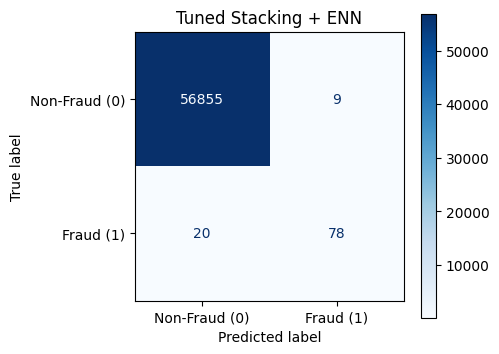

Recall   : 0.7959183673469388
Precision: 0.896551724137931
F1 Score : 0.8432432432432433
Accuracy : 0.9994908886626171

Kombinasi 5 selesai. F1 Tuned: 0.8432 | Recall Tuned: 0.7959


In [3]:
# ============================================================
# TUNING KOMBINASI 5 — Rank #5 F1-Score Terbaik
# ============================================================

row = top5.iloc[4]
sampling = row["Teknik Resampling"]
model_name = row["Model"]
X_tr, y_tr = train_data_map[sampling]

recall_default = row["Recall"]
f1_default = row["F1-Score"]
print(f"Kombinasi 5: {sampling} x {model_name}")
print(f"F1-Score Default: {f1_default} | Recall Default: {recall_default}")

tuned_model_5, y_pred_tuned_5, r5, p5, f5, a5 = tune_model(
    model_name, X_tr, y_tr, X_test_scaled, y_test, sampling
)

tuned_results.append({
    "Teknik Resampling": sampling,
    "Model": model_name,
    "Recall (Default)": row["Recall"],
    "Recall (Tuned)": round(r5, 4),
    "Precision (Default)": row["Precision"],
    "Precision (Tuned)": round(p5, 4),
    "F1 (Default)": row["F1-Score"],
    "F1 (Tuned)": round(f5, 4),
})
print(f"\nKombinasi 5 selesai. F1 Tuned: {round(f5, 4)} | Recall Tuned: {round(r5, 4)}")


## Perbandingan Performa: Default vs Tuned

PERBANDINGAN PERFORMA: PARAMETER DEFAULT vs TUNED (TOP-5 RECALL TERBAIK)
Teknik Resampling         Model  Recall (Default)  Recall (Tuned)  Precision (Default)  Precision (Tuned)  F1 (Default)  F1 (Tuned)  Δ Recall  Δ Precision    Δ F1
         Baseline Random Forest            0.8163          0.8265               0.9412             0.6750        0.8743      0.7431    0.0102      -0.2662 -0.1312
      Tomek Links Random Forest            0.8163          0.8265               0.9412             0.6983        0.8743      0.7570    0.0102      -0.2429 -0.1173
        Random OS Random Forest            0.8061          0.8469               0.9518             0.8557        0.8729      0.8513    0.0408      -0.0961 -0.0216
              ENN      Stacking            0.8061          0.7959               0.9405             0.8966        0.8681      0.8432   -0.0102      -0.0439 -0.0249
              ENN       XGBoost            0.8367          0.8469               0.9111             0.8218       

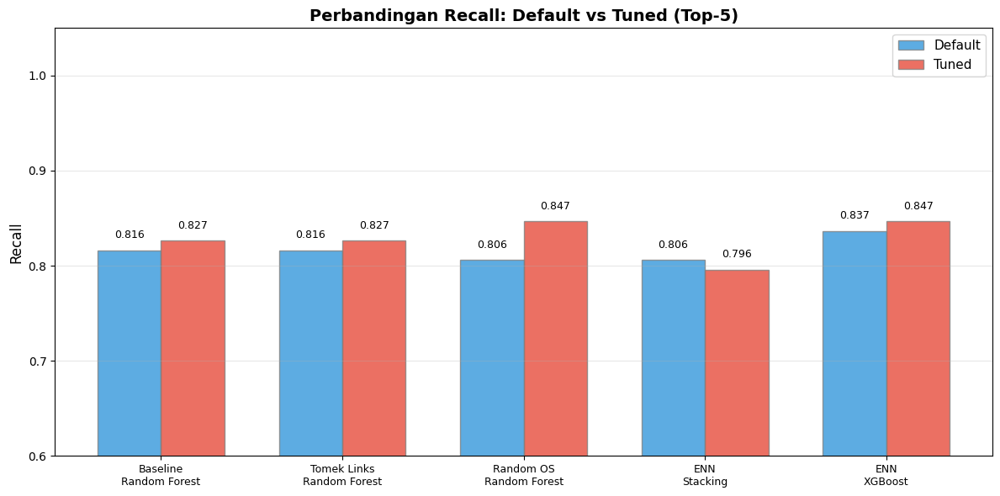

In [13]:
# ============================================================
# TABEL PERBANDINGAN: DEFAULT vs TUNED (TOP-5)
# ============================================================

df_tuned = pd.DataFrame(tuned_results)

# Hitung delta
df_tuned['Δ Recall'] = (df_tuned['Recall (Tuned)'] - df_tuned['Recall (Default)']).round(4)
df_tuned['Δ Precision'] = (df_tuned['Precision (Tuned)'] - df_tuned['Precision (Default)']).round(4)
df_tuned['Δ F1'] = (df_tuned['F1 (Tuned)'] - df_tuned['F1 (Default)']).round(4)

print("=" * 100)
print("PERBANDINGAN PERFORMA: PARAMETER DEFAULT vs TUNED (TOP-5 RECALL TERBAIK)")
print("=" * 100)
print(df_tuned.to_string(index=False))

# Visualisasi perbandingan
fig, ax = plt.subplots(figsize=(12, 6))
x = np.arange(len(df_tuned))
width = 0.35
labels = [f"{r['Teknik Resampling']}\n{r['Model']}" for _, r in df_tuned.iterrows()]

bars1 = ax.bar(x - width/2, df_tuned['Recall (Default)'], width, label='Default',
               color='#3498db', alpha=0.8, edgecolor='gray')
bars2 = ax.bar(x + width/2, df_tuned['Recall (Tuned)'], width, label='Tuned',
               color='#e74c3c', alpha=0.8, edgecolor='gray')

ax.set_ylabel('Recall', fontsize=12)
ax.set_title('Perbandingan Recall: Default vs Tuned (Top-5)', fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=0, ha='center', fontsize=9)
ax.legend(fontsize=11)
ax.set_ylim([0.6, 1.05])
ax.grid(axis='y', alpha=0.3)

# Tambahkan label nilai
for bar in bars1:
    ax.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.01,
           f'{bar.get_height():.3f}', ha='center', va='bottom', fontsize=9)
for bar in bars2:
    ax.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.01,
           f'{bar.get_height():.3f}', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()


# Plot interactive

In [11]:
def plot_distribution(
    X,
    y,
    title="3D Data Distribution",
    sample_majority=10000,
    random_state=42
):

    # ==========================
    # PCA → 3 dimensi
    # ==========================
    pca = PCA(n_components=3)

    X_pca = pca.fit_transform(X)

    df_plot = pd.DataFrame({
        'PC1': X_pca[:,0],
        'PC2': X_pca[:,1],
        'PC3': X_pca[:,2],
        'Class': y
    })

    # ==========================
    # Subsample kelas mayoritas
    # supaya visual lebih jelas
    # ==========================

    fraud = df_plot[df_plot['Class']==1]
    nonfraud = df_plot[df_plot['Class']==0]

    if len(nonfraud) > sample_majority:

        nonfraud = nonfraud.sample(
            sample_majority,
            random_state=random_state
        )

    df_plot = pd.concat(
        [nonfraud, fraud],
        axis=0
    )

    # ==========================
    # Label class
    # ==========================

    df_plot['Class'] = df_plot['Class'].map({
        0:'Non-Fraud',
        1:'Fraud'
    })

    # ==========================
    # Plot interactive
    # ==========================

    fig = px.scatter_3d(
        df_plot,

        x='PC1',
        y='PC2',
        z='PC3',

        color='Class',

        color_discrete_map={
            'Non-Fraud':'dodgerblue',
            'Fraud':'red'
        },

        opacity=0.7,

        title=title,

        width=900,
        height=700
    )

    fig.update_traces(
        marker=dict(
            size=3
        )
    )

    # Fraud dibuat lebih menonjol

    fig.for_each_trace(
        lambda trace:
        trace.update(
            marker=dict(
                size=6
            )
        )
        if trace.name=='Fraud'
        else ()
    )

    # Fixed scale

    fig.update_layout(

        scene=dict(

            xaxis=dict(
                range=[-15,15]
            ),

            yaxis=dict(
                range=[-15,15]
            ),

            zaxis=dict(
                range=[-15,15]
            )

        ),

        legend=dict(
            y=0.95
        )
    )

    fig.show()

In [12]:
plot_distribution(X_train_scaled, y_train, title="Before Sampling")
plot_distribution(X_train_smote, y_train_smote, title="After SMOTE")

In [ ]:
plot_distribution(X_train_scaled, y_train, "Before Sampling")
plot_distribution(X_train_adasyn, y_train_adasyn, "After ADASYN")

In [ ]:
plot_distribution(X_train_scaled, y_train, "Before Sampling")
plot_distribution(X_train_ros, y_train_ros, "After Random Oversampling")

In [ ]:
plot_distribution(X_train_scaled, y_train, "Before Sampling")
plot_distribution(X_train_rus, y_train_rus, "After RUS")

In [ ]:
plot_distribution(X_train_scaled, y_train, "Before Sampling")
plot_distribution(X_train_tomek, y_train_tomek, "After Tomek Links")

In [ ]:
plot_distribution(X_train_scaled, y_train, "Before Sampling")
plot_distribution(X_train_enn, y_train_enn, "After ENN")

In [ ]:
plot_distribution(X_train_scaled, y_train, "Before Sampling")
plot_distribution(X_train_smoteenn, y_train_smoteenn, "After SMOTE-ENN")

In [ ]:
plot_distribution(X_train_scaled, y_train, "Before Sampling")
plot_distribution(X_train_smotetomek, y_train_smotetomek, "After SMOTE-Tomek")

[CV] END colsample_bytree=0.6872700594236812, gamma=4.75357153204958, learning_rate=0.22959818254342154, max_depth=7, min_child_weight=5, n_estimators=152, scale_pos_weight=5, subsample=0.662397808134481; total time=   3.8s
[CV] END colsample_bytree=0.9692763545078751, gamma=0.0038938292050716417, learning_rate=0.30766346778736525, max_depth=3, min_child_weight=6, n_estimators=302, scale_pos_weight=50, subsample=0.6092249700165663; total time=   3.9s
[CV] END colsample_bytree=0.7623873301291946, gamma=1.9993048585762774, learning_rate=0.023999698964084628, max_depth=6, min_child_weight=3, n_estimators=104, scale_pos_weight=50, subsample=0.836965827544817; total time=   2.9s
[CV] END colsample_bytree=0.692708251269958, gamma=0.07983126110107097, learning_rate=0.0792681476866447, max_depth=6, min_child_weight=7, n_estimators=313, scale_pos_weight=10, subsample=0.9637281608315128; total time=   4.6s
[CV] END colsample_bytree=0.6293899908000085, gamma=3.31261142176991, learning_rate=0.1035